In [0]:
import numpy as np
import cv2
import csv
import os, shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
import time
%matplotlib inline

plt.rcParams["axes.grid"] = False # to disable grid output

#from google.colab import drive
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Activation, BatchNormalization, Dense, Dropout, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers

from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose

#from tensorflow.keras.preprocessing import image # 影象預處理模組

Using TensorFlow backend.


In [0]:
import os
from google.colab import drive
drive.mount('/gdrive')
os.symlink('/gdrive/My Drive', '/content/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


FileExistsError: ignored

In [0]:
# Input data path
root_d = '/content/gdrive/' # the path of parking_dataset

orgin_dir = root_d + 'parking_dataset/'
#orgin_dir = root_d + 'Download_data_example_1/'
train_dir = orgin_dir + "CNR-EXT-Patches-150x150/train_small"
validation_dir = orgin_dir + "CNR-EXT-Patches-150x150/validation_small"
test_dir = orgin_dir + "CNR-EXT-Patches-150x150/test_small"

# Data pre-processing

###Create train, validation and test dataset from download database

##### Download and Create train, validation and test dataset in CNR-EXT datbase (link: http://cnrpark.it/)


In [0]:
# Save all train, test, val dataset
import os
import shutil
import time
from zipfile import ZipFile 
import requests
import tarfile
#root_dir = '/content/gdrive/' + 'parking_dataset_a/'
#dataset_dir = root_dir + 'CNR-EXT-Patches-150x150/'

root_dir = orgin_dir
dataset_dir = root_dir + 'CNR-EXT-Patches-150x150/'

def download_zip(save_d):
    # download the dataset
    if not os.path.exists(save_d):
        os.makedirs(save_d)
    url = 'http://cnrpark.it/dataset/CNR-EXT-Patches-150x150.zip'
    myfile = requests.get(url)
    fn = save_d + 'CNR-EXT-Patches-150x150.zip'
    open(fn, 'wb').write(myfile.content)

    # opening the zip file in READ mode 
    with ZipFile(fn, 'r') as zip: 
        # printing all the contents of the zip file 
        zip.printdir() 
        # extracting all the files 
        print('Extracting all the files now...') 
        zip.extractall(save_d) 
        print('Done!') 

def download_tar(save_d):
    # download the dataset
    if not os.path.exists(save_d):
        os.makedirs(save_d)
    url = 'http://cnrpark.it/dataset/CNR-EXT_FULL_IMAGE_1000x750.tar'
    myfile = requests.get(url)
    file_dir = save_d + 'full_image_and_csv.tar'
    print('Downloading all the files now...') 
    open(file_dir, 'wb').write(myfile.content)
    print('Done!')
    print('Extracting all the files now...') 
    tar = tarfile.open(file_dir)
    tar.extractall(save_d)
    tar.close()
    print('Done!\n')

def create_save_path(save_dir):
    if not os.path.exists(save_dir + 'train/busy'):
        os.makedirs(save_dir + 'train/busy')
    if not os.path.exists(save_dir + 'train/free'):
        os.makedirs(save_dir + 'train/free')
    if not os.path.exists(save_dir + 'test/busy'):
        os.makedirs(save_dir + 'test/busy')
    if not os.path.exists(save_dir + 'test/free'):
        os.makedirs(save_dir + 'test/free')
    if not os.path.exists(save_dir + 'val/busy'):
        os.makedirs(save_dir + 'val/busy')
    if not os.path.exists(save_dir + 'val/free'):
        os.makedirs(save_dir + 'val/free')

def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    download_zip(root_dir)
    download_tar(root_dir)
    f_n = root_dir + 'LABELS/'
    fn = f_n + 'train.txt'
    train_path = [line for line in open(f_n + 'train.txt')]
    test_path = [line for line in open(f_n + 'test.txt')]
    val_path = [line for line in open(f_n + 'val.txt')]    
    #print(val_path)
    
    count = 0
    nb = 0
    nf = 0
    for li in train_path:
        count += 1
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        print('\r',str(count),' ',source_n,end='')
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'train/busy/' + li.split(' ')[0].split('/')[-1]
            nb += 1
        else:
            sname = save_dir + 'train/free/' + li.split(' ')[0].split('/')[-1]
            nf += 1
        print('\r',str(count),' ',sname,end='')
        shutil.copy(source_n, sname)

    print('\nCNR-EXT train dataset\nBusy image:%d\nFree image:%d'%(nb, nf))
    print('Total image in train dataset:%d\n'%(nb+nf))

    nb_before = nb
    nf_before = nf
    count = 0
    for li in test_path:
        count += 1  
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        #print('\r',str(count),' ',source_n,end='')
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'test/busy/' + li.split(' ')[0].split('/')[-1]
            nb += 1
        else:
            sname = save_dir + 'test/free/' + li.split(' ')[0].split('/')[-1]
            nf += 1
        print('\r',str(count),' ',source_n,end='')
        shutil.copy(source_n, sname)

    print('\nCNR-EXT test dataset\nBusy image:%d\nFree image:%d'%(nb-nb_before, nf-nf_before))
    print('Total image in test dataset:%d\n'%(nb+nf-nb_before-nf_before))

    nb_before = nb
    nf_before = nf
    count = 0
    for li in val_path:
        count += 1
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'val/busy/' + li.split(' ')[0].split('/')[-1]
            nb += 1
        else:
            sname = save_dir + 'val/free/' + li.split(' ')[0].split('/')[-1]
            nf += 1
        print('\r',str(count),' ',source_n,end='')
        shutil.copy(source_n, sname)
    print('\nCNR-EXT val dataset\nBusy image:%d\nFree image:%d'%(nb-nb_before, nf-nf_before))
    print('Total image in val dataset:%d\n'%(nb+nf-nb_before-nf_before))

    print('\n\n>>>CNR-EXT database\nBusy image:%d\nFree image:%d'%(nb-nb_before, nf-nf_before))
    print('Total image in CNR-EXT database:%d\n'%(nb+nf-nb_before-nf_before))

def create_small_parking_dataset(save_dir):
    if not os.path.exists(save_dir + 'train_samll/busy'):
        os.makedirs(save_dir + 'train_samll/busy')
    if not os.path.exists(save_dir + 'train_samll/free'):
        os.makedirs(save_dir + 'train_samll/free')
    if not os.path.exists(save_dir + 'test_small/busy'):
        os.makedirs(save_dir + 'test_small/busy')
    if not os.path.exists(save_dir + 'test_small/free'):
        os.makedirs(save_dir + 'test_small/free')
    if not os.path.exists(save_dir + 'val_small/busy'):
        os.makedirs(save_dir + 'val_small/busy')
    if not os.path.exists(save_dir + 'val_small/free'):
        os.makedirs(save_dir + 'val_small/free')

    f_n = root_dir + 'LABELS/'
    fn = f_n + 'train.txt'
    train_path = [line for line in open(f_n + 'train.txt')]
    test_path = [line for line in open(f_n + 'test.txt')]
    val_path = [line for line in open(f_n + 'val.txt')]    
    #print(val_path)
    
    count = 0
    for li in train_path:
        if count == 5000:
            break
        count += 1
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        print('\r',str(count),' ',source_n,end='')
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'train_samll/busy/' + li.split(' ')[0].split('/')[-1]
        else:
            sname = save_dir + 'train_small/free/' + li.split(' ')[0].split('/')[-1]
        print('\r',str(count),' ',sname,end='')
        shutil.copy(source_n, sname)
    
    count = 0
    for li in test_path:
        if count == 1500:
            break
        count += 1  
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        #print('\r',str(count),' ',source_n,end='')
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'test_small/busy/' + li.split(' ')[0].split('/')[-1]
        else:
            sname = save_dir + 'test_small/free/' + li.split(' ')[0].split('/')[-1]
        print('\r',str(count),' ',source_n,end='')
        shutil.copy(source_n, sname)

    count = 0
    for li in val_path:
        if count == 1500:
            break
        count += 1
        source_n = li.split(' ')[0]
        source_n = root_dir + 'PATCHES/' + source_n
        
        bl = int(li.split(' ')[1])
        if bl == 1:
            sname = save_dir + 'val_small/busy/' + li.split(' ')[0].split('/')[-1]
        else:
            sname = save_dir + 'val_small/free/' + li.split(' ')[0].split('/')[-1]
        print('\r',str(count),' ',source_n,end='')
        shutil.copy(source_n, sname)

# main part
if __name__ == '__main__':
    create_parking_dataset(dataset_dir)
    create_small_parking_dataset(dataset_dir)
    print('\nFinish created CNR-EXT dataset!\n')

Streaming output truncated to the last 5000 lines.
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_14.44_C05_276.jpg 2017-01-13 21:09:44         1893
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_16.44_C05_201.jpg 2017-01-13 21:09:44         5159
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_14.44_C05_274.jpg 2017-01-13 21:09:44         2159
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_12.14_C05_271.jpg 2017-01-13 21:09:44         4055
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_11.14_C05_297.jpg 2017-01-13 21:09:44         2609
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_08.14_C05_232.jpg 2017-01-13 21:09:44         2256
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_16.44_C05_234.jpg 2017-01-13 21:09:44         3178
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_15.14_C05_231.jpg 2017-01-13 21:09:44         3905
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_15.44_C05_274.jpg 2017-01-13 21:09:44         3570
PATCHES/SUNNY/2016-01-18/camera5/S_2016-01-18_10.44_C05_273.jpg 2017-01-13 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_16.27_C08_244.jpg 2017-01-13 21:11:00         3408
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_13.55_C08_282.jpg 2017-01-13 21:11:00         4214
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_13.55_C08_283.jpg 2017-01-13 21:11:00         3367
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_07.51_C08_285.jpg 2017-01-13 21:11:00         2392
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_16.27_C08_315.jpg 2017-01-13 21:11:00         2303
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_13.25_C08_289.jpg 2017-01-13 21:11:00         3171
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_12.54_C08_213.jpg 2017-01-13 21:11:00         3289
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_14.26_C08_286.jpg 2017-01-13 21:11:00         3976
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_15.26_C08_246.jpg 2017-01-13 21:11:00         3811
PATCHES/RAINY/2015-12-22/camera8/R_2015-12-22_08.21_C08_252.jpg 2017-01-13 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_09.46_C04_265.jpg 2017-01-13 21:12:10         1638
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_08.16_C04_194.jpg 2017-01-13 21:12:10         2952
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_10.16_C04_266.jpg 2017-01-13 21:12:10         1441
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_16.16_C04_221.jpg 2017-01-13 21:12:10         2043
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_09.16_C04_227.jpg 2017-01-13 21:12:10         2121
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_09.16_C04_298.jpg 2017-01-13 21:12:10         1671
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_11.46_C04_303.jpg 2017-01-13 21:12:10         2062
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_15.16_C04_192.jpg 2017-01-13 21:12:10         2762
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_12.46_C04_196.jpg 2017-01-13 21:12:10         4959
PATCHES/RAINY/2015-11-21/camera4/R_2015-11-21_11.16_C04_267.jpg 2017-01-13 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_12.16_C04_231.jpg 2017-01-13 21:13:26         3448
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_10.16_C04_222.jpg 2017-01-13 21:13:26         3633
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_12.46_C04_303.jpg 2017-01-13 21:13:26         3001
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_12.46_C04_267.jpg 2017-01-13 21:13:26         3279
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_09.16_C04_229.jpg 2017-01-13 21:13:26         1981
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_10.16_C04_192.jpg 2017-01-13 21:13:26         4426
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_15.46_C04_224.jpg 2017-01-13 21:13:26         3231
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_14.16_C04_301.jpg 2017-01-13 21:13:26         2675
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_15.46_C04_262.jpg 2017-01-13 21:13:26         3586
PATCHES/OVERCAST/2015-11-16/camera4/O_2015-11-16_

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Done!
Done!
Extracting all the files now...
Done!

 1   /content/gdrive/Download_data_example_1/CNR-EXT-Patches-150x150train/busy/S_2015-11-12_12.26_C08_280.jpg

FileNotFoundError: ignored

##### Create Testing dataset from PKLot database (link: https://web.inf.ufpr.br/vri/databases/parking-lot-database/)

In [0]:
import os
import shutil
import time
import requests
import tarfile
root_dir = '/content/gdrive/PKlot_test/'



#source_d = root_d + 'PkLot/PKLotSegmented/UFPR04/'
#source_d = root_d + 'PkLot/PKLotSegmented/UFPR05/'
source_d = root_dir + 'PKlot/PKLotSegmented/' + 'PUC/'
save_d = root_dir

#max_val = 4000
train_d = ''
test_d = ''
val_d = ''

def create_cnn_test_dataset_path(save_dir):
    global train_d
    global test_d
    global val_d
    train_d = save_dir + 'train/'
    test_d = save_dir + 'test/'
    val_d = save_dir + 'val/'
    if not os.path.exists(test_d):
        os.makedirs(test_d)
    if not os.path.exists(test_d + 'busy'):
        os.makedirs(test_d + 'busy')
    if not os.path.exists(test_d + 'free'):
        os.makedirs(test_d + 'free')

def download_zip(root_d):
    # download the dataset
    if not os.path.exists(root_d):
        os.makedirs(root_d)
    url = 'http://www.inf.ufpr.br/vri/databases/PKLot.tar.gz'
    myfile = requests.get(url)
    file_dir = root_dir + 'PKLot.tar.gz'
    print('Downloading all the files now...') 
    open(file_dir, 'wb').write(myfile.content)
    print('Done!')
    print('Extracting all the files now...') 
    tar = tarfile.open(file_dir)
    tar.extractall(root_dir)
    tar.close()
    print('Done!\n')

def copy_cnn_dataset():
    global train_d
    global test_d
    global val_d
    count = 0
    n_free = 0
    n_busy = 0
    create_cnn_test_dataset_path(save_d)
    download_zip(root_dir)
    st = time.time()
    for file_n in os.listdir(source_d):
        fn = source_d + file_n
        for date in os.listdir(fn):
            fn1 = fn + '/' + date
            for status in os.listdir(fn1):
                fn2 = fn1 + '/' + status
                for img_n in os.listdir(fn2):
                    img_d = fn2 + '/' + img_n
                    if status == 'Empty':
                        sname = test_d + 'free/' + img_n
                        n_free += 1

                    elif status == 'Occupied':
                        sname = test_d + 'busy/' + img_n
                        n_busy += 1

                    shutil.copy(img_d, sname)
                    print('\rTime:%f, Success save in:%s\nfree:%d, busy:%d'
                        %(time.time()-st, sname, n_free, n_busy), end='')

    print('PKLot dataset\nBusy image:%d\nFree image:%d'%(n_busy, n_free))
    print('Total image:%d\n'%(n_busy+n_free))
    print('Finish created PKLot dataset!\n')

if __name__ == "__main__":
    copy_cnn_dataset()

### An compression small dataset

Data Compression and Uncompression(the small CNR-EXT dataset that included 5000 images train datasest, 1500 images test dataset, and 1000 images val dataset)

In [0]:
# Quickly load the data and save to dataset path
from numpy import load
from matplotlib import pyplot
import time
import cv2
# load the dataset
start = time.time()
root_d = '/content/gdrive/a/FYP_2020/data/dataset_small.npz' # follow the path of before step
#root_d = '/content/gdrive/FYP/cycle_gan_val.npz'
data = load(root_d)

# data['arr_0'] is small_train_busy, data['arr_1'] is small_train_free;
# data['arr_3'] is small_test_busy, data['arr_4'] is small_test_free;
# data['arr_5'] is small_validation_busy, data['arr_6'] is validation_small_free;
train_Busy, train_Free = data['arr_0'], data['arr_1']
test_Busy, test_Free = data['arr_2'], data['arr_3']
val_Busy, val_Free = data['arr_4'], data['arr_5']
print('Loaded: ', train_Busy.shape, train_Free.shape, test_Busy.shape, 
      test_Free.shape, val_Busy.shape, val_Free.shape)

if os.path.exists(train_dir):
    os.makedirs(train_dir)
if os.path.exists(test_dir):
    os.makedirs(test_dir)
if os.path.exists(validation_dir):
    os.makedirs(validation_dir)

    
# create image path
data_d = train_dir + '/busy'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(train_Busy)):
    count += 1
    save_n = data_d + '/train_busy_' + str(count) + '.jpg'
    cv2.imwrite(save_n, train_Busy[n])

# create image path  
data_d = train_dir + '/free'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(train_Free)):
    count += 1
    save_n = data_d + '/train_free_' + str(count) + '.jpg'
    cv2.imwrite(save_n, train_Free[n])

# create image path
data_d = test_dir + '/busy'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(test_Busy)):
    count += 1
    save_n = data_d + '/test_busy_' + str(count) + '.jpg'
    cv2.imwrite(save_n, test_Busy[n])

# create image path
data_d = test_dir + '/free'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(test_Free)):
    count += 1
    save_n = data_d + '/test_free_' + str(count) + '.jpg'
    cv2.imwrite(save_n, test_Free[n])

# create image path
data_d = validation_dir + '/busy'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(val_Busy)):
    count += 1
    save_n = data_d + '/val_busy_' + str(count) + '.jpg'
    cv2.imwrite(save_n, val_Busy[n])

# create image path
data_d = validation_dir + '/free'
if not os.path.exists(data_d):
  os.makedirs(data_d)
count = 0
for n in range(len(val_Free)):
    count += 1
    save_n = data_d + '/val_free_' + str(count) + '.jpg'
    cv2.imwrite(save_n, val_Free[n])

Loaded:  (2532, 256, 256, 3) (2468, 256, 256, 3) (842, 256, 256, 3) (658, 256, 256, 3) (718, 256, 256, 3) (282, 256, 256, 3)


##### The process of compression in small train dataset from CNR-EXT

In [0]:
# Data Compression
from os import listdir
from numpy import asarray
from numpy import vstack
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from numpy import savez_compressed
re_size = (150,150)
# load all images in a directory into memory
def load_images(path, size = re_size):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to n"umpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)
 
# dataset path
#path = train_dir
#path = '/content/gdrive/FYP/5000data'

# load dataset A
path = train_dir
dataAb = load_images(path + '/busy/')
print('Loaded dataAb: ', dataAb.shape)
dataAf = load_images(path + '/free/')
print('Loaded dataAf: ', dataAf.shape)
path = test_dir
dataBb = load_images(path + '/busy/')
print('Loaded dataBb: ', dataBb.shape)
dataBf = load_images(path + '/free/')
print('Loaded dataBf: ', dataBf.shape)
path = validation_dir
dataCb = load_images(path + '/busy/')
print('Loaded dataCb: ', dataCb.shape)
dataCf = load_images(path + '/free/')
print('Loaded dataCf: ', dataCf.shape)

# save as compressed numpy array
filename = '/content/gdrive/FYP/train_small.npz'
savez_compressed(filename, dataAb, dataAf, dataBb, dataBf, dataCb, dataCf)
#savez_compressed(filename, dataAb, dataAf)
print('Saved dataset: ', filename)

KeyboardInterrupt: ignored

Loaded:  (2532, 256, 256, 3) (2468, 256, 256, 3)


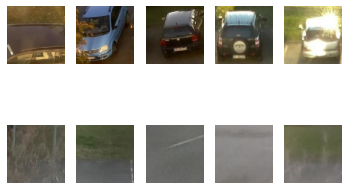

14.08916974067688


In [0]:
# Load the data and display the sample from compression
from numpy import load
from matplotlib import pyplot
import time
# load the dataset
start = time.time()
root_d = '/content/gdrive/FYP/train_small.npz' # follow the path of before step
data = load(root_d)

# data['arr_0'] is small_train_busy, data['arr_1'] is small_train_free;
# data['arr_3'] is small_test_busy, data['arr_4'] is small_test_free;
# data['arr_5'] is small_validation_busy, data['arr_6'] is validation_small_free;
dataBusy, dataFree = data['arr_0'], data['arr_1']
print('Loaded: ', dataBusy.shape, dataFree.shape)
# plot source images
n_samples = 5
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + i)
	pyplot.axis('off')
	pyplot.imshow(dataBusy[i].astype('uint8'))
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(dataFree[i].astype('uint8'))
pyplot.show()
print(str(time.time() - start) + ' seconds')

## Extend data

### CycleGAN

##### Create Cycle dataset

###### Create greate sunshine dataset

In [0]:
# Include busy and free
import os
import shutil
import time
import cv2

great_sunshine = 120
save_path = '/content/gdrive/a/FYP_2020/a_great_sunshine/'

'''
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
'''
def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

def create_save_path(save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    if not os.path.exists(save_dir + 'train/busy'):
        os.makedirs(save_dir + 'train/busy')
    if not os.path.exists(save_dir + 'test/busy'):
        os.makedirs(save_dir + 'test/busy')
    if not os.path.exists(save_dir + 'val/busy'):
        os.makedirs(save_dir + 'val/busy')
     if not os.path.exists(save_dir + 'train/free'):
        os.makedirs(save_dir + 'train/free')
    if not os.path.exists(save_dir + 'test/free'):
        os.makedirs(save_dir + 'test/free')
    if not os.path.exists(save_dir + 'val/free'):
        os.makedirs(save_dir + 'val/free') 

def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    f_n = orgin_dir + 'LABELS/'
    fn = f_n + 'train.txt'
    '''
    train_path_b = os.listdir(train_dir + '/busy/')
    train_path_f = os.listdir(train_dir + '/free/')

    test_path_b = os.listdir(test_dir + '/busy/')
    test_path_f = os.listdir(test_dir + '/free/')

    val_path_b = os.listdir(validation_dir + '/busy/') 
    val_path_f = os.listdir(validation_dir + '/free/') 
    '''
    
    count = 0
    for status in os.listdir(train_dir):
        source_dir = train_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                sname = save_dir + 'train/' + status + '/' + image
                shutil.copy(img_path, sname)
    
    for status in os.listdir(test_dir):
        source_dir = test_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                sname = save_dir + 'test/' + status + '/' + image
                shutil.copy(img_path, sname)

    for status in os.listdir(validation_dir):
        source_dir = validation_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                sname = save_dir + 'val/' + status + '/' + image
                shutil.copy(img_path, sname)
    #batch_images = np.random.choice(path, size = batch_size)

#save_dir = '/content/gdrive/FYP/dataset_fullparking/'
# main part
if __name__ == '__main__':
    create_parking_dataset(save_path)

In [0]:
# No include busy and free
import os
import shutil
import time
from zipfile import ZipFile 
import requests
import cv2

great_sunshine = 120
save_path = '/content/gdrive/a/FYP_2020/a_great_sunshine/'

'''
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
'''

def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

def create_save_path(save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    if not os.path.exists(save_dir + 'all'):
        os.makedirs(save_dir + 'all')
    if not os.path.exists(save_dir + '120-150'):
        os.makedirs(save_dir + '120-150')
    if not os.path.exists(save_dir + '150+'):
        os.makedirs(save_dir + '150+')

def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    '''
    train_path_b = os.listdir(train_dir + '/busy/')
    train_path_f = os.listdir(train_dir + '/free/')

    test_path_b = os.listdir(test_dir + '/busy/')
    test_path_f = os.listdir(test_dir + '/free/')

    val_path_b = os.listdir(validation_dir + '/busy/') 
    val_path_f = os.listdir(validation_dir + '/free/') 
    '''
    
    count = 0
    for status in os.listdir(train_dir):
        source_dir = train_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                if n_bright < 150:
                    sname = save_dir + '120-150/' + image
                else:
                    sname = save_dir + '150+/' + image
                shutil.copy(img_path, sname)
                sname = save_dir + 'all/' + image
                shutil.copy(img_path, sname)
    
    for status in os.listdir(test_dir):
        source_dir = test_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                if n_bright < 150:
                    sname = save_dir + '120-150/' + image
                else:
                    sname = save_dir + '150+/' + image
                shutil.copy(img_path, sname)
                sname = save_dir + 'all/' + image
                shutil.copy(img_path, sname)

    for status in os.listdir(validation_dir):
        source_dir = validation_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))

            print(' bright: ', n_bright)
            if n_bright > great_sunshine:
                if n_bright < 150:
                    sname = save_dir + '120-150/' + image
                else:
                    sname = save_dir + '150+/' + image
                shutil.copy(img_path, sname)
                sname = save_dir + 'all/' + image
                shutil.copy(img_path, sname)
    #batch_images = np.random.choice(path, size = batch_size)

#save_dir = '/content/gdrive/FYP/dataset_fullparking/'
# main part
if __name__ == '__main__':
    create_parking_dataset(save_path)

 1   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.17_C01_266.jpg bright:  101.5248
 2   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.17_C01_267.jpg bright:  115.90702222222222
 3   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.17_C03_300.jpg bright:  107.7368888888889
 4   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.20_C05_303.jpg bright:  183.79391111111113
 5   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.20_C05_308.jpg bright:  118.89431111111112
 6   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.20_C06_304.jpg bright:  115.52124444444445
 7   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy/S_2016-01-12_16.21_C07_278.jpg bright:  98.00955555555556
 8   /content/gdrive/parking_dataset/CNR-EXT-Patches-

###### Create sunshine and nornal cycle gan dataset

In [0]:
# Save all train, test, val dataset
import os
import shutil
import time
from zipfile import ZipFile 
import requests
import cv2

great_sunshine = 150
save_path = '/content/gdrive/FYP/a_sunshine_cyc_data/'
'''
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
'''
def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

def create_save_path(save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    if not os.path.exists(save_dir + 'trainA'):
        os.makedirs(save_dir + 'trainA')
    if not os.path.exists(save_dir + 'testA'):
        os.makedirs(save_dir + 'testA')
    if not os.path.exists(save_dir + 'valA'):
        os.makedirs(save_dir + 'valA')
    if not os.path.exists(save_dir + 'trainB'):
        os.makedirs(save_dir + 'trainB')
    if not os.path.exists(save_dir + 'testB'):
        os.makedirs(save_dir + 'testB')
    if not os.path.exists(save_dir + 'valB'):
        os.makedirs(save_dir + 'valB')  

def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    
    count = 0
    for status in os.listdir(train_dir):
        source_dir = train_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'trainA/' + image
            elif n_bright > great_sunshine:
                sname = save_dir + 'trainB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)

    for status in os.listdir(test_dir):
        source_dir = test_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'testA/' + image
            elif n_bright > great_sunshine:
                sname = save_dir + 'testB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)
    

    for status in os.listdir(validation_dir):
        source_dir = validation_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'valA/' + image
            elif n_bright > great_sunshine:
                sname = save_dir + 'valB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)
    
# main part
if __name__ == '__main__':
    create_parking_dataset(save_path)

Streaming output truncated to the last 5000 lines.
 2494   /content/gdrive/FYP/a_sunshine_cyc_data/trainA/O_2015-11-29_15.14_C02_186.jpg bright:  79.7484
 2495   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-11-29_15.17_C09_331.jpg bright:  95.1828888888889
 2496   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-11-29_15.44_C02_184.jpg bright:  108.72915555555556
 2497   /content/gdrive/FYP/a_sunshine_cyc_data/trainA/O_2015-11-29_16.44_C02_186.jpg bright:  77.89182222222223
 2498   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-12-19_08.52_C06_610.jpg bright:  117.39053333333334
 2499   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-12-19_08.54_C07_319.jpg bright:  135.92933333333335
 2500   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-12-19_09.21_C04_302.jpg bright:  92.58031111111111
 2501   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-12-19_09.52_C06_610.jpg bright:  111.7776
 2502   /content/gdrive/FYP/a_sunshine_cyc_data/trainB/O_2015-

###### Create dark and nornal cycle gan dataset

In [0]:
# Save all train, test, val dataset
import os
import shutil
import time
from zipfile import ZipFile 
import requests
import cv2

great_sunshine = 50
save_path = '/content/gdrive/FYP/a_dark_cyc_data/'
'''
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
'''
def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

def create_save_path(save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    if not os.path.exists(save_dir + 'trainA'):
        os.makedirs(save_dir + 'trainA')
    if not os.path.exists(save_dir + 'testA'):
        os.makedirs(save_dir + 'testA')
    if not os.path.exists(save_dir + 'valA'):
        os.makedirs(save_dir + 'valA')
    if not os.path.exists(save_dir + 'trainB'):
        os.makedirs(save_dir + 'trainB')
    if not os.path.exists(save_dir + 'testB'):
        os.makedirs(save_dir + 'testB')
    if not os.path.exists(save_dir + 'valB'):
        os.makedirs(save_dir + 'valB')  

def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    
    count = 0
    for status in os.listdir(train_dir):
        source_dir = train_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'trainA/' + image
            elif n_bright < great_sunshine:
                sname = save_dir + 'trainB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)

    for status in os.listdir(test_dir):
        source_dir = test_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'testA/' + image
            elif n_bright < great_sunshine:
                sname = save_dir + 'testB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)
    

    for status in os.listdir(validation_dir):
        source_dir = validation_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            if n_bright > 90 and n_bright < 110:
                sname = save_dir + 'valA/' + image
            elif n_bright < great_sunshine:
                sname = save_dir + 'valB/' + image
            else:
                sname = 'none'
            if sname == 'none':
                continue
            shutil.copy(img_path, sname)
            print('\r',str(count),' ',sname,end='')
            print(' bright: ', n_bright)
    
# main part
if __name__ == '__main__':
    create_parking_dataset(save_path)

 1   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.43_C08_613.jpg bright:  86.70853333333334
 2   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.46_C03_193.jpg bright:  70.59466666666667
 4   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.47_C04_226.jpg bright:  89.1192
 7   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.47_C04_608.jpg bright:  96.62733333333334
 11   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.48_C06_201.jpg bright:  78.57942222222222
 13   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_15.49_C07_242.jpg bright:  80.15911111111112
 14   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_16.14_C08_291.jpg bright:  65.17773333333334
 20   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_16.18_C06_242.jpg bright:  78.34404444444445
 21   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27_16.18_C06_275.jpg bright:  87.9316
 22   /content/gdrive/FYP/a_dark_cyc_data/trainA/S_2015-11-27

KeyboardInterrupt: ignored

##### CycleGAN training

###### sunshine and normal dataset


Epoch: 95 / 100
Epoch: 95 Batch: 0>Saved: /content/gdrive/FYP/Bright_CycGan_Output/a_sunshine_cyc_data/test0/gen_model/g_model_AB_95_0.h5 and /content/gdrive/FYP/Bright_CycGan_Output/a_sunshine_cyc_data/test0/gen_model/g_model_BA_95_0.h5


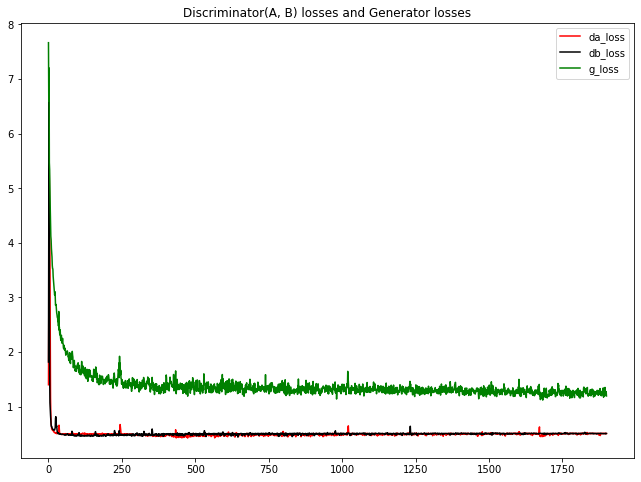

<Figure size 432x288 with 0 Axes>


time: 134 mins 38 s g_loss: [5.958765029907227, 1.0146592855453491, 0.9796521663665771, 0.0967354103922844, 0.12180467694997787, 0.0872679203748703, 0.11040458083152771] 


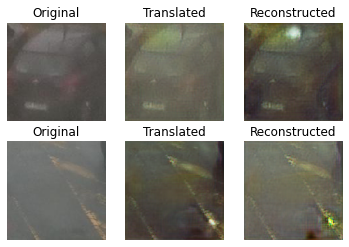

Epoch: 95 Batch: 19
Epoch: 96 / 100
Epoch: 96 Batch: 0
time: 136 mins 4 s g_loss: [6.345335006713867, 1.0050225257873535, 1.229644775390625, 0.09880902618169785, 0.12966789305210114, 0.09183105826377869, 0.11104657500982285] 


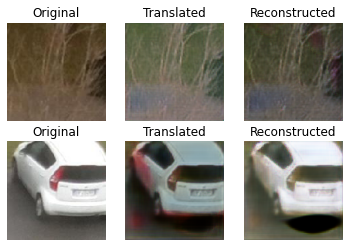

Epoch: 96 Batch: 19
Epoch: 97 / 100
Epoch: 97 Batch: 0
time: 137 mins 29 s g_loss: [6.341503143310547, 1.0565450191497803, 1.0709799528121948, 0.09700824320316315, 0.13380542397499084, 0.0858660563826561, 0.12589409947395325] 


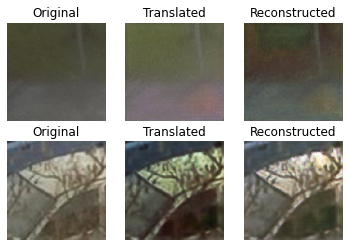

Epoch: 97 Batch: 19
Epoch: 98 / 100
Epoch: 98 Batch: 0
time: 138 mins 53 s g_loss: [6.338445663452148, 1.0334303379058838, 1.037002682685852, 0.10308768600225449, 0.1286420375108719, 0.09508895128965378, 0.12165717780590057] 


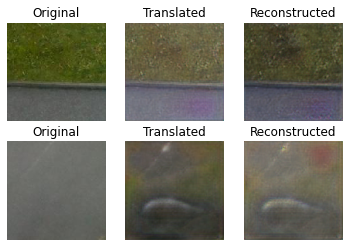

Epoch: 98 Batch: 19
Epoch: 99 / 100
Epoch: 99 Batch: 0
time: 140 mins 18 s g_loss: [6.471534729003906, 1.0436550378799438, 1.1460814476013184, 0.1018175408244133, 0.13376393914222717, 0.09390179067850113, 0.12009638547897339] 


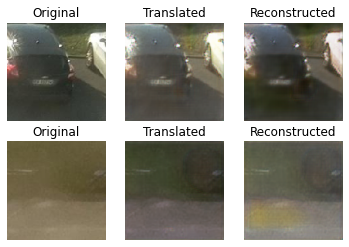

Epoch: 99 Batch: 19

In [0]:
import numpy as np
import scipy
import sys
import os
import cv2
import time

import matplotlib.pyplot as plt
import tensorflow_addons as tfa

exec('from __future__ import print_function, division')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Model
from keras.optimizers import Adam

from glob import glob
from IPython.display import clear_output
from tensorflow.keras.preprocessing.image import img_to_array

# Source path
root_d = '/content/gdrive/FYP/a_sunshine_cyc_data/'
#root_d = '/content/gdrive/FYP/5000data/'

# Output path
save_dir = '/content/gdrive/FYP/Bright_CycGan_Output/a_sunshine_cyc_data/test'

# Image Size
wide = 128
height = 128
channel = 3
img_shape = (wide, height, channel)

# Number of filters in the first layer of G and D
gf = 32 #int(wide / 4)
df = 64 #int(wide / 2)

re_size = (wide, height)
patch = int(128 / 2**4 * (wide / 128.0))

def conv2d(layer_input, filters, f_size=4, normalization=True):
    """Discriminator layer"""
    d = layers.Conv2D(filters, kernel_size=f_size,
                strides=2, padding='same')(layer_input)
    d = layers.LeakyReLU(alpha=0.2)(d)

    if normalization:
        d = tfa.layers.InstanceNormalization()(d)
    return d

def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
    """Layers used during upsampling"""
    u = layers.UpSampling2D(size=2)(layer_input)
    u = layers.Conv2D(filters, kernel_size=f_size, strides=1,
                padding='same', activation='relu')(u)
    if dropout_rate:
        u = layers.Dropout(dropout_rate)(u)
    u = tfa.layers.InstanceNormalization()(u)
    u = layers.Concatenate()([u, skip_input])
    return u

def build_discriminator(lay):
    if lay == '3':
        img = layers.Input(shape=img_shape)
        d1 = conv2d(img, df, normalization=False)
        d2 = conv2d(d1, df * 2)
        d3 = conv2d(d2, df * 4)

        validity = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(d3)
    else:
        img = layers.Input(shape=img_shape)
        d1 = conv2d(img, df, normalization=False)
        d2 = conv2d(d1, df * 2)
        d3 = conv2d(d2, df * 4)
        d4 = conv2d(d3, df * 8)

        validity = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)
    return keras.models.Model(img, validity)

def build_generator(lay):
    """U-Net Generator"""
    # Image input
    d0 = keras.Input(shape=img_shape)
    if lay == '3':   
        # Downsampling)
        d1 = conv2d(d0, gf)
        d2 = conv2d(d1, gf * 2)
        d3 = conv2d(d2, gf * 4)
    
        # Upsampling
        u1 = deconv2d(d3, d2, gf * 2)
        u2 = deconv2d(u1, d1, gf)
    
        u4 = layers.UpSampling2D(size=2)(u2)
        output_img = layers.Conv2D(3, kernel_size=4,
                                  strides=1, padding='same', activation='tanh')(u4)
    
    else:
        # Downsampling
        d1 = conv2d(d0, gf)
        d2 = conv2d(d1, gf * 2)
        d3 = conv2d(d2, gf * 4)
        d4 = conv2d(d3, gf * 8)
        # Upsampling
        u1 = deconv2d(d4, d3, gf * 4)
        u2 = deconv2d(u1, d2, gf * 2)
        u3 = deconv2d(u2, d1, gf)
    
        u4 = layers.UpSampling2D(size=2)(u3)
        output_img = layers.Conv2D(3, kernel_size=4,
                                  strides=1, padding='same', activation='tanh')(u4)
    return keras.models.Model(d0, output_img)


# save the generator models to file
def save_models(epoch, batch_i, g_model_AtoB, g_model_BtoA):
    # save the first generator model
    model_path = save_dir + 'gen_model/'
    filename1 = model_path + 'g_model_AB_%d_%d.h5' % (epoch, batch_i)
    g_model_AtoB.save(filename1)
    # save the second generator model
    filename2 = model_path + 'g_model_BA_%d_%d.h5' % (epoch, batch_i)
    g_model_BtoA.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

def average(lst): 
    return sum(lst) / len(lst) 
    
# plot the losses during training
def plot_losses(losses):
    da_loss = []
    db_loss = []
    gc = []
    for i in range(len(losses)):
        da_loss.append(losses[i][0].mean())
        db_loss.append(losses[i][1].mean())
        gc.append(average(losses[i][3]))

    epochs = range(len(da_loss))
    plt.plot(epochs, da_loss, 'r', label='da_loss')
    plt.plot(epochs, db_loss, 'k', label='db_loss')
    plt.plot(epochs, gc, 'g', label='g_loss')
    plt.title('Discriminator(A, B) losses and Generator losses')
    plt.legend()
    fig = plt.gcf()
    fig.set_size_inches(11,8)
    plt.figure()
    plt.show()

def load_batch(batch_size=1, is_testing = False, b_size = re_size):
    data_type = "train" if not is_testing else "val"
    path_A = glob(root_d + '%sA/*' % data_type)
    path_B = glob(root_d + '%sB/*' % data_type)
    
    n_batches = int(min(len(path_A), len(path_B)) / batch_size)
    total_samples = n_batches * batch_size

    path_A = np.random.choice(path_A, total_samples, replace=False)
    path_B = np.random.choice(path_B, total_samples, replace=False)

    for i in range(n_batches-1):
        batch_A = path_A[i*batch_size:(i+1)*batch_size]
        batch_B = path_B[i*batch_size:(i+1)*batch_size]
        imgs_A, imgs_B = [], []
        for img_A, img_B in zip(batch_A, batch_B):
            img_A = load_img(img_A, target_size = b_size)
            img_B = load_img(img_B, target_size = b_size)
            img_A = img_to_array(img_A)
            img_B = img_to_array(img_B)
            if not is_testing and np.random.random() > 0.5:
                img_A = np.fliplr(img_A)
                img_B = np.fliplr(img_B)

            imgs_A.append(img_A)
            imgs_B.append(img_B)

        imgs_A = np.array(imgs_A)/127.5 - 1.
        imgs_B = np.array(imgs_B)/127.5 - 1.

        yield imgs_A, imgs_B

def load_data(domain, batch_size=1, is_testing=False, b_size = re_size):
    data_type = "train%s" % domain if not is_testing else "test%s" % domain
    path = glob(root_d + '%s/*' % data_type)

    batch_images = np.random.choice(path, size = batch_size)

    imgs = []
    for img_path in batch_images:
        img = load_img(img_path, target_size = b_size)
        img = img_to_array(img)
        if not is_testing and np.random.random() > 0.5:
            img = np.fliplr(img)
        imgs.append(img)
        
    imgs = np.array(imgs)/127.5 - 1.
    return imgs

def sample_images(epoch, batch_i, g_AB, g_BA):
    r, c = 2, 3

    imgs_A = load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(save_dir + "%d_%d.png" % (epoch, batch_i))
    plt.show()
    #plt.close(fig)
    return g_AB, g_BA


def save_image(epoch, batch_i, g_AB, g_BA):
    imgs_A = load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    r, c = 2, 3
    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(save_dir + "%d_%d.png" % (epoch, batch_i))
    plt.show()
    #plt.close(fig)
    
    cnt = 0
    for i in [1, 2, 4, 5]:
        fig, axs = plt.subplots()
        img = gen_imgs[i]
        axs.imshow(img)
        save_path = save_dir + "generate_img/generate_img_%d_%d_%d.png" % (epoch, batch_i, cnt)
        cnt += 1
        fig.savefig(save_path)
        plt.close(fig)
        
    return g_AB, g_BA

def gan_init(lay):
    g_AB = build_generator(lay)
    g_BA = build_generator(lay)
    d_A = build_discriminator(lay)
    d_B = build_discriminator(lay)
    optimizer1 =  keras.optimizers.Adam(0.0002, 0.5)
    d_A.compile(loss='mse',
                optimizer=optimizer1,
                metrics=['accuracy'])
    d_B.compile(loss='mse',
                optimizer=optimizer1,
                metrics=['accuracy'])
    img_A = layers.Input(shape=img_shape)
    img_B = layers.Input(shape=img_shape)

    fake_B = g_AB(img_A)
    fake_A = g_BA(img_B)
    # Translate images back to original domain
    reconstr_A = g_BA(fake_B)
    reconstr_B = g_AB(fake_A)
    # Identity mapping of images
    img_A_id = g_BA(img_A)
    img_B_id = g_AB(img_B)

    d_A.trainable = False
    d_B.trainable = False

    valid_A = d_A(fake_A)
    valid_B = d_B(fake_B)

    lambda_cycle = 10.0
    lambda_id = 0.9 * lambda_cycle  
    combined = keras.models.Model(inputs=[img_A, img_B],
                                  outputs=[valid_A, valid_B,
                                          reconstr_A, reconstr_B,
                                          img_A_id, img_B_id])
    
    com_optimizer = keras.optimizers.Adam(0.0002, 0.5)
    combined.compile(loss=['mse', 'mse',
                                'mae', 'mae',
                                'mae', 'mae'],
                    loss_weights=[1, 1,
                                  lambda_cycle, lambda_cycle,
                                  lambda_id, lambda_id],
                    optimizer = com_optimizer)
    return combined, g_AB, g_BA, d_A, d_B

def train(epochs, batch_size=1, sample_interval=50, lay = '4'):
    # Adversarial loss ground truths
    if lay == '3':
        disc_patch = (patch*2, patch*2, 1)
        batch_size = 8
    else:
        disc_patch = (patch, patch, 1)

    if not os.path.exists(save_dir):
        os.makedirs(save_dir + 'generate_img/')

    valid = np.ones((batch_size,) + disc_patch)
    fake = np.zeros((batch_size,) + disc_patch)
    combined = ''
    losses = []
    combined, g_AB, g_BA, d_A, d_B = gan_init(lay)

    print('\nGenerator detail:\n')
    g_AB.summary()
    print('\n\n---------------------------------\n\n')
    print('\nDiscriminator detail:\n')
    d_A.summary()

    print('\n-----------Start!----------')
    st_time = time.time()
    for epoch in range(epochs):
        if epoch % 5 == 0 and epoch != 0:
            clear_output(wait=True)
        print('\nEpoch: %d / %d' % (epoch, epochs))
        for batch_i, (imgs_A, imgs_B) in enumerate(load_batch(batch_size)):
            # ----------------------
            #  Train Discriminators
            # ----------------------
            print('\rEpoch: %d Batch: %d' % (epoch, batch_i), end = '')
            # Translate images to opposite domain
            fake_B = g_AB.predict(imgs_A)
            fake_A = g_BA.predict(imgs_B)
            
            # Train the discriminators (original images = real / translated = Fake)
            dA_loss_real = d_A.train_on_batch(imgs_A, valid)
            dA_loss_fake = d_A.train_on_batch(fake_A, fake)
            dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
            dB_loss_real = d_B.train_on_batch(imgs_B, valid)
            dB_loss_fake = d_B.train_on_batch(fake_B, fake)
            dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

            # Total discriminator loss
            d_loss = 0.5 * np.add(dA_loss, dB_loss)

            # ------------------
            #  Train Generators
            # ------------------
            
            # Train the generators
            g_loss = combined.train_on_batch([imgs_A, imgs_B],
                                              [valid, valid,
                                              imgs_A, imgs_B,
                                              imgs_A, imgs_B])
            seconds = time.time() - st_time
            losses.append((dA_loss, dB_loss, d_loss, g_loss))
            if epoch != 0 and epoch % 5 == 0 and batch_i == 0:
                save_models(epoch, batch_i, g_AB, g_BA)
                plot_losses(losses)
            # If at save interval => plot the generated image samples
            if batch_i % sample_interval == 0:
                print('\ntime: %d mins %d s g_loss: %s ' % (int(seconds/60.0), int(seconds)%60, str(g_loss)))
                if epoch < 5: #30
                    g_AB, g_BA = sample_images(epoch, batch_i, g_AB, g_BA)
                else:
                    g_AB, g_BA = save_image(epoch, batch_i, g_AB, g_BA)


                
def create_output_path():
    global save_dir
    check = True
    num = 0
    while check:
        save_d = save_dir + str(num) + '/'
        if os.path.exists(save_d) == True:
            num += 1
        else:
            save_dir = save_d
            check = False
            os.makedirs(save_dir + 'generate_img/')
            os.makedirs(save_dir + 'gen_model/')
    print('Save location is: %s\n'%save_dir)

def main(argv):
    try:
        if len(argv) != 1:
            print('Unable Input!')
            sys.exit(0)

        create_output_path()
        train(epochs=100, batch_size=64, sample_interval=30, lay=argv)
    except:
        print('Please input INPUT, the formular is:\npython final_ver_cyclegan.py 3')
        sys.exit(1)
        
if __name__ == "__main__":
    main('4')

###### Darker and dataset


Epoch: 75 / 100
Epoch: 75 Batch: 0>Saved: /content/gdrive/FYP/Bright_CycGan_Output/a_dark_cyc_data/test6/gen_model/g_model_AB_75_0.h5 and /content/gdrive/FYP/Bright_CycGan_Output/a_dark_cyc_data/test6/gen_model/g_model_BA_75_0.h5


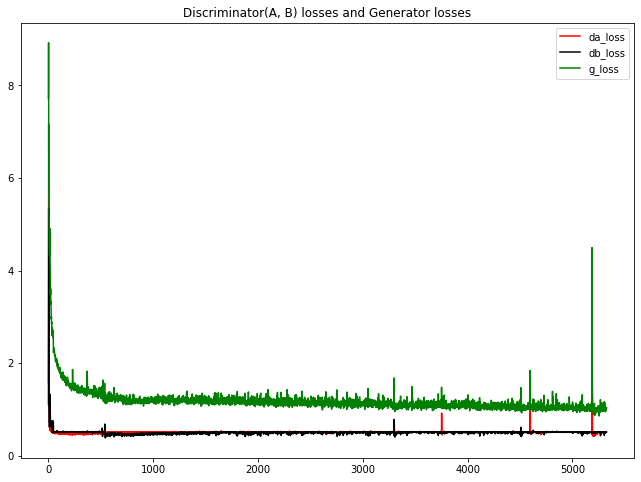

<Figure size 432x288 with 0 Axes>


time: 244 mins 59 s g_loss: [4.827338218688965, 0.9306563138961792, 1.1967850923538208, 0.09611742198467255, 0.053727928549051285, 0.08445990085601807, 0.049033746123313904] 


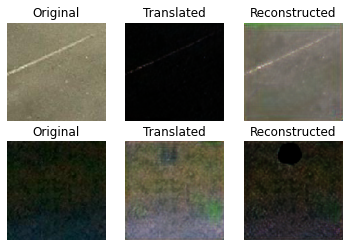

Epoch: 75 Batch: 30
time: 246 mins 10 s g_loss: [4.803677558898926, 1.0026435852050781, 1.166149616241455, 0.10792938619852066, 0.04669375345110893, 0.08452107757329941, 0.03644038736820221] 


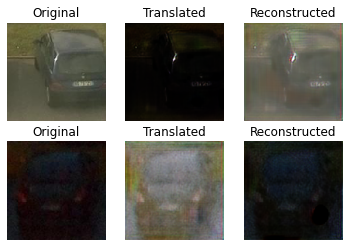

Epoch: 75 Batch: 60
time: 247 mins 21 s g_loss: [4.745719909667969, 1.0351003408432007, 1.0713152885437012, 0.09925267845392227, 0.050212759524583817, 0.08108161389827728, 0.046101730316877365] 


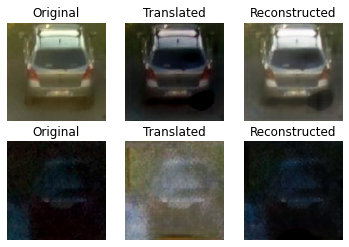

Epoch: 75 Batch: 70
Epoch: 76 / 100
Epoch: 76 Batch: 0
time: 247 mins 48 s g_loss: [4.975879669189453, 0.9860397577285767, 1.2815074920654297, 0.10043682157993317, 0.0518159493803978, 0.0864102691411972, 0.04534585401415825] 


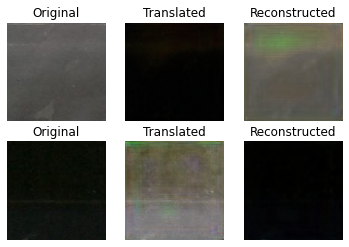

Epoch: 76 Batch: 30
time: 248 mins 59 s g_loss: [4.660003662109375, 0.9931737184524536, 0.9943045973777771, 0.0988822653889656, 0.05573897063732147, 0.08250004053115845, 0.04264584183692932] 


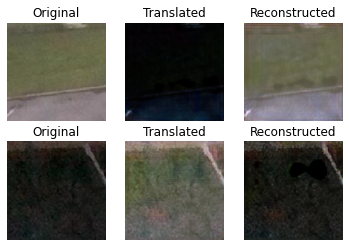

Epoch: 76 Batch: 60
time: 250 mins 9 s g_loss: [4.621832847595215, 1.0335482358932495, 1.0856211185455322, 0.08888677507638931, 0.06054287776350975, 0.06715252995491028, 0.04488828405737877] 


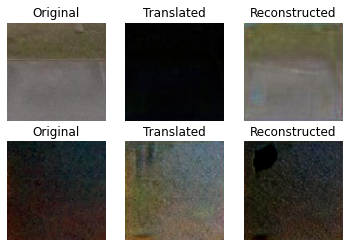

Epoch: 76 Batch: 70
Epoch: 77 / 100
Epoch: 77 Batch: 0
time: 250 mins 36 s g_loss: [4.660398960113525, 0.987250566482544, 1.1026592254638672, 0.09173373132944107, 0.05330897495150566, 0.07948869466781616, 0.04496264457702637] 


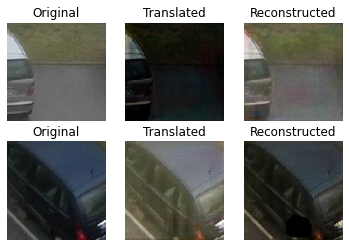

Epoch: 77 Batch: 30
time: 251 mins 46 s g_loss: [4.864367485046387, 1.0354689359664917, 1.4231019020080566, 0.09016995877027512, 0.04445470869541168, 0.0800573006272316, 0.03767044469714165] 


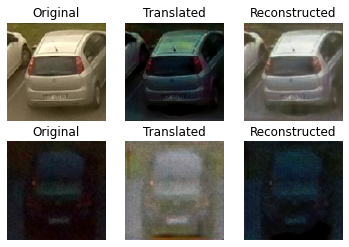

Epoch: 77 Batch: 60
time: 252 mins 56 s g_loss: [4.658796310424805, 1.0023596286773682, 1.0570383071899414, 0.09866048395633698, 0.04867274686694145, 0.0839996263384819, 0.041118841618299484] 


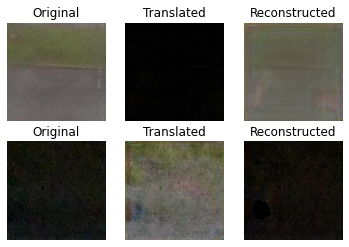

Epoch: 77 Batch: 70
Epoch: 78 / 100
Epoch: 78 Batch: 0
time: 253 mins 23 s g_loss: [4.690455436706543, 0.9943563938140869, 0.9575055241584778, 0.10107709467411041, 0.053770843893289566, 0.08873889595270157, 0.043496035039424896] 


In [0]:
import numpy as np
import scipy
import sys
import os
import cv2
import time

import matplotlib.pyplot as plt
import tensorflow_addons as tfa

exec('from __future__ import print_function, division')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Model
from keras.optimizers import Adam

from glob import glob
from IPython.display import clear_output
from tensorflow.keras.preprocessing.image import img_to_array

# Source path
root_d = '/content/gdrive/FYP/a_darker_cyc_data/'
#root_d = '/content/gdrive/FYP/5000data/'

# Output path
save_dir = '/content/gdrive/FYP/Bright_CycGan_Output/a_dark_cyc_data/test'

# Image Size
wide = 128
height = 128
channel = 3
img_shape = (wide, height, channel)

# Number of filters in the first layer of G and D
gf = 32 #int(wide / 4)
df = 64 #int(wide / 2)

re_size = (wide, height)
patch = int(128 / 2**4 * (wide / 128.0))

def conv2d(layer_input, filters, f_size=4, normalization=True):
    """Discriminator layer"""
    d = layers.Conv2D(filters, kernel_size=f_size,
                strides=2, padding='same')(layer_input)
    d = layers.LeakyReLU(alpha=0.2)(d)

    if normalization:
        d = tfa.layers.InstanceNormalization()(d)
    return d

def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
    """Layers used during upsampling"""
    u = layers.UpSampling2D(size=2)(layer_input)
    u = layers.Conv2D(filters, kernel_size=f_size, strides=1,
                padding='same', activation='relu')(u)
    if dropout_rate:
        u = layers.Dropout(dropout_rate)(u)
    u = tfa.layers.InstanceNormalization()(u)
    u = layers.Concatenate()([u, skip_input])
    return u

def build_discriminator(lay):
    if lay == '3':
        img = layers.Input(shape=img_shape)
        d1 = conv2d(img, df, normalization=False)
        d2 = conv2d(d1, df * 2)
        d3 = conv2d(d2, df * 4)

        validity = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(d3)
    else:
        img = layers.Input(shape=img_shape)
        d1 = conv2d(img, df, normalization=False)
        d2 = conv2d(d1, df * 2)
        d3 = conv2d(d2, df * 4)
        d4 = conv2d(d3, df * 8)

        validity = layers.Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)
    return keras.models.Model(img, validity)

def build_generator(lay):
    """U-Net Generator"""
    # Image input
    d0 = keras.Input(shape=img_shape)
    if lay == '3':   
        # Downsampling)
        d1 = conv2d(d0, gf)
        d2 = conv2d(d1, gf * 2)
        d3 = conv2d(d2, gf * 4)
    
        # Upsampling
        u1 = deconv2d(d3, d2, gf * 2)
        u2 = deconv2d(u1, d1, gf)
    
        u4 = layers.UpSampling2D(size=2)(u2)
        output_img = layers.Conv2D(3, kernel_size=4,
                                  strides=1, padding='same', activation='tanh')(u4)
    
    else:
        # Downsampling
        d1 = conv2d(d0, gf)
        d2 = conv2d(d1, gf * 2)
        d3 = conv2d(d2, gf * 4)
        d4 = conv2d(d3, gf * 8)
        # Upsampling
        u1 = deconv2d(d4, d3, gf * 4)
        u2 = deconv2d(u1, d2, gf * 2)
        u3 = deconv2d(u2, d1, gf)
    
        u4 = layers.UpSampling2D(size=2)(u3)
        output_img = layers.Conv2D(3, kernel_size=4,
                                  strides=1, padding='same', activation='tanh')(u4)
    return keras.models.Model(d0, output_img)


# save the generator models to file
def save_models(epoch, batch_i, g_model_AtoB, g_model_BtoA):
    # save the first generator model
    model_path = save_dir + 'gen_model/'
    filename1 = model_path + 'g_model_AB_%d_%d.h5' % (epoch, batch_i)
    g_model_AtoB.save(filename1)
    # save the second generator model
    filename2 = model_path + 'g_model_BA_%d_%d.h5' % (epoch, batch_i)
    g_model_BtoA.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

def average(lst): 
    return sum(lst) / len(lst) 
    
# plot the losses during training
def plot_losses(losses):
    da_loss = []
    db_loss = []
    gc = []
    for i in range(len(losses)):
        da_loss.append(losses[i][0].mean())
        db_loss.append(losses[i][1].mean())
        gc.append(average(losses[i][3]))

    epochs = range(len(da_loss))
    plt.plot(epochs, da_loss, 'r', label='da_loss')
    plt.plot(epochs, db_loss, 'k', label='db_loss')
    plt.plot(epochs, gc, 'g', label='g_loss')
    plt.title('Discriminator(A, B) losses and Generator losses')
    plt.legend()
    fig = plt.gcf()
    fig.set_size_inches(11,8)
    plt.figure()
    plt.show()

def load_batch(batch_size=1, is_testing = False, b_size = re_size):
    data_type = "train" if not is_testing else "val"
    path_A = glob(root_d + '%sA/*' % data_type)
    path_B = glob(root_d + '%sB/*' % data_type)
    
    n_batches = int(min(len(path_A), len(path_B)) / batch_size)
    total_samples = n_batches * batch_size

    path_A = np.random.choice(path_A, total_samples, replace=False)
    path_B = np.random.choice(path_B, total_samples, replace=False)

    for i in range(n_batches-1):
        batch_A = path_A[i*batch_size:(i+1)*batch_size]
        batch_B = path_B[i*batch_size:(i+1)*batch_size]
        imgs_A, imgs_B = [], []
        for img_A, img_B in zip(batch_A, batch_B):
            img_A = load_img(img_A, target_size = b_size)
            img_B = load_img(img_B, target_size = b_size)
            img_A = img_to_array(img_A)
            img_B = img_to_array(img_B)
            if not is_testing and np.random.random() > 0.5:
                img_A = np.fliplr(img_A)
                img_B = np.fliplr(img_B)

            imgs_A.append(img_A)
            imgs_B.append(img_B)

        imgs_A = np.array(imgs_A)/127.5 - 1.
        imgs_B = np.array(imgs_B)/127.5 - 1.

        yield imgs_A, imgs_B

def load_data(domain, batch_size=1, is_testing=False, b_size = re_size):
    data_type = "train%s" % domain if not is_testing else "test%s" % domain
    path = glob(root_d + '%s/*' % data_type)

    batch_images = np.random.choice(path, size = batch_size)

    imgs = []
    for img_path in batch_images:
        img = load_img(img_path, target_size = b_size)
        img = img_to_array(img)
        if not is_testing and np.random.random() > 0.5:
            img = np.fliplr(img)
        imgs.append(img)
        
    imgs = np.array(imgs)/127.5 - 1.
    return imgs

def sample_images(epoch, batch_i, g_AB, g_BA):
    r, c = 2, 3

    imgs_A = load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(save_dir + "%d_%d.png" % (epoch, batch_i))
    plt.show()
    #plt.close(fig)
    return g_AB, g_BA


def save_image(epoch, batch_i, g_AB, g_BA):
    imgs_A = load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    r, c = 2, 3
    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(save_dir + "%d_%d.png" % (epoch, batch_i))
    plt.show()
    #plt.close(fig)
    
    cnt = 0
    for i in [1, 2, 4, 5]:
        fig, axs = plt.subplots()
        img = gen_imgs[i]
        axs.imshow(img)
        save_path = save_dir + "generate_img/generate_img_%d_%d_%d.png" % (epoch, batch_i, cnt)
        cnt += 1
        fig.savefig(save_path)
        plt.close(fig)
        
    return g_AB, g_BA

def gan_init(lay):
    g_AB = build_generator(lay)
    g_BA = build_generator(lay)
    d_A = build_discriminator(lay)
    d_B = build_discriminator(lay)
    optimizer1 =  keras.optimizers.Adam(0.0002, 0.5)
    d_A.compile(loss='mse',
                optimizer=optimizer1,
                metrics=['accuracy'])
    d_B.compile(loss='mse',
                optimizer=optimizer1,
                metrics=['accuracy'])
    img_A = layers.Input(shape=img_shape)
    img_B = layers.Input(shape=img_shape)

    fake_B = g_AB(img_A)
    fake_A = g_BA(img_B)
    # Translate images back to original domain
    reconstr_A = g_BA(fake_B)
    reconstr_B = g_AB(fake_A)
    # Identity mapping of images
    img_A_id = g_BA(img_A)
    img_B_id = g_AB(img_B)

    d_A.trainable = False
    d_B.trainable = False

    valid_A = d_A(fake_A)
    valid_B = d_B(fake_B)

    lambda_cycle = 10.0
    lambda_id = 0.9 * lambda_cycle  
    combined = keras.models.Model(inputs=[img_A, img_B],
                                  outputs=[valid_A, valid_B,
                                          reconstr_A, reconstr_B,
                                          img_A_id, img_B_id])
    
    com_optimizer = keras.optimizers.Adam(0.0002, 0.5)
    combined.compile(loss=['mse', 'mse',
                                'mae', 'mae',
                                'mae', 'mae'],
                    loss_weights=[1, 1,
                                  lambda_cycle, lambda_cycle,
                                  lambda_id, lambda_id],
                    optimizer = com_optimizer)
    return combined, g_AB, g_BA, d_A, d_B

def train(epochs, batch_size=1, sample_interval=50, lay = '4'):
    # Adversarial loss ground truths
    if lay == '3':
        disc_patch = (patch*2, patch*2, 1)
        batch_size = 8
    else:
        disc_patch = (patch, patch, 1)

    if not os.path.exists(save_dir):
        os.makedirs(save_dir + 'generate_img/')

    valid = np.ones((batch_size,) + disc_patch)
    fake = np.zeros((batch_size,) + disc_patch)
    combined = ''
    losses = []
    combined, g_AB, g_BA, d_A, d_B = gan_init(lay)

    print('\nGenerator detail:\n')
    g_AB.summary()
    print('\n\n---------------------------------\n\n')
    print('\nDiscriminator detail:\n')
    d_A.summary()

    print('\n-----------Start!----------')
    st_time = time.time()
    for epoch in range(epochs):
        if epoch % 5 == 0 and epoch != 0:
            clear_output(wait=True)
        print('\nEpoch: %d / %d' % (epoch, epochs))
        for batch_i, (imgs_A, imgs_B) in enumerate(load_batch(batch_size)):
            # ----------------------
            #  Train Discriminators
            # ----------------------
            print('\rEpoch: %d Batch: %d' % (epoch, batch_i), end = '')
            # Translate images to opposite domain
            fake_B = g_AB.predict(imgs_A)
            fake_A = g_BA.predict(imgs_B)
            
            # Train the discriminators (original images = real / translated = Fake)
            dA_loss_real = d_A.train_on_batch(imgs_A, valid)
            dA_loss_fake = d_A.train_on_batch(fake_A, fake)
            dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
            dB_loss_real = d_B.train_on_batch(imgs_B, valid)
            dB_loss_fake = d_B.train_on_batch(fake_B, fake)
            dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

            # Total discriminator loss
            d_loss = 0.5 * np.add(dA_loss, dB_loss)

            # ------------------
            #  Train Generators
            # ------------------
            
            # Train the generators
            g_loss = combined.train_on_batch([imgs_A, imgs_B],
                                              [valid, valid,
                                              imgs_A, imgs_B,
                                              imgs_A, imgs_B])
            seconds = time.time() - st_time
            losses.append((dA_loss, dB_loss, d_loss, g_loss))
            if epoch != 0 and epoch % 5 == 0 and batch_i == 0:
                save_models(epoch, batch_i, g_AB, g_BA)
                plot_losses(losses)
            # If at save interval => plot the generated image samples
            if batch_i % sample_interval == 0:
                print('\ntime: %d mins %d s g_loss: %s ' % (int(seconds/60.0), int(seconds)%60, str(g_loss)))
                if epoch < 5: #30
                    g_AB, g_BA = sample_images(epoch, batch_i, g_AB, g_BA)
                else:
                    g_AB, g_BA = save_image(epoch, batch_i, g_AB, g_BA)


                
def create_output_path():
    global save_dir
    check = True
    num = 0
    while check:
        save_d = save_dir + str(num) + '/'
        if os.path.exists(save_d) == True:
            num += 1
        else:
            save_dir = save_d
            check = False
            os.makedirs(save_dir + 'generate_img/')
            os.makedirs(save_dir + 'gen_model/')
    print('Save location is: %s\n'%save_dir)

def main(argv):
    try:
        if len(argv) != 1:
            print('Unable Input!')
            sys.exit(0)

        create_output_path()
        train(epochs=100, batch_size=32, sample_interval=30, lay=argv)
    except:
        print('Please input INPUT, the formular is:\npython final_ver_cyclegan.py 3')
        sys.exit(1)
        
if __name__ == "__main__":
    main('4')

# Create training dataset  with the generated image

In [0]:
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image as im

import os
import shutil
import time
import cv2
import sys
import csv
import random
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from time import gmtime
from time import strftime
from PIL import Image
from IPython.display import clear_output
from tensorflow.keras import models
from tensorflow.keras.models import load_model
import tensorflow_addons as tfa
from numpy import load
from numpy import vstack
from numpy.random import randint

great_sunshine = 150
save_path = '/content/gdrive/FYP/0531_final_extend_data/'

'''
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
'''
# Model path
darkToNor_path = '/content/gdrive/FYP/Bright_CycGan_Output/a_dark_cyc_data/test6/gen_model/g_model_BA_65_0.h5'
BrightToNor_path = '/content/gdrive/FYP/workGanOutput/afinal_cyc_greatbright/t3/gen_model/g_model_BA_995_0.h5'
NorToBright_path = '/content/gdrive/FYP/workGanOutput/afinal_cyc_greatbright/t3/gen_model/g_model_AB_995_0.h5'

# Load CYCLE GAN Model
model_darkToNor = load_model(darkToNor_path)
model_BrightToNor = load_model(BrightToNor_path)
model_NorToBright = load_model(NorToBright_path)

# Data enhancement
datagen = ImageDataGenerator(
    rotation_range=30, # Rotate range, 0~180
    width_shift_range=0.1, # Horizontal translation, ratio to total width
    height_shift_range=0.1, # Vertical translation, ratio to total height
    shear_range=0.1, # Random wrong switching angle
    zoom_range=0.1, # Random zoom range
    brightness_range = [0.8, 1.2], # Random adjust the brightness
    horizontal_flip=True, # Half image flipped horizontally
    fill_mode='nearest' # Method of filling newly created pixels
)

# Check and return the value of brightness in image
def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

# Create the saving path
def create_save_path(save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    if not os.path.exists(save_dir + 'train/busy'):
        os.makedirs(save_dir + 'train/busy')
    if not os.path.exists(save_dir + 'train/free'):
        os.makedirs(save_dir + 'train/free')

# Copy the image with the generated image by CycleGAN
def create_parking_dataset(save_dir):
    create_save_path(save_dir)
    
    count = 0
    for status in os.listdir(train_dir):
        source_dir = train_dir + '/' + status
        for image in os.listdir(source_dir):
            count += 1
            img_path = source_dir + '/' + image
            print('\r',str(count),' ',img_path,end='')
            img = cv2.imread(img_path)
            n_bright = check_brightness(img, (150, 150))
            
            # Generated image
            if n_bright > 150:
                # CycleGAN generate image
                sname = save_dir + 'train/' + status + '/bright_cyc_' + image
                aimg = cv2.resize(img, (128, 128))
                imgcycs = np.expand_dims(aimg, axis=0)
                imgcyc = imgcycs / 127.5 - 1.
                imgcyc = model_BrightToNor.predict(imgcyc)
                gen_imgs = 0.5 * imgcyc[0] + 0.5
                output_img = (imgcyc[0] + 1.)*127.5
                cv2.imwrite(sname, output_img)

                # Combine the images between generated and original image
                o_img = 0.5 * np.add(aimg, output_img)
                sname = save_dir + 'train/' + status + '/bright_combine_' + image
                cv2.imwrite(sname, o_img)

                # Extend dataset by generated image from ImageDataGenerator for images balance in a ratio 
                aimg = im.load_img(img_path, target_size=(150, 150))
                aimg = im.img_to_array(aimg)
                aimg = aimg.reshape((1,) + aimg.shape)
                i = 0
                for batch in datagen.flow(aimg, batch_size = 1):
                    sname = save_dir + 'train/' + status + '/rotate_%s_' % str(i) + image
                    oimg =  cv2.cvtColor(batch[0], cv2.COLOR_BGR2RGB)
                    cv2.imwrite(sname, oimg)
                    i += 1
                    if i % 8 == 0:
                        break

            elif n_bright < 50:
                # CycleGAN generate image
                sname = save_dir + 'train/' + status + '/dark_cyc_' + image

                aimg = cv2.resize(img, (128, 128))
                imgcycs = np.expand_dims(aimg, axis=0)
                imgcyc = imgcycs / 127.5 - 1.
                imgcyc = model_darkToNor.predict(imgcyc)
                gen_imgs = 0.5 * imgcyc[0] + 0.5
                output_img = (imgcyc[0] + 1.)*127.5
                cv2.imwrite(sname, output_img)

                # Combine the images between generated and original image
                o_img = 0.5 * np.add(aimg, output_img)
                sname = save_dir + 'train/' + status + '/dark_combine_' + image
                cv2.imwrite(sname, o_img)

                # Extend dataset by generated image from ImageDataGenerator for images balance in a ratio 
                aimg = im.load_img(img_path, target_size=(150, 150))
                aimg = im.img_to_array(aimg)
                aimg = aimg.reshape((1,) + aimg.shape)
                i = 0
                for batch in datagen.flow(aimg, batch_size = 1):
                    sname = save_dir + 'train/' + status + '/rotate_%s_' % str(i) + image
                    oimg =  cv2.cvtColor(batch[0], cv2.COLOR_BGR2RGB)
                    cv2.imwrite(sname, oimg)
                    i += 1
                    if i % 3 == 0:
                        break

            elif n_bright > 90 and n_bright  < 110:
                # CycleGAN generate image
                sname = save_dir + 'train/' + status + '/norToBright_' + image

                aimg = cv2.resize(img, (128, 128))
                imgcycs = np.expand_dims(aimg, axis=0)
                imgcyc = imgcycs / 127.5 - 1.
                imgcyc = model_NorToBright.predict(imgcyc)
                gen_imgs = 0.5 * imgcyc[0] + 0.5
                output_img = (imgcyc[0] + 1.)*127.5
                cv2.imwrite(sname, output_img)

                # Combine the images between generated and original image
                o_img = 0.5 * np.add(aimg, output_img)
                sname = save_dir + 'train/' + status + '/norToBright__combine_' + image
                cv2.imwrite(sname, o_img)

            sname = save_dir + 'train/' + status + '/' + image
            shutil.copy(img_path, sname)

# main part
if __name__ == '__main__':
    create_parking_dataset(save_path)

 5000   /content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/free/O_2015-11-29_15.19_C08_255.jpg

# Building Classifly Model

### Past model

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers

model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                        #input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

### Our new Model

In [0]:
### ------------------------ start Define loss function ------------------------
import dill
import tensorflow as tf
from keras import backend as K

def binary_focal_loss(gamma=2., alpha=.25):
    """
    model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], optimizer=optimizer=optimizers.RMSprop(lr=1e-4), metrics=["acc"])
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # Clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed
### ------------------------ end Define loss function ------------------------

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers

model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))            
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5, noise_shape = None, seed = None))
model.add(layers.Dense(1, activation='sigmoid'))
model.compile(loss=[binary_focal_loss(alpha=.45, gamma=1.5)],
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 148, 148, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 72, 72, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       7

### FCN model (performance is not well)

In [0]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers

model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 1), activation='relu', input_shape=(None, None, 3)))
                        #input_shape=(150, 150, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1)))

model.add(layers.Conv2D(64, (3, 1), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1)))
model.add(layers.Dropout(0.1))

model.add(layers.Conv2D(128, (3, 2), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 2), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1)))
model.add(layers.Dropout(0.1))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1)))

model.add(layers.Conv2D(32, (1, 1), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1)))

model.add(layers.Conv2D(1, (1, 1), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.GlobalMaxPooling2D())
model.add(layers.Activation(activation='sigmoid'))

model.add(layers.Dropout(0.1))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_95 (Conv2D)           (None, None, None, 32)    320       
_________________________________________________________________
batch_normalization_93 (Batc (None, None, None, 32)    128       
_________________________________________________________________
max_pooling2d_72 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
zero_padding2d_47 (ZeroPaddi (None, None, None, 32)    0         
_________________________________________________________________
conv2d_96 (Conv2D)           (None, None, None, 64)    6208      
_________________________________________________________________
batch_normalization_94 (Batc (None, None, None, 64)    256       
_________________________________________________________________
max_pooling2d_73 (MaxPooling (None, None, None, 64)  

# Training model

In [0]:
# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# the path of train dataset with generated images
train_dir = save_path + 'train'

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,#20
        class_mode='binary')

Found 5000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [0]:
from keras.layers import Dense, Conv2D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from keras.models import load_model
import numpy as np
import time
from glob import glob
# Perform the training (fit the model with train and validation data)
def num_of_train_steps(path, batch_size):
    num = glob(path + '/busy/*')
    num += glob(path + '/free/*')
    return int(len(num)/batch_size)
model_name = '/content/gdrive/65test.h5'

# Set the model saving settings
# while val_acc not improve in 5 epoches, it will be stop immediately
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5) 
# Only save the best val_acc model
mc = ModelCheckpoint(model_name, monitor='val_acc', verbose=1, save_best_only=True,
                            save_weights_only=False, mode='auto', period=1)
cb_list = [mc, es]

starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch= num_of_train_steps(train_dir, 20), # 5000/20=250
      epochs=10,
      validation_data=validation_generator,
      validation_steps=50,
      callbacks=cb_list) # 1000/20=50
print('Total time: %s (min)'%str((time.time()-starttime)/60.))

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10
250/250 [==============================] - ETA: 0s - loss: 0.0483 - acc: 0.9156 
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/65test.h5
250/250 [==============================] - 5014s 20s/step - loss: 0.0483 - acc: 0.9156 - val_loss: 0.7169 - val_acc: 0.2820
Epoch 2/10
250/250 [==============================] - ETA: 0s - loss: 0.0334 - acc: 0.9454
Epoch 00002: val_acc improved from 0.28200 to 0.90400, saving model to /content/gdrive/65test.h5
250/250 [==============================] - 15s 60ms/step - loss: 0.0334 - acc: 0.9454 - val_loss: 0.0482 - val_acc: 0.9040
Epoch 3/10
250/250 [==============================] - ETA: 0s - loss: 0.0261 - acc: 0.9564
Epoch 00003: val_acc improved from 0.90400 to 0.96500, saving model to /content/gdrive/65test.h5
250/250 [==============================] - 14s 56ms/step - loss: 0.0261 - acc: 0.9564 - val_loss: 0.0237 - val_acc:

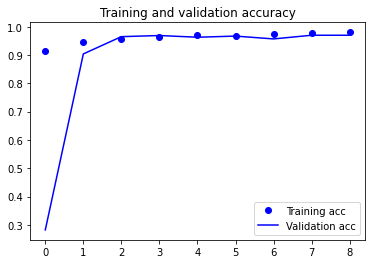

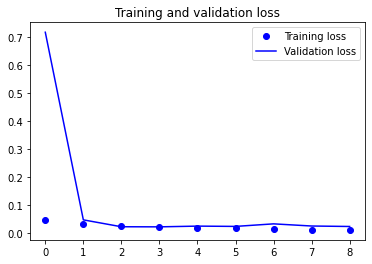

In [0]:
# Plot the accuracies and losses in model training
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

# Testing model

Load model with the general 'binary_crossentropy' 

In [0]:
# Load and evaluate a saved model
from tensorflow.keras.models import load_model
# load model 
model_path = '/content/gdrive/a/FYP_2020/data/FULLCNR_5MY_Model_10_NO_AUGMENTATION.h5'
model = load_model(model_path)

Load model with Focal Loss function

In [0]:
import os
import dill
from tensorflow.keras.models import load_model

# Path of binary CNN classification model
model_path = '/content/gdrive/a/FYP_2020/data/FOCAL_LOSS_SMALLCNR_MY_Model_5_With_Extend_Data.h5'

# Load the model with Focal Loss funtion
custom_object = {'binary_focal_loss_fixed': dill.loads(dill.dumps(binary_focal_loss(gamma=1.5, alpha=.45))),
                 'binary_focal_loss': binary_focal_loss}
if not os.path.exists(model_path):
    raise FileNotFoundError(
        'Model path {} does not exist.'.format(input_model_path))
model = load_model(model_path, custom_objects=custom_object)

Evaluate on test data

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path of test dataset
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
# Get the number of step in evaluate generator
def num_of_train_steps(path, batch_size):
    num = glob(path + '/busy/*')
    num += glob(path + '/free/*')
    return int(len(num)/batch_size)

# evaluate on test data
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= num_of_train_steps(test_dir, 20))
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9739999771118164


### Display the result

##### Show one example without detection

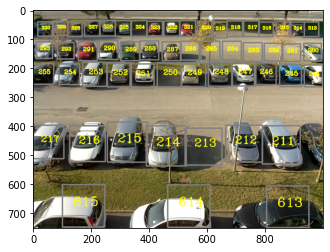

In [0]:
# One example without binary CNN classification model
import csv
import cv2
import numpy as np
from matplotlib import pyplot as plt
# construct "bbox_set2" dict
bbox_set2={}
with open('/content/gdrive/parking_dataset/camera_lots/camera8.csv') as csvfile:
    reader = csv.reader(csvfile)
    #for line in reader:
    for idx, line in enumerate(reader):
        if idx==0:
            continue
        # add into bbox_set
        bbox_set2[int(line[0])]= [int(line[1]), int(line[2]), int(line[3]), int(line[4])]

# Read one example image
img_dir = orgin_dir + "FULL_IMAGE_1000x750/OVERCAST/2015-11-20/camera8/2015-11-20_1041.jpg"
img_dir = '/content/gdrive/parkingLot_image_sample.jpg'
img = cv2.imread(img_dir)

# draw each evaluated bounding box on image
ratio = 1000.0/2592.0 # original image is 1000x2592 in size
font = cv2.FONT_HERSHEY_COMPLEX # for better font display

for slotId, bbox in bbox_set2.items():
    bbox_dim = (np.asarray(bbox)*ratio).astype(int)   # turn it into int value
    color = (128,128,128)
    cv2.rectangle(img, (bbox_dim[0], bbox_dim[1]), (bbox_dim[0]+bbox_dim[2], bbox_dim[1]+bbox_dim[3]),color,3)
    # put id text at the top of the bbox
    cv2.putText(img, str(slotId), 
                (bbox_dim[0]+bbox_dim[2]//2-bbox_dim[2]//4, bbox_dim[1]+bbox_dim[3]//2), 
                font, bbox_dim[2]/100.0 , (0,255,255), 2)
# save img
cv2.imwrite('image1111.jpg', img)

# display img
img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_display)

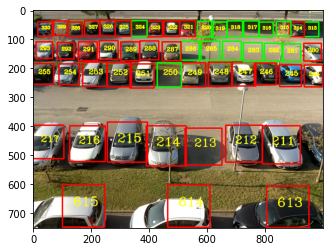

In [0]:
# One example with binary CNN classification model
import pandas as pd
import tensorflow as tf
import cv2
import sys
import os
import numpy as np
import time
from matplotlib import pyplot as plt
from PIL import Image
import csv
from tensorflow.keras import models

# construct "bbox_set2" dict
bbox_set2={}
csv_name = '/content/gdrive/parking_dataset/camera_lots/camera8.csv'
#csv_name = '/content/gdrive/cam8.csv'
with open(csv_name) as csvfile:
    reader = csv.reader(csvfile)
    #for line in reader:
    for idx, line in enumerate(reader):
        if idx==0:
            continue
        # add into bbox_set
        bbox_set2[int(line[0])]= [int(line[1]), int(line[2]), int(line[3]), int(line[4])]

# Read one example image
img_dir = orgin_dir + "FULL_IMAGE_1000x750/OVERCAST/2015-11-20/camera8/2015-11-20_1041.jpg"
img_dir = '/content/gdrive/parkingLot_image_sample.jpg'
img = cv2.imread(img_dir)

# draw each evaluated bounding box on image
ratio = 1000.0/2592.0 # original image is 1000x2592 in size
font = cv2.FONT_HERSHEY_COMPLEX # for better font display
patches = {} # create a dictory to store all the patches
for slotId, bbox in bbox_set2.items():
    bbox_dim = (np.asarray(bbox)*ratio).astype(int)   # turn it into int value
    patch = img[bbox_dim[1]:bbox_dim[1]+bbox_dim[3], bbox_dim[0]:bbox_dim[0]+bbox_dim[2]]
    patch = cv2.resize(patch, (150, 150))

    patches[slotId] = patch
    # convert to RGB format, compatible with keras training
    patch_input = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
    patch_input = patch_input/255.0 # rescale to (0,1) range 
    patch_tensor = np.expand_dims(patch_input, axis=0) # append the batch_size=1 at the beginnning
    
    # let patch_input forward pass the network
    last_output_model = models.Model(inputs=model.input, outputs=model.layers[-1].output)
    output = last_output_model.predict(patch_tensor)

    # classify the status of occupancy
    if output[0,0] > 0.5:
        output_str = "FREE"
        color = (0,255,0)
    else:
        output_str = "BUSY"
        color = (0,0,255)

    output_str=str(slotId)+":"+output_str
    # put id text at the top of the bbox
    cv2.putText(patch, output_str, (0, patch.shape[1]//2),
                font, bbox_dim[2]/100.0 , (0,255,255), 2)
    
    # draw final output(free or busy) onto img
    cv2.rectangle(img, (bbox_dim[0], bbox_dim[1]), (bbox_dim[0]+bbox_dim[2], bbox_dim[1]+bbox_dim[3]), color,3)
    # put id text at the top of the bbox
    cv2.putText(img, str(slotId), 
                (bbox_dim[0]+bbox_dim[2]//2-bbox_dim[2]//4, bbox_dim[1]+bbox_dim[3]//2), 
                font, bbox_dim[2]/100.0 , (0,255,255), 2)
    # save img
    cv2.imwrite('parkingspace_detect_img.jpg', img)

    # display img
    img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_display)

##### Simulate the real situation with the collection of full camera image

output1.jpg is save! The time is: 13.741993427276611


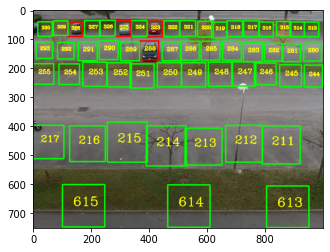

output2.jpg is save! The time is: 21.94041085243225


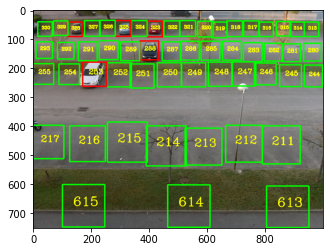

output3.jpg is save! The time is: 30.463496208190918


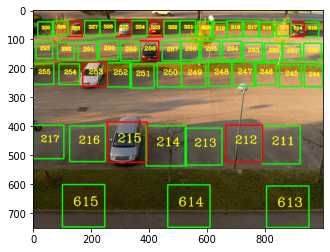

output4.jpg is save! The time is: 38.83373832702637


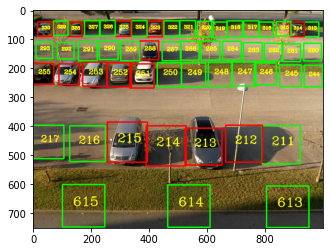

output5.jpg is save! The time is: 46.89271306991577


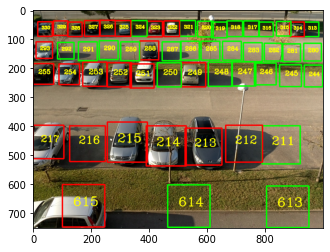

output6.jpg is save! The time is: 55.74353075027466


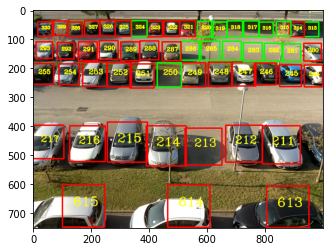

output7.jpg is save! The time is: 63.96843719482422


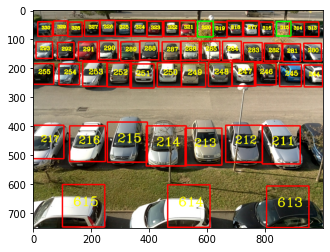

output8.jpg is save! The time is: 71.91461396217346


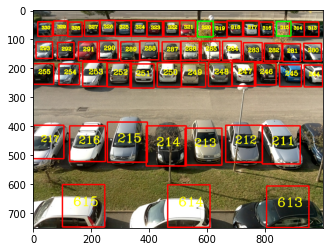

output9.jpg is save! The time is: 80.35828399658203


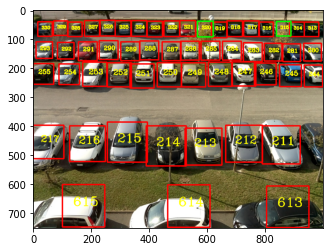

output10.jpg is save! The time is: 88.95123791694641


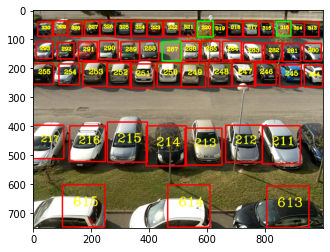

output11.jpg is save! The time is: 97.40910148620605


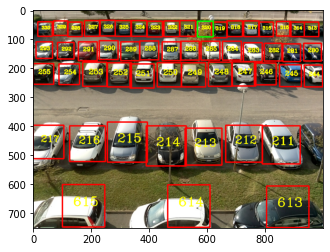

output12.jpg is save! The time is: 105.54894948005676


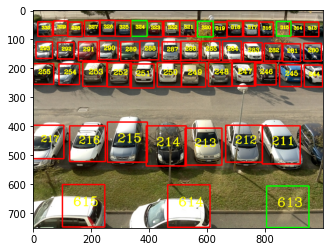

output13.jpg is save! The time is: 115.5495388507843


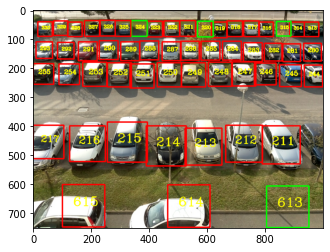

output14.jpg is save! The time is: 124.06131601333618


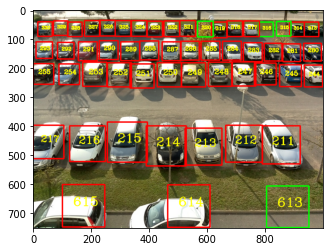

output15.jpg is save! The time is: 132.8737931251526


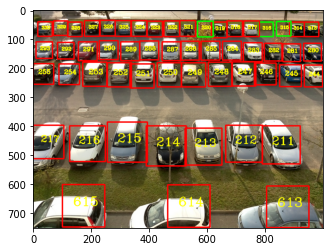

output16.jpg is save! The time is: 141.25455379486084


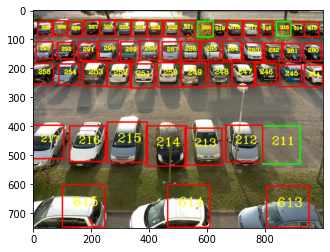

output17.jpg is save! The time is: 149.45628809928894


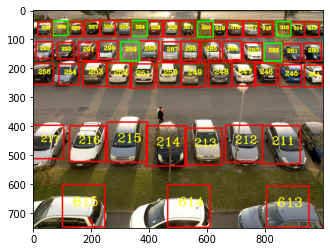

output18.jpg is save! The time is: 157.52794408798218


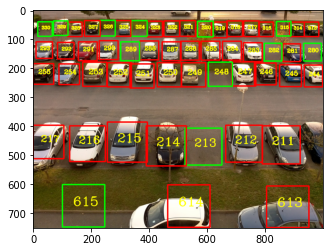

output19.jpg is save! The time is: 165.88255643844604


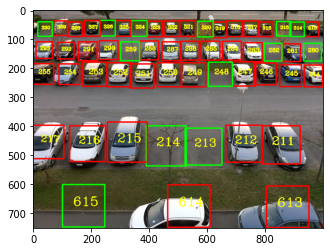

output20.jpg is save! The time is: 174.2602322101593


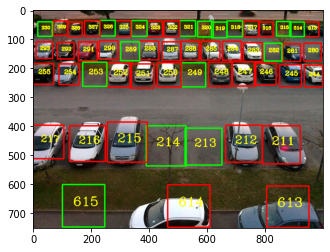

In [0]:
# Test the Model in testing dataset
import pandas as pd
import tensorflow as tf
import cv2
import sys
import os
import numpy as np
import time
from matplotlib import pyplot as plt
from PIL import Image
import csv
from tensorflow.keras import models

start = time.time()
count = 0
cam = 'camera8'
path_source = orgin_dir + 'FULL_IMAGE_1000x750/SUNNY/2015-11-12/' + cam
path_location = orgin_dir + 'camera_lots/' + cam + '.csv'

patch_size = (150,150)
ratio = 1000.0/2592.0 # original image is 1000x2592 in size
font = cv2.FONT_HERSHEY_COMPLEX # for better font display

# construct "bbox_set2" dict
bbox_set2={}
with open(path_location) as csvfile:
    reader = csv.reader(csvfile)
    #for line in reader:
    for idx, line in enumerate(reader):
        if idx==0:
            continue
        # add into bbox_set
        bbox_set2[int(line[0])]= [int(line[1]), int(line[2]), int(line[3]), int(line[4])]

# Perform classification for each parking lot
for files in os.listdir(path_source):
    if files.endswith('.jpg'):
        image = path_source + '/' + files

        # Perform classification for each parking lot
        img = cv2.imread(image)
        patches = {} # create a dictory to store all the patches

        # extract patches
        for slotId, bbox in bbox_set2.items():
            bbox_dim = (np.asarray(bbox)*ratio).astype(int)   # turn it into int value
            patch = img[bbox_dim[1]:bbox_dim[1]+bbox_dim[3], bbox_dim[0]:bbox_dim[0]+bbox_dim[2]]
            # resize patch to (150x150) in size
            #patch = cv2.resize(patch, (75,75))
            patch = cv2.resize(patch, patch_size)
            # append patch into patches dict
            patches[slotId] = patch
            # convert to RGB format, compatible with keras training
            patch_input = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
            patch_input = patch_input/255.0 # rescale to (0,1) range 
            patch_tensor = np.expand_dims(patch_input, axis=0) # append the batch_size=1 at the beginnning
            
            # let patch_input forward pass the network
            last_output_model = models.Model(inputs=model.input, outputs=model.layers[-1].output)
            output = last_output_model.predict(patch_tensor)
            
            if output[0,0] > 0.5:
                output_str = "FREE"
                color = (0,255,0)
            else:
                output_str = "BUSY"
                color = (0,0,255)
            output_str=str(slotId)+":"+output_str
            
            # put id text at the top of the bbox
            cv2.putText(patch, output_str, (0, patch.shape[1]//2),
                        font, bbox_dim[2]/100.0 , (0,255,255), 2)
            
            # draw final output(free or busy) onto img
            cv2.rectangle(img, (bbox_dim[0], bbox_dim[1]), (bbox_dim[0]+bbox_dim[2], bbox_dim[1]+bbox_dim[3]), color,3)
            # put id text at the top of the bbox
            cv2.putText(img, str(slotId), 
                        (bbox_dim[0]+bbox_dim[2]//2-bbox_dim[2]//4, bbox_dim[1]+bbox_dim[3]//2), 
                        font, bbox_dim[2]/100.0 , (0,255,255), 2)
            
            
        # save img
        count += 1
        outputimg = 'output' + str(count) + '.jpg'
        cv2.imwrite(outputimg, img)
        print(str(outputimg) + ' is save! The time is: ' + str(time.time() - start))

        # display img
        img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_display)
        plt.show()

### Testing CNN model From CNR-EXT parking lot video

##### **GET NEW Train Parking Space Image From Video** 

testing_1.mp4 is download from https://www.youtube.com/watch?time_continue=3&v=HnJYSWY60nA

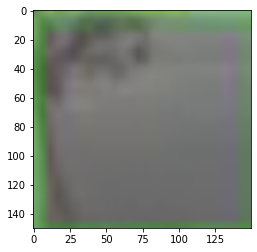

output251.jpg is save! The time is: 461.978533744812


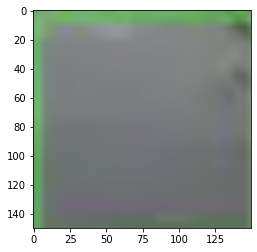

output252.jpg is save! The time is: 463.2292137145996


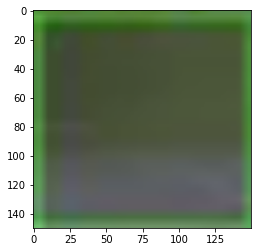

output253.jpg is save! The time is: 464.086608171463


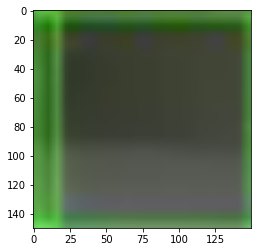

output254.jpg is save! The time is: 464.9329090118408


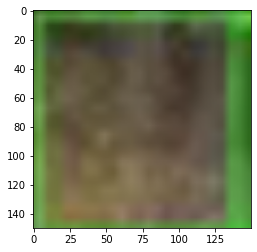

output255.jpg is save! The time is: 474.6806116104126


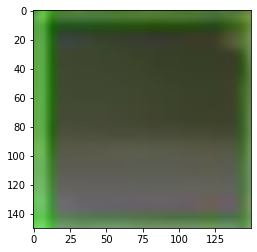

output256.jpg is save! The time is: 475.6423907279968


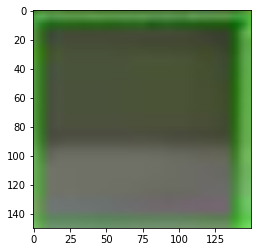

output257.jpg is save! The time is: 477.54376673698425


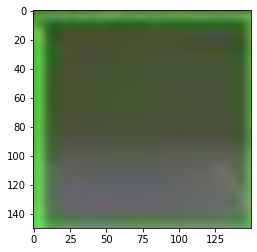

output258.jpg is save! The time is: 478.3488144874573


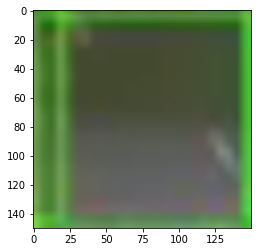

output259.jpg is save! The time is: 479.21935987472534


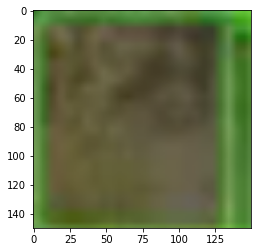

output260.jpg is save! The time is: 480.1055543422699


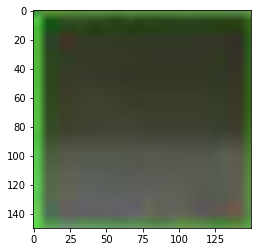

output261.jpg is save! The time is: 480.9232859611511


KeyboardInterrupt: ignored

In [0]:
# GET NEW Train Image From Video (The video is camera8)
import cv2
import sys
import os
import time
import csv

import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from tensorflow.keras import models
from IPython.display import clear_output

# Saving output path
save_dir = '/content/gdrive/FYP/new_train_data/test1'
# Video path and number of camera
video_path = '/content/gdrive/a/FYP_2020/data/testing_1.mp4'
cam = 'camera8'

# Building the path of new training image
def creat_save_path(p0):
		p1 = p0 + '/busy'
		if not os.path.exists(p1):
				os.makedirs(p1)
		p2 = p0 + '/free'
		if not os.path.exists(p2):
				os.makedirs(p2)
		return p1, p2

start = time.time()

count = 0
count_busy = 0
count_free = 0
patch_size = (150, 150) 				 		# size in resizing patch
path_location = orgin_dir + 'camera_lots/' + cam + '.csv'
ratio = 1000.0/2592.0						 		# original image is 1000x2592 in size
font = cv2.FONT_HERSHEY_COMPLEX  		# for better font display
p1, p2 = creat_save_path(save_dir)	# Create save path (only classify busy or free)

def adjust_gamma(image, gamma=1.0):
		invGamma = 1.0 / gamma
		table = np.array([((i / 255.0) ** invGamma) * 255
				for i in np.arange(0, 256)]).astype("uint8")
		return cv2.LUT(image.astype(np.uint8), table.astype(np.uint8))
	
def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size) #  the kernel size is depending on image size
    return cv2.mean(blur)[0]
# construct "bbox_set2" dict
bbox_set2={}
with open(path_location) as csvfile:
		reader = csv.reader(csvfile)
		for idx, line in enumerate(reader):
				if idx==0:
						continue
				# add into bbox_set
				bbox_set2[int(line[0])]= [int(line[1]), int(line[2]), int(line[3]), int(line[4])]


# Read Video
camera = cv2.VideoCapture(video_path)
while True:
		ret, frame = camera.read()

		# for a better display
		brightness = check_brightness(frame, (1000,750))
		if brightness < 50.0:  
				gamma = 1.5
		elif brightness < 15.0:
				gamma = 2.5
		elif brightness > 150.0:
				gamma = 0.5
		else:
				gamma = 1.0
		img = adjust_gamma(frame, gamma = gamma)
	
		patches = {} # create a dictory to store all the patches
		for slotId, bbox in bbox_set2.items():			
						bbox_dim = (np.asarray(bbox)*ratio).astype(int)   # turn it into int value
						patch = img[bbox_dim[1]:bbox_dim[1]+bbox_dim[3], bbox_dim[0]:bbox_dim[0]+bbox_dim[2]]
						# resize patch to (150x150) in size
						patch = cv2.resize(patch, patch_size)
						# append patch into patches dict
						patches[slotId] = patch
						# convert to RGB format, compatible with keras training
						patch_input = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
						patch_input = patch_input/255.0 # rescale to (0,1) range 
						patch_tensor = np.expand_dims(patch_input, axis=0) # expand the image tensor to add batch_size=1 at the beginnning
						
						# let patch_input forward pass the network
						last_output_model = models.Model(inputs=model.input, outputs=model.layers[-1].output)
						output = last_output_model.predict(patch_tensor)

						if output[0,0] > 0.5:
								output_str = "FREE"
								count_free += 1
								save_d = p2 + '/free_' + str(count_free) + '.jpg'
						else:
								output_str = "BUSY"
								count_busy += 1
								save_d = p1 + '/busy_' + str(count_busy) + '.jpg'
						# save image
						cv2.imwrite(save_d, patch)
			
						# Clear output when image shows more than 50
						if count % 50 == 0:
								clear_output(wait=True)
						
						# display patch
						patch_display = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
						plt.imshow(patch_display)
						plt.show()
	
						# Display the number of data collection
						outputimg = 'output' + str(count) + '.jpg'
						print(str(outputimg) + ' is save! The time is: ' + str(time.time() - start))

		# Wait for Esc(33) key to stop
		if cv2.waitKey(33) & 0xff == 27:
				break

camera.release()

# De-allocate any associated memory usage 
cv2.destroyAllWindows()

##### **Sample simulation realistic working process in smart camera**

/content/gdrive/FYP/aoooo/test1/output42.jpg is save! The time is: 227.38675355911255 epoch: 1025
00:00:41 / 00:00:41


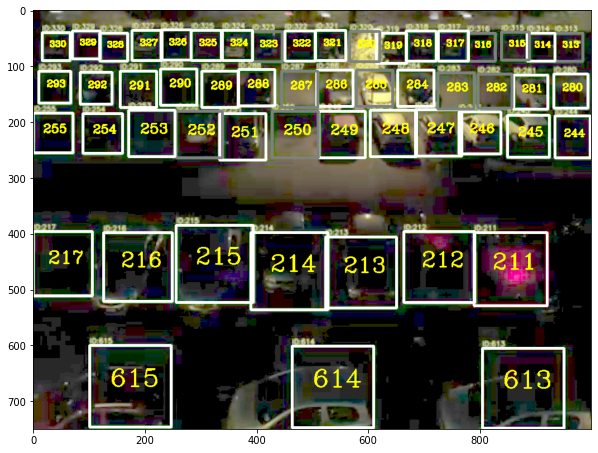

Detial of Parking Status:
    busy_time status_cur status_bef  Tolls
ID                                        
211        36       BUSY       BUSY    198
212         2       BUSY       BUSY     11
213        36       BUSY       BUSY    198
214        38       BUSY       BUSY    209
215        38       BUSY       BUSY    209
216        38       BUSY       BUSY    209
217         2       BUSY       BUSY     11
244        35       BUSY       BUSY  192.5
245        16       BUSY       BUSY     88
246        36       BUSY       BUSY    198
247        36       BUSY       BUSY    198
248        35       BUSY       BUSY  192.5
249        18       BUSY       BUSY     99
250         0       FREE       FREE      0
251        37       BUSY       BUSY  203.5
252         0       FREE       FREE      0
253        25       BUSY       BUSY  137.5
254        41       BUSY       BUSY  225.5
255         2       BUSY       BUSY     11
280        18       BUSY       BUSY     99
281        33       BUSY    

In [0]:
#!pip install git+https://www.github.com/farizrahman4u/keras-contrib.git
import cv2
import sys
import os
import time
import csv

import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from time import gmtime
from time import strftime
from PIL import Image
from tensorflow.keras import models
from IPython.display import clear_output

from tensorflow.keras.models import load_model
import tensorflow_addons as tfa
from tensorflow.keras.models import load_model
from numpy import load
from numpy import vstack
from matplotlib import pyplot
from numpy.random import randint
#from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
#from tensorflow_addons.layers import InstanceNormalization
import cv2

# Source Video path from camera
video_path = '/content/gdrive/a/FYP_2020/data/testing_1.mp4'

# Saving output path
save_dir = '/content/gdrive/FYP/aoooo/test1/'

# Parking space location csv file
cam = 'camera8'
path_location = orgin_dir + 'camera_lots/' + cam + '.csv'

start = time.time()

time_step = 1                       # the display time of each frame
bbox_set2={}                        # construct "bbox_set2" dict for store parking lot location info
per_sec_toll = 5.5                  # the toll($) per seconds 

count = 0
count_busy = 0
count_free = 0
patch_size = (150, 150) 				 		# size in resizing patch

ratio = 1000.0/2592.0						 		# original image is 1000x2592 in size
font = cv2.FONT_HERSHEY_COMPLEX  		# for better font display

df = pd.DataFrame(columns=['ID', 'busy_time','status_cur', 'status_bef'])

# Load CYCLE GAN Model
#cust = {'InstanceNormalization': InstanceNormalization}
#model_BA = load_model('/content/gdrive/FYP/workGanOutput/python/t14/gen_model/g_model_BA_48_50.h5', cust)
#model_BA = load_model('/content/gdrive/FYP/workGanOutput/python/t30/gen_model/g_model_BA_99_60.h5', cust)

# Building the path of new training image
def creat_save_path(sd):
		if not os.path.exists(sd):
				os.makedirs(sd)

# Adjust the gamma
def adjust_gamma(image, gamma=1.0):
   invGamma = 1.0 / gamma
   table = np.array([((i / 255.0) ** invGamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")
   return cv2.LUT(image.astype(np.uint8), table.astype(np.uint8))

# Record the status in whole video
def counter(num,status='busy', carId=2, new = False):
    global df
    global time_step
    cur_date = str(pd.datetime.now().date())
    hour = int(pd.datetime.now().hour)
    minute = int(pd.datetime.now().minute)
    second = int(pd.datetime.now().second)
    cur_time = '{:s}-{:02d}:{:02d}:{:02d}'.format(cur_date, hour, minute, second)
    
    if num == 0: # Created the df with all parking space id
        df = df.append({'ID': carId, 'busy_time': 0, 'status_bef': 'nan',
                        'status_cur': status, 'start_status':status}, ignore_index=True)
        #df = df.append([2], ignore_index=True)
    else:
        if new == True:
            df[cur_time] = 'unknown'
            
        carId = int(df[df['ID']==carId].index.values)
        df.at[carId, 'status_bef'] = df.iloc[carId, 2]
        df.at[carId, 'status_cur'] = status
        df.at[carId, df.columns[-1]] = status
        df1 = df.iloc[:,4:(len(df.columns))]
        count = 0
        for i in range(1, len(df1.columns)):
            st = str(df1.iloc[carId, i])
            if st == 'BUSY':
                count += 1
            elif st == 'FREE':
                count = 0
        df.at[carId, 'busy_time'] = count * time_step

def display_counter():
    global df
    df1 = df.iloc[:, 0:4].copy()
    df1 = df1.sort_values(by=['ID'])
    df1 = df1.set_index('ID')
    df1.insert(3, 'Tolls', df1['busy_time'] * per_sec_toll, True) 
    print('Detial of Parking Status:')
    print(df1.iloc[:, [0,1,2,3]]) 

# load the info and store into construct "bbox_set2" dict
def create_bbox_set2():
    global bbox_set2
    with open(path_location) as csvfile:
        reader = csv.reader(csvfile)
        #for line in reader:
        for idx, line in enumerate(reader):
            if idx==0:
                continue
            # add into bbox_set
            bbox_set2[int(line[0])]= [int(line[1]), int(line[2]), int(line[3]), int(line[4])]

# 
creat_save_path(save_dir)	# Create save path (only classify busy or free)
i = -1
seconds = -1
# Read Video
video_cap = cv2.VideoCapture(video_path)
success = True
total_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT) # Total frames of video
fps = video_cap.get(cv2.CAP_PROP_FPS) # Frame per sencond
vid_end_time = int(total_frames / fps)
create_bbox_set2()
while success:
    success, frame = video_cap.read()
    if success == False:
        break
    #if (count + 1) % 100 == 0:
        #break

    frame = cv2.resize(frame, (1000,750))
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, (1000, 750)) # With kernel size depending upon image size
    if cv2.mean(blur)[0] < 30.0:
        gamma = 3.0
        img = adjust_gamma(frame, gamma=gamma)
        #img = frame
    else:
        img = frame
    patches = {} # create a dictory to store all the patches
    i += 1
    
    if i % (1 * fps) != 0:
      continue
    else:
      seconds += 1
      check = True
      
      sn_num = 0
      for slotId, bbox in bbox_set2.items():
          bbox_dim = (np.asarray(bbox)*ratio).astype(int)   # turn it into int value
          patch = img[bbox_dim[1]:bbox_dim[1]+bbox_dim[3], bbox_dim[0]:bbox_dim[0]+bbox_dim[2]]
          # resize patch to (150x150) in size
          patch = cv2.resize(patch, patch_size)
          # append patch into patches dict
          patches[slotId] = patch
          # convert to RGB format, compatible with keras training
          patch_input = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
          patch_input = patch_input/255.0 # rescale to (0,1) range 
          patch_tensor = np.expand_dims(patch_input, axis=0) # expand the image tensor to add batch_size=1 at the beginnning

          # let patch_input forward pass the network
          last_output_model = models.Model(inputs=model.input, outputs=model.layers[-1].output)
          output = last_output_model.predict(patch_tensor)

          if output[0,0] > 0.5:
              output_str = "FREE"
              color = (128,128,128) # Gray
          else:
              output_str = "BUSY"
              color = (255,255,255) # White
          
          counter(seconds, carId = slotId, status = output_str, new = check)
          check = False
          output_str=str(slotId)+":"+output_str

          # put id text at the top of the bbox
          cv2.putText(patch, output_str, (0, patch.shape[1]//2),
                      font, bbox_dim[2]/100.0 , (0,255,255), 2)

          # draw final output(free or busy) onto img
          cv2.rectangle(img, (bbox_dim[0], bbox_dim[1]), (bbox_dim[0]+bbox_dim[2], bbox_dim[1]+bbox_dim[3]), color,3)
          # put id text at the top of the bbox
          cv2.putText(img, str(slotId), 
                      (bbox_dim[0]+bbox_dim[2]//2-bbox_dim[2]//4, bbox_dim[1]+bbox_dim[3]//2), 
                      font, bbox_dim[2]/100.0 , (0,255,255), 2)
      clear_output(wait=True) # Clear the display in each loop
      # save img
      count += 1
      outputimg = save_dir + 'output' + str(count) + '.jpg'
      cv2.imwrite(outputimg, img)
      print(str(outputimg) + ' is save! The time is: ' + str(time.time() - start) + ' epoch: ' + str(i))
      print(strftime("%H:%M:%S", gmtime(seconds)), '/',
            strftime("%H:%M:%S", gmtime(vid_end_time)))
      # display img
      img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      plt.figure(figsize=(10,10))
      plt.imshow(img_display)
      plt.show()
      display_counter()
      # Wait for Esc(33) key to stop 24 
    if cv2.waitKey(24) & 0xff == 27:
      break

video_cap.release()
# De-allocate any associated memory usage 
cv2.destroyAllWindows()

# CYCLE GAN generated image example

In [0]:
!pip install git+https://www.github.com/farizrahman4u/keras-contrib.git

  Cloning https://www.github.com/farizrahman4u/keras-contrib.git to /tmp/pip-req-build-3cjeo2w1
  Running command git clone -q https://www.github.com/farizrahman4u/keras-contrib.git /tmp/pip-req-build-3cjeo2w1
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-cp36-none-any.whl size=101064 sha256=60f27b2300fbedbb0acb133db4349314da4130be52b7dc31ac0834694cbabf72
  Stored in directory: /tmp/pip-ephem-wheel-cache-ty4j4ej3/wheels/1f/8e/ac/fb1cca9d92276d64365b204e82a9a5bec1f24a20aca28fdbec
Successfully built keras-contrib


Loaded (1000, 128, 128, 3) (1000, 128, 128, 3)
[354, 539, 683, 569]


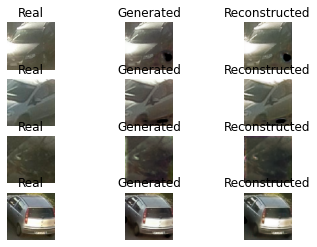

[473, 153]


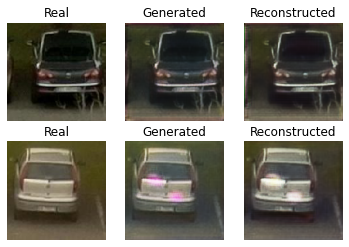

In [0]:
from tensorflow.keras.models import load_model
import tensorflow_addons as tfa
from tensorflow.keras.models import load_model
from numpy import load
from numpy import vstack
from matplotlib import pyplot
from numpy.random import randint
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
#from tensorflow_addons.layers import InstanceNormalization
import cv2

# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = X1 / 127.5 - 1.
    X2 = X2 / 127.5 - 1.
    return [X1, X2]

# select a random sample of images from the dataset
def select_sample(dataset, n_samples):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    #print(str(ix))
    res = [int(x) for x in ix]
    imgs = dataset[res]
    print(res)
    # retrieve selected images
    X = imgs
    return X

# plot the image, the translation, and the reconstruction
def show_plot(imagesX, imagesY1, imagesY2):
    images = vstack((imagesX, imagesY1, imagesY2))
    titles = ['Real', 'Generated', 'Reconstructed']
    # scale from [-1,1] to [0,1]
    images = 0.5 * images + 0.5
    if int(len(images) / 3) > 1:
        r, c = int(len(images) / 3), 3
        fig, axs = pyplot.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(images[cnt%len(images) + int(cnt/len(images))])
                axs[i, j].set_title(titles[j])
                axs[i,j].axis('off')
                cnt += int(len(images) / 3)
    else:
        for i in range(len(images)):
            # define subplot
            pyplot.subplot(1, len(images), 1 + i)
            # turn off axis
            pyplot.axis('off')
            # plot raw pixel data
            pyplot.imshow(images[i])
            # title
            pyplot.title(titles[i])
    pyplot.show()

# Load Cycle GAN model
cust = {'InstanceNormalization': InstanceNormalization}
model_AB = load_model('/content/gdrive/FYP/workGanOutput/python/t14/gen_model/g_model_AB_48_50.h5', cust)
model_BA = load_model('/content/gdrive/FYP/workGanOutput/python/t14/gen_model/g_model_BA_48_50.h5', cust)

# load dataset
root_d = '/content/gdrive/FYP/cycle_gan_val.npz' # follow the path of before step
A_data, B_data = load_real_samples(root_d)
print('Loaded', A_data.shape, B_data.shape)

# plot A->B->A
A_real = select_sample(A_data, 4)
B_generated  = model_AB.predict(A_real)
A_reconstructed = model_BA.predict(B_generated)
show_plot(A_real, B_generated, A_reconstructed)

# plot B->A->B
B_real = select_sample(B_data, 2)
A_generated  = model_BA.predict(B_real)
B_reconstructed = model_AB.predict(A_generated)
show_plot(B_real, A_generated, B_reconstructed)

# GANs

In [0]:
#import keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import numpy as np
ax = 128
latent_dim = 2
height = 150
width = 150
channels = 3

In [0]:
# Create generator
generator_input = keras.Input(shape=(latent_dim,))

x = layers.Dense(ax * 75 * 75)(generator_input)
x = layers.LeakyReLU()(x)
x = layers.Reshape((75, 75, ax))(x)#将输入转换成16*16 128通道的特征图

x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

x=layers.Conv2DTranspose(256, 4, strides=2, padding='same')(x)#上采样32*32
x = layers.LeakyReLU()(x)

x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

#产生32x32 1通道的特征图
x = layers.Conv2D(channels, 7, activation='tanh', padding='same')(x)
generator = keras.models.Model(generator_input, x)#将(latent_dim,)->(32,32,3)
generator.summary()

In [0]:
# Create discriminator
discriminator_input = layers.Input(shape=(height, width, channels))
x = layers.Conv2D(ax, 3)(discriminator_input)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(ax, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(ax, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(ax, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Flatten()(x)

x = layers.Dropout(0.4)(x)

x = layers.Dense(1, activation='sigmoid')(x)#二分类

discriminator = keras.models.Model(discriminator_input, x)
discriminator.summary()

discriminator_optimizer = keras.optimizers.RMSprop(lr=0.0008,
        clipvalue=1.0,decay=1e-8)
discriminator.compile(optimizer=discriminator_optimizer,
    loss='binary_crossentropy')

In [0]:
# Create compiled
discriminator.trainable = False

gan_input = keras.Input(shape=(latent_dim,))
gan_output = discriminator(generator(gan_input))
gan = keras.models.Model(gan_input,gan_output)

gan_optimizer = keras.optimizers.RMSprop(lr=0.0004,clipvalue=1.0,
        decay=1e-8)
gan.compile(optimizer=gan_optimizer,loss='binary_crossentropy')

In [0]:
!pip install progressbar2

In [0]:
import os
#from keras.preprocessing import image
import time
import progressbar
def barchat(n):
    bar = progressbar.ProgressBar(widgets=[
        ' [', progressbar.Timer(), '] ',
        progressbar.SimpleProgress(), ' ',
        progressbar.Percentage(), ' ',
        progressbar.Bar(), ' ',
        ' (', progressbar.ETA(), ') ',
    ])
    return bar(range(n))
#start = time.time()
#(x_train, y_train), (_, _) = keras.datasets.cifar10.load_data()
#x_train = x_train[y_train.flatten() == 6]#第6类
#print(x_train.shape[0])
#print(x_train)
#print(train_dir)
#x_train = x_train.reshape((x_train.shape[0],)+(height, width, channels)).astype('float32') / 255.0
path = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small/busy"
n = len(os.listdir(path))
imgs = np.zeros(shape=(n, 150, 150, 3))
i = 0
for files in os.listdir(path):
    if files.endswith('.jpg'):
      imagee = path + '/' + files
          # Perform classification for each parking lot
      imgg = cv2.imread(imagee)
          #print(img.shape)
      output = cv2.resize(imgg, (150,150))
      imgs[i] = output
      i += 1
    else:
      break

x_train = imgs
print('start!%d\n'%n)
time.sleep(1)
 #height, width, channels)).astype('float32') / 255.0
starttime = time.time()
iterations = 10001
batch_size = 2
if not os.path.exists('/content/gdrive/FYP/dataset_test'):
    os.makedirs('/content/gdrive/FYP/dataset_test')

save_dir = '/content/gdrive/FYP/dataset_test'#保存生成图片
save_dir = save_dir + '/150x150_batch2'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

start = 0
step = 0
for j in range(int(iterations / 50 + 1)):
  nb = 50
  if step == 0:
    nb = 49
  for count in barchat(nb):
        random_latent_vectors = np.random.normal(size=(batch_size,
            latent_dim))#正态分布随机取点
        #print(random_latent_vectors.shape, 'fake1')
        generated_images = generator.predict(random_latent_vectors)#fake图
        #print(generated_images.shape, 'generated')
        stop = start + batch_size
        real_images = x_train[start: stop]
        #print(real_images.shape, 'real')
        #混合真、假图片
        combined_images = np.concatenate([generated_images, real_images])
        #标签
        labels = np.concatenate([np.ones((batch_size, 1)),
            np.zeros((batch_size, 1))])
        labels += 0.05 * np.random.random(labels.shape)#加随机噪声
        
        d_loss = discriminator.train_on_batch(combined_images, labels)
        
        random_latent_vectors = np.random.normal(size=(batch_size,
            latent_dim))
        isleading_targets = np.zeros((batch_size, 1))
        #gan训练：训练generator，固定discriminator
        #print((random_latent_vectors.shape, isleading_targets.shape))
        a_loss = gan.train_on_batch(random_latent_vectors, isleading_targets)
        
        start += batch_size
        if start > len(x_train) - batch_size:
            start = 0
        #print('setp %s' % step)
        step = step + 1
        if step % 50 == 0 and step != 0:#每100步保存一次
            gan.save_weights('gan.h5')

            print('\nstep: [' + str(step) + '] using time: ' + str(time.time() - starttime))
            print('discriminator loss:', d_loss)
            print('adversarial loss:', a_loss)
            print(image)
            time.sleep(1)
            img = image.array_to_img(generated_images[0] * 255.0, scale=False)
            img.save(os.path.join(save_dir,'generated_frog' +str(step)+'.jpg'))
            
            img = image.array_to_img(real_images[0] * 255.0, scale=False)
            img.save(os.path.join(save_dir,'real_img' + str(step) + '.jpg'))
            

start!2532



 [Elapsed Time: 0:00:23] 49 of 49 100% |###################|  (Time:  0:00:23) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [50] using time: 23.73535704612732
discriminator loss: 7.647190093994141
adversarial loss: 0.0038465866819024086
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [100] using time: 39.19972324371338
discriminator loss: 11.527097702026367
adversarial loss: 0.5764707326889038
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [150] using time: 54.669355392456055
discriminator loss: 2.5429587364196777
adversarial loss: 1.3612135648727417
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [200] using time: 70.12815618515015
discriminator loss: 4.90708065032959
adversarial loss: 0.1262180507183075
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [250] using time: 85.7086923122406
discriminator loss: 1.2210263013839722
adversarial loss: 1.8011202812194824
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [300] using time: 101.14415192604065
discriminator loss: 1.070015788078308
adversarial loss: 2.661149024963379
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [350] using time: 116.59707593917847
discriminator loss: 1.859439492225647
adversarial loss: 1.857048749923706
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [400] using time: 132.0914433002472
discriminator loss: 1.7402375936508179
adversarial loss: 5.271066188812256
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [450] using time: 147.53526854515076
discriminator loss: 1.7809486389160156
adversarial loss: 2.13059139251709
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [500] using time: 163.07493495941162
discriminator loss: 10.583731651306152
adversarial loss: 3.5556559562683105
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [550] using time: 178.5789451599121
discriminator loss: 0.6372731924057007
adversarial loss: 2.1846518516540527
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [600] using time: 194.21458673477173
discriminator loss: 5.9706292152404785
adversarial loss: 1.2730352878570557
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [650] using time: 209.8258764743805
discriminator loss: 10.344048500061035
adversarial loss: 2.349445104598999
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [700] using time: 225.23861360549927
discriminator loss: 17.27100372314453
adversarial loss: 2.463343858718872
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [750] using time: 240.69616222381592
discriminator loss: 6.950141906738281
adversarial loss: 2.841606616973877
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [800] using time: 256.1704487800598
discriminator loss: 0.3812674283981323
adversarial loss: 2.523000717163086
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [850] using time: 271.6124629974365
discriminator loss: 3.1869184970855713
adversarial loss: 6.751903533935547
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [900] using time: 287.10620880126953
discriminator loss: 4.8244099617004395
adversarial loss: 3.8636460304260254
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [950] using time: 302.5503640174866
discriminator loss: 10.414206504821777
adversarial loss: 4.960732460021973
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1000] using time: 318.1167631149292
discriminator loss: 0.9822012782096863
adversarial loss: 4.411618232727051
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1050] using time: 333.5993356704712
discriminator loss: 6.0300445556640625
adversarial loss: 5.865102291107178
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1100] using time: 349.1028826236725
discriminator loss: 33.525306701660156
adversarial loss: 5.4430389404296875
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1150] using time: 364.5930931568146
discriminator loss: 8.03149127960205
adversarial loss: 3.3748111724853516
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1200] using time: 380.0451624393463
discriminator loss: 1.220794439315796
adversarial loss: 3.6254775524139404
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1250] using time: 395.4518566131592
discriminator loss: 3.8957042694091797
adversarial loss: 3.3032093048095703
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1300] using time: 410.8876624107361
discriminator loss: 15.310600280761719
adversarial loss: 1.563753604888916
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1350] using time: 426.5915353298187
discriminator loss: 3.6398141384124756
adversarial loss: 3.6159379482269287
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1400] using time: 442.0078911781311
discriminator loss: 119.7018814086914
adversarial loss: 1.6482250690460205
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1450] using time: 457.37185764312744
discriminator loss: 25.557615280151367
adversarial loss: 2.342848062515259
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1500] using time: 472.8070070743561
discriminator loss: 9.621150016784668
adversarial loss: 1.8255993127822876
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1550] using time: 488.2936110496521
discriminator loss: 6.673715114593506
adversarial loss: 3.8301987648010254
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1600] using time: 503.80250334739685
discriminator loss: 0.9560071229934692
adversarial loss: 4.750118255615234
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1650] using time: 519.3141160011292
discriminator loss: 22.351299285888672
adversarial loss: 1.9974606037139893
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1700] using time: 534.8024597167969
discriminator loss: 1.9728401899337769
adversarial loss: 4.207578659057617
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1750] using time: 550.2254164218903
discriminator loss: 2.2537496089935303
adversarial loss: 3.7015790939331055
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1800] using time: 565.6880447864532
discriminator loss: 12.425127029418945
adversarial loss: 1.4416651725769043
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1850] using time: 581.1502990722656
discriminator loss: 1.1910227537155151
adversarial loss: 3.2609753608703613
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1900] using time: 596.5920844078064
discriminator loss: 1.5451620817184448
adversarial loss: 1.0374654531478882
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [1950] using time: 612.0485002994537
discriminator loss: 11.202054977416992
adversarial loss: 2.51763916015625
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2000] using time: 627.4942629337311
discriminator loss: 413.0229187011719
adversarial loss: 2.508171558380127
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2050] using time: 642.8821337223053
discriminator loss: 10.750089645385742
adversarial loss: 4.819550514221191
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2100] using time: 658.2963576316833
discriminator loss: 63.535789489746094
adversarial loss: 5.142181873321533
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2150] using time: 673.8444521427155
discriminator loss: 7.0604658126831055
adversarial loss: 9.208109855651855
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2200] using time: 689.2942230701447
discriminator loss: 1.5749510526657104
adversarial loss: 3.5894734859466553
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2250] using time: 704.7249267101288
discriminator loss: 13.620108604431152
adversarial loss: 3.38632869720459
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2300] using time: 720.1636276245117
discriminator loss: 5.09790563583374
adversarial loss: 1.3237202167510986
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2350] using time: 735.5548374652863
discriminator loss: 4.451318740844727
adversarial loss: 11.980552673339844
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2400] using time: 750.9258472919464
discriminator loss: 19.70720672607422
adversarial loss: 9.046540260314941
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2450] using time: 766.3352482318878
discriminator loss: 24.3925724029541
adversarial loss: 7.041229248046875
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2500] using time: 781.8379700183868
discriminator loss: 1.8143141269683838
adversarial loss: 12.639486312866211
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2550] using time: 797.2617509365082
discriminator loss: 8.881805419921875
adversarial loss: 23.988656997680664
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2600] using time: 812.7802395820618
discriminator loss: 242.75326538085938
adversarial loss: 25.57703399658203
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2650] using time: 828.2730405330658
discriminator loss: 619.281494140625
adversarial loss: 64.61293029785156
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2700] using time: 843.7439935207367
discriminator loss: -0.3111093044281006
adversarial loss: 38.640113830566406
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2750] using time: 859.2689571380615
discriminator loss: 15.014394760131836
adversarial loss: 76.47144317626953
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2800] using time: 874.9067542552948
discriminator loss: -1.0006656646728516
adversarial loss: 87.50234985351562
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2850] using time: 890.4274518489838
discriminator loss: 171.11187744140625
adversarial loss: 189.86117553710938
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2900] using time: 905.9814608097076
discriminator loss: 5.061676979064941
adversarial loss: 1702.71533203125
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [2950] using time: 921.4980170726776
discriminator loss: 2447.150390625
adversarial loss: 39045.9921875
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3000] using time: 936.9839062690735
discriminator loss: 5652.46875
adversarial loss: 258224.9375
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3050] using time: 952.4229643344879
discriminator loss: -182.807373046875
adversarial loss: 143518.984375
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3100] using time: 967.8460211753845
discriminator loss: -23290.431640625
adversarial loss: 1896294.125
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3150] using time: 983.3165626525879
discriminator loss: -12338.4375
adversarial loss: 16907622.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3200] using time: 998.7753329277039
discriminator loss: 3571567.0
adversarial loss: 1679465.625
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3250] using time: 1014.2161304950714
discriminator loss: -60302.87890625
adversarial loss: 11937881.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3300] using time: 1029.685242176056
discriminator loss: 1146275.375
adversarial loss: 17498808.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3350] using time: 1045.099797487259
discriminator loss: -366876.6875
adversarial loss: 27075600.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3400] using time: 1060.4869828224182
discriminator loss: 1465852.875
adversarial loss: 67626768.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3450] using time: 1075.8662564754486
discriminator loss: -1291898.25
adversarial loss: 131054888.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3500] using time: 1091.1729702949524
discriminator loss: 218263872.0
adversarial loss: 237642656.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3550] using time: 1106.5678088665009
discriminator loss: -1039785.5
adversarial loss: 388134272.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3600] using time: 1122.2563376426697
discriminator loss: -14315728.0
adversarial loss: 1014482304.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3650] using time: 1137.6259784698486
discriminator loss: -18017888.0
adversarial loss: 1374320640.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3700] using time: 1152.9514918327332
discriminator loss: -32054610.0
adversarial loss: 2627051776.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3750] using time: 1168.3729894161224
discriminator loss: -54889672.0
adversarial loss: 4226939904.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3800] using time: 1183.7451758384705
discriminator loss: 427383648.0
adversarial loss: 5071949824.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3850] using time: 1199.0945718288422
discriminator loss: -133588448.0
adversarial loss: 9754560512.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3900] using time: 1214.466807126999
discriminator loss: -137796416.0
adversarial loss: 15339432960.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [3950] using time: 1229.8799059391022
discriminator loss: -290761728.0
adversarial loss: 19630979072.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4000] using time: 1245.1890573501587
discriminator loss: -575816192.0
adversarial loss: 33047400448.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4050] using time: 1260.5413024425507
discriminator loss: -105264224.0
adversarial loss: 51196010496.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4100] using time: 1275.9082264900208
discriminator loss: -494696544.0
adversarial loss: 77341925376.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4150] using time: 1291.2163915634155
discriminator loss: -1487364736.0
adversarial loss: 112047374336.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4200] using time: 1306.6060693264008
discriminator loss: -916783744.0
adversarial loss: 140809846784.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4250] using time: 1321.9720859527588
discriminator loss: -3465613056.0
adversarial loss: 173122879488.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4300] using time: 1337.307401895523
discriminator loss: 270743328.0
adversarial loss: 91366612992.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4350] using time: 1352.5897340774536
discriminator loss: -470832000.0
adversarial loss: 81049477120.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4400] using time: 1367.8664314746857
discriminator loss: 1229475072.0
adversarial loss: 137118433280.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4450] using time: 1383.2781038284302
discriminator loss: 40647802880.0
adversarial loss: 156365651968.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4500] using time: 1398.6781072616577
discriminator loss: -1541605632.0
adversarial loss: 197168562176.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4550] using time: 1414.0671951770782
discriminator loss: -3492237824.0
adversarial loss: 244007993344.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4600] using time: 1429.4072155952454
discriminator loss: 90163445760.0
adversarial loss: 253629497344.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4650] using time: 1444.8540761470795
discriminator loss: 9877254144.0
adversarial loss: 274908381184.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4700] using time: 1460.1585652828217
discriminator loss: 68153229312.0
adversarial loss: 288972734464.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4750] using time: 1475.4248745441437
discriminator loss: -3224881664.0
adversarial loss: 351449284608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4800] using time: 1490.9008209705353
discriminator loss: 31331942400.0
adversarial loss: 357840060416.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4850] using time: 1506.210905790329
discriminator loss: 74465329152.0
adversarial loss: 412593356800.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4900] using time: 1521.596831560135
discriminator loss: -6913092608.0
adversarial loss: 482204516352.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [4950] using time: 1536.986090183258
discriminator loss: -2064884224.0
adversarial loss: 464996302848.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5000] using time: 1552.330429315567
discriminator loss: -4912015360.0
adversarial loss: 549786353664.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5050] using time: 1567.7999286651611
discriminator loss: -1594403840.0
adversarial loss: 607988547584.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5100] using time: 1583.2075655460358
discriminator loss: -1640429568.0
adversarial loss: 672115064832.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5150] using time: 1598.5728595256805
discriminator loss: -8906708992.0
adversarial loss: 789232746496.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5200] using time: 1613.9788229465485
discriminator loss: 273041670144.0
adversarial loss: 784695361536.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5250] using time: 1629.5596961975098
discriminator loss: 908154372096.0
adversarial loss: 953985269760.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5300] using time: 1645.0280289649963
discriminator loss: -17645332480.0
adversarial loss: 1089469546496.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5350] using time: 1660.5147001743317
discriminator loss: -16635611136.0
adversarial loss: 1192359100416.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5400] using time: 1675.9928607940674
discriminator loss: -14380369920.0
adversarial loss: 1275157938176.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5450] using time: 1691.4925727844238
discriminator loss: 2095112650752.0
adversarial loss: 1252116660224.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5500] using time: 1707.0104455947876
discriminator loss: -24643706880.0
adversarial loss: 1472873103360.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5550] using time: 1722.4808406829834
discriminator loss: 2300357378048.0
adversarial loss: 1533891313664.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5600] using time: 1738.1326203346252
discriminator loss: 20806533120.0
adversarial loss: 1653607497728.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5650] using time: 1753.6682591438293
discriminator loss: -19658768384.0
adversarial loss: 1767585873920.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5700] using time: 1769.1920807361603
discriminator loss: -37519618048.0
adversarial loss: 1961006596096.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5750] using time: 1784.6622531414032
discriminator loss: 13227290624.0
adversarial loss: 2200677646336.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5800] using time: 1800.1289727687836
discriminator loss: -53043982336.0
adversarial loss: 2550877913088.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5850] using time: 1815.5991418361664
discriminator loss: -41200635904.0
adversarial loss: 2472747204608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5900] using time: 1831.1178748607635
discriminator loss: 196598693888.0
adversarial loss: 2673511235584.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [5950] using time: 1846.631335258484
discriminator loss: 770467495936.0
adversarial loss: 2540918538240.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6000] using time: 1862.1201391220093
discriminator loss: -9324139520.0
adversarial loss: 3216503209984.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6050] using time: 1877.642177581787
discriminator loss: -16868286464.0
adversarial loss: 3479793827840.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6100] using time: 1893.1172528266907
discriminator loss: 548734894080.0
adversarial loss: 3456292356096.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6150] using time: 1908.5479490756989
discriminator loss: 204555730944.0
adversarial loss: 3670612639744.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6200] using time: 1924.0945916175842
discriminator loss: 410369982464.0
adversarial loss: 3419716190208.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6250] using time: 1939.6382026672363
discriminator loss: 16840531968.0
adversarial loss: 4141012221952.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6300] using time: 1955.080561876297
discriminator loss: -86941999104.0
adversarial loss: 4712842657792.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6350] using time: 1970.5059041976929
discriminator loss: 4298935631872.0
adversarial loss: 4917202255872.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6400] using time: 1986.1102442741394
discriminator loss: 2157665320960.0
adversarial loss: 5172581367808.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6450] using time: 2001.5936825275421
discriminator loss: 1206476865536.0
adversarial loss: 5548915818496.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6500] using time: 2017.0280826091766
discriminator loss: 814448050176.0
adversarial loss: 5902779285504.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6550] using time: 2032.5275480747223
discriminator loss: -27678828544.0
adversarial loss: 6381457375232.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6600] using time: 2047.942059993744
discriminator loss: -100477427712.0
adversarial loss: 7158891020288.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6650] using time: 2063.3381612300873
discriminator loss: -84995866624.0
adversarial loss: 6862924677120.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6700] using time: 2078.7365028858185
discriminator loss: -98804326400.0
adversarial loss: 7788037144576.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6750] using time: 2094.147882461548
discriminator loss: -77943472128.0
adversarial loss: 7668765818880.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6800] using time: 2109.64537525177
discriminator loss: -110515863552.0
adversarial loss: 8728168366080.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6850] using time: 2125.071975708008
discriminator loss: -30177374208.0
adversarial loss: 9497344999424.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6900] using time: 2140.508846759796
discriminator loss: 7163387838464.0
adversarial loss: 10217943203840.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [6950] using time: 2156.0371057987213
discriminator loss: -183251959808.0
adversarial loss: 10812328509440.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7000] using time: 2171.4848804473877
discriminator loss: -186055737344.0
adversarial loss: 11273966190592.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7050] using time: 2186.887614250183
discriminator loss: 1793738932224.0
adversarial loss: 11806137384960.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7100] using time: 2202.2347552776337
discriminator loss: 2278761168896.0
adversarial loss: 12768868564992.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7150] using time: 2217.516194343567
discriminator loss: -184127176704.0
adversarial loss: 13264521003008.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7200] using time: 2233.1340897083282
discriminator loss: 697400623104.0
adversarial loss: 14187350720512.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7250] using time: 2248.489146232605
discriminator loss: 47781380096.0
adversarial loss: 14753489485824.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7300] using time: 2263.8376202583313
discriminator loss: -251481636864.0
adversarial loss: 16397363052544.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7350] using time: 2279.1813457012177
discriminator loss: 654344650752.0
adversarial loss: 16069582389248.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7400] using time: 2294.487518310547
discriminator loss: 17283323789312.0
adversarial loss: 17995323670528.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7450] using time: 2309.8530266284943
discriminator loss: 6490002292736.0
adversarial loss: 18152347926528.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7500] using time: 2325.171667575836
discriminator loss: 8490403233792.0
adversarial loss: 19635265077248.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7550] using time: 2341.053696870804
discriminator loss: 38647592124416.0
adversarial loss: 19389954916352.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7600] using time: 2356.4267134666443
discriminator loss: -184244420608.0
adversarial loss: 21261551927296.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7650] using time: 2371.9416077136993
discriminator loss: -181187543040.0
adversarial loss: 22656246087680.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7700] using time: 2387.394947528839
discriminator loss: -260863295488.0
adversarial loss: 22898756550656.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7750] using time: 2402.873841047287
discriminator loss: -383262195712.0
adversarial loss: 25215643942912.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7800] using time: 2418.28888130188
discriminator loss: 1741655769088.0
adversarial loss: 26085272059904.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7850] using time: 2433.7491760253906
discriminator loss: 3699530268672.0
adversarial loss: 26923642126336.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7900] using time: 2449.1379885673523
discriminator loss: 4081220845568.0
adversarial loss: 28173739753472.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [7950] using time: 2464.5941202640533
discriminator loss: 260643422208.0
adversarial loss: 29630442504192.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8000] using time: 2479.9719383716583
discriminator loss: 6332157526016.0
adversarial loss: 31037415489536.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8050] using time: 2495.374511241913
discriminator loss: -291945185280.0
adversarial loss: 32732197421056.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8100] using time: 2510.8237063884735
discriminator loss: -233200418816.0
adversarial loss: 33698420359168.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8150] using time: 2526.275032043457
discriminator loss: 169684369408.0
adversarial loss: 35955385827328.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8200] using time: 2541.6928510665894
discriminator loss: -579619651584.0
adversarial loss: 38088575287296.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8250] using time: 2557.4362835884094
discriminator loss: 535028039680.0
adversarial loss: 39088371531776.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8300] using time: 2572.8910567760468
discriminator loss: -626719916032.0
adversarial loss: 42962494947328.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8350] using time: 2588.424509525299
discriminator loss: 1596925935616.0
adversarial loss: 42735570518016.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8400] using time: 2603.903245449066
discriminator loss: -224786612224.0
adversarial loss: 44033325924352.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8450] using time: 2619.381295442581
discriminator loss: -323733192704.0
adversarial loss: 45731951935488.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8500] using time: 2634.8570630550385
discriminator loss: 10247593787392.0
adversarial loss: 47709268475904.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8550] using time: 2650.3660140037537
discriminator loss: -953808453632.0
adversarial loss: 51944567603200.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8600] using time: 2665.9763910770416
discriminator loss: -627811418112.0
adversarial loss: 51322241941504.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8650] using time: 2681.3711869716644
discriminator loss: 1176070782976.0
adversarial loss: 50356822212608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8700] using time: 2696.8337297439575
discriminator loss: -41903325184.0
adversarial loss: 55180175343616.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8750] using time: 2712.252429008484
discriminator loss: 818994741248.0
adversarial loss: 56234543677440.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8800] using time: 2727.788962841034
discriminator loss: -592382656512.0
adversarial loss: 61088645251072.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8850] using time: 2743.287125825882
discriminator loss: -1271814815744.0
adversarial loss: 63329804484608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8900] using time: 2758.8103551864624
discriminator loss: -472636817408.0
adversarial loss: 65184550879232.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [8950] using time: 2774.3825101852417
discriminator loss: -1416228503552.0
adversarial loss: 68489083617280.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9000] using time: 2789.8614299297333
discriminator loss: -1002106388480.0
adversarial loss: 70335370100736.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9050] using time: 2805.2974071502686
discriminator loss: 18655020580864.0
adversarial loss: 73103447162880.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9100] using time: 2820.800948858261
discriminator loss: 9193964699648.0
adversarial loss: 75154503761920.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9150] using time: 2836.2390882968903
discriminator loss: -565642067968.0
adversarial loss: 77918860476416.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9200] using time: 2851.648025035858
discriminator loss: -1318430572544.0
adversarial loss: 79870268801024.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9250] using time: 2867.062663793564
discriminator loss: 303670362112.0
adversarial loss: 79179685036032.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9300] using time: 2882.6110010147095
discriminator loss: 675684155392.0
adversarial loss: 82045267083264.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9350] using time: 2898.056460618973
discriminator loss: -50176925696.0
adversarial loss: 86927873146880.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9400] using time: 2913.458440065384
discriminator loss: 6402084438016.0
adversarial loss: 91195476803584.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9450] using time: 2928.8223481178284
discriminator loss: 5429753020416.0
adversarial loss: 92951095017472.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9500] using time: 2944.230010032654
discriminator loss: 1712979443712.0
adversarial loss: 95222931390464.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9550] using time: 2959.57071352005
discriminator loss: 8724554973184.0
adversarial loss: 99104977846272.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9600] using time: 2974.991481781006
discriminator loss: -792181145600.0
adversarial loss: 104953146245120.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9650] using time: 2990.445818424225
discriminator loss: 4564244234240.0
adversarial loss: 104484038508544.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9700] using time: 3005.8350162506104
discriminator loss: 9227403788288.0
adversarial loss: 104001970372608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9750] using time: 3021.1988055706024
discriminator loss: 13930696015872.0
adversarial loss: 100654907392000.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9800] using time: 3036.5792977809906
discriminator loss: -1638266961920.0
adversarial loss: 120424331476992.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9850] using time: 3051.9484243392944
discriminator loss: -1430441164800.0
adversarial loss: 124590726578176.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9900] using time: 3067.408522605896
discriminator loss: -1229606354944.0
adversarial loss: 122868209811456.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [9950] using time: 3082.786118745804
discriminator loss: -1816524226560.0
adversarial loss: 125524831633408.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 
 [Elapsed Time: 0:00:00] 0 of 50 N/A% |                    |  (ETA:  --:--:--) 


step: [10000] using time: 3098.336042165756
discriminator loss: -596945403904.0
adversarial loss: 124878069956608.0
<module 'keras.preprocessing.image' from '/usr/local/lib/python3.6/dist-packages/keras/preprocessing/image.py'>


 [Elapsed Time: 0:00:15] 50 of 50 100% |###################|  (Time:  0:00:15) 


# Evaluation Data

## The comparison part (with 1500 images test dataset in CNR-EXT and 8000 images in PKLot)

### Extend data with Focal Loss in the new model

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
import time
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
from glob import glob
from keras import backend as K
import tensorflow as tf
import dill
def binary_focal_loss(gamma=2., alpha=.25):
    """
    model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed

# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

acc_list = []
acc_floss_list = []

train_dir = "/content/gdrive/FYP/0531_final_extend_data/train"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"

path = train_dir
num = glob(path + '/busy/*')
num += glob(path + '/free/*')
print('Num of train: %d'%len(num))

def Average(lst): 
    return sum(lst) / len(lst) 

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        class_mode='binary')

test_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator_pklot = test_datagen.flow_from_directory(
                  test_dir,
                  target_size=(150, 150),
                  batch_size=20,
                  class_mode='binary')
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
test_generator_o = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

for i in range(20):
    model = ''
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                            #input_shape=(150, 150, 3)))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dropout(0.5, noise_shape = None, seed = None))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss=[binary_focal_loss(alpha=.45, gamma=1.5)],# bin_inner, #'binary_crossentropy',
                  optimizer=optimizers.RMSprop(lr=1e-4),
                  metrics=['acc'])
    #model.summary()
    model_name = '/content/gdrive/FYP/a_model_0522/'+'mymodel_531_floss_1To2_fullext_final_data_' + str(i+10)  + '.h5'
    mc = ModelCheckpoint(model_name, monitor='val_acc', verbose=1, save_best_only=True,
                                save_weights_only=False, mode='auto', period=1)
    cb_list = [mc, es]

    # Data Preprocessing
    # Perform the training (fit the model with data)
    starttime = time.time()
    history = model.fit_generator(
          train_generator,
          steps_per_epoch= int(len(num)/20), # 5000/20=250
          epochs=5, #30, 10
          validation_data=validation_generator,
          validation_steps=50, callbacks=cb_list) # 1000/20=50
    print(str((time.time()-starttime)/60) + ' (min)')

    

    #test_dir = "/content/gdrive/FYP/small_dataset_1/test"
    # evaluate on test data

    test_loss, test_acc = model.evaluate_generator(test_generator_o, steps= 75) # 1500/20=75
    print('test_generator_o test acc:', test_acc)
    acc_list.append(test_acc)

    test_loss, test_acc = model.evaluate_generator(test_generator_pklot, steps= 400) # 1500/20=75
    print('test_generator_pklotoss test acc:', test_acc)
    acc_floss_list.append(test_acc)
    print('test_generator_o: %s'%str(acc_list))
    print('test_generator_pklot acc: %s'%str(acc_floss_list))

    print('\nAvg test_generator_o ACC is: %f'%Average(acc_list))
    print('\nAvg test_generator_pklot ACC is: %f'%Average(acc_floss_list))

Num of train: 10773
Found 10773 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 8000 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0607 - acc: 0.8903 
Epoch 00001: val_acc improved from -inf to 0.84200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_10.h5
538/538 [==============================] - 7983s 15s/step - loss: 0.0607 - acc: 0.8903 - val_loss: 0.1194 - val_acc: 0.8420
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0355 - acc: 0.9357
Epoch 00002: val_acc improved from 0.84200 to 0.95400, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_10.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.0355 - acc: 0.9357 - val_loss: 0.0290 - val_acc: 0.9540
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0248 - acc: 0.9533
Epoch 00003: val_acc did not improve from 0.95400
538/538 [==============================] - 30s 55ms/step - loss: 0.0248 - acc: 0.9533 - val_loss: 0.0461 - val_acc: 0.9220
Epoch 4/

Instructions for updating:
Please use Model.evaluate, which supports generators.


test_generator_o test acc: 0.9773333072662354
test_generator_pklotoss test acc: 0.8895000219345093
test_generator_o: [0.9773333072662354]
test_generator_pklot acc: [0.8895000219345093]

Avg test_generator_o ACC is: 0.977333

Avg test_generator_pklot ACC is: 0.889500


Epoch 1/5
537/538 [============================>.] - ETA: 0s - loss: 0.0609 - acc: 0.8919
Epoch 00001: val_acc improved from -inf to 0.83900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_11.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.0608 - acc: 0.8918 - val_loss: 0.0837 - val_acc: 0.8390
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0365 - acc: 0.9340
Epoch 00002: val_acc improved from 0.83900 to 0.96100, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_11.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.0365 - acc: 0.9342 - val_loss: 0.0304 - val_acc: 0.9610
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0262 - acc: 0.9505
Epoch 00003: val_acc improved from 0.96100 to 0.96800, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_11.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0591 - acc: 0.8931
Epoch 00001: val_acc improved from -inf to 0.90300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_12.h5
538/538 [==============================] - 29s 55ms/step - loss: 0.0591 - acc: 0.8931 - val_loss: 0.0550 - val_acc: 0.9030
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0356 - acc: 0.9351
Epoch 00002: val_acc improved from 0.90300 to 0.96100, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_12.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0356 - acc: 0.9351 - val_loss: 0.0264 - val_acc: 0.9610
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0264 - acc: 0.9497
Epoch 00003: val_acc did not improve from 0.96100
538/538 [==============================] - 29s 53ms/step - loss: 0.0263 - acc: 0.9497 - val_loss: 0.0310 - val_acc: 0.9540
Epoch 4/5


Epoch 1/5
537/538 [============================>.] - ETA: 0s - loss: 0.0594 - acc: 0.8957
Epoch 00001: val_acc improved from -inf to 0.88900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_13.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0593 - acc: 0.8958 - val_loss: 0.0571 - val_acc: 0.8890
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0359 - acc: 0.9339
Epoch 00002: val_acc improved from 0.88900 to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_13.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0360 - acc: 0.9338 - val_loss: 0.0238 - val_acc: 0.9600
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0270 - acc: 0.9502
Epoch 00003: val_acc improved from 0.96000 to 0.96100, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_13.h5
538/538 [======================

Epoch 1/5
537/538 [============================>.] - ETA: 0s - loss: 0.0621 - acc: 0.8932
Epoch 00001: val_acc improved from -inf to 0.86000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_14.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0620 - acc: 0.8934 - val_loss: 0.0875 - val_acc: 0.8600
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0371 - acc: 0.9324
Epoch 00002: val_acc improved from 0.86000 to 0.95500, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_14.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0371 - acc: 0.9324 - val_loss: 0.0270 - val_acc: 0.9550
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0284 - acc: 0.9454
Epoch 00003: val_acc did not improve from 0.95500
538/538 [==============================] - 29s 54ms/step - loss: 0.0284 - acc: 0.9454 - val_loss: 0.0322 - val_acc: 0.9480
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0596 - acc: 0.8935
Epoch 00001: val_acc improved from -inf to 0.86400, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_15.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0596 - acc: 0.8935 - val_loss: 0.0765 - val_acc: 0.8640
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0372 - acc: 0.9327
Epoch 00002: val_acc improved from 0.86400 to 0.95900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_15.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0372 - acc: 0.9328 - val_loss: 0.0250 - val_acc: 0.9590
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0257 - acc: 0.9508
Epoch 00003: val_acc did not improve from 0.95900
538/538 [==============================] - 28s 53ms/step - loss: 0.0257 - acc: 0.9508 - val_loss: 0.0254 - val_acc: 0.9550
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0634 - acc: 0.8906
Epoch 00001: val_acc improved from -inf to 0.86700, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_16.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0634 - acc: 0.8906 - val_loss: 0.0794 - val_acc: 0.8670
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0392 - acc: 0.9281
Epoch 00002: val_acc improved from 0.86700 to 0.97000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_16.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0392 - acc: 0.9281 - val_loss: 0.0197 - val_acc: 0.9700
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0276 - acc: 0.9471
Epoch 00003: val_acc did not improve from 0.97000
538/538 [==============================] - 28s 52ms/step - loss: 0.0276 - acc: 0.9471 - val_loss: 0.0231 - val_acc: 0.9620
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0621 - acc: 0.8870
Epoch 00001: val_acc improved from -inf to 0.75700, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_17.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0621 - acc: 0.8870 - val_loss: 0.1598 - val_acc: 0.7570
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0378 - acc: 0.9325
Epoch 00002: val_acc improved from 0.75700 to 0.95700, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_17.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0378 - acc: 0.9327 - val_loss: 0.0282 - val_acc: 0.9570
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0277 - acc: 0.9497
Epoch 00003: val_acc did not improve from 0.95700
538/538 [==============================] - 28s 52ms/step - loss: 0.0277 - acc: 0.9497 - val_loss: 0.0274 - val_acc: 0.9490
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0590 - acc: 0.8941
Epoch 00001: val_acc improved from -inf to 0.83500, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_18.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0590 - acc: 0.8941 - val_loss: 0.1103 - val_acc: 0.8350
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0370 - acc: 0.9317
Epoch 00002: val_acc improved from 0.83500 to 0.95600, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_18.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0370 - acc: 0.9317 - val_loss: 0.0305 - val_acc: 0.9560
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0270 - acc: 0.9498
Epoch 00003: val_acc did not improve from 0.95600
538/538 [==============================] - 29s 54ms/step - loss: 0.0270 - acc: 0.9498 - val_loss: 0.0272 - val_acc: 0.9470
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0588 - acc: 0.8938
Epoch 00001: val_acc improved from -inf to 0.81900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_19.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0588 - acc: 0.8938 - val_loss: 0.1093 - val_acc: 0.8190
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0359 - acc: 0.9337
Epoch 00002: val_acc improved from 0.81900 to 0.94500, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_19.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0359 - acc: 0.9336 - val_loss: 0.0337 - val_acc: 0.9450
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0278 - acc: 0.9470
Epoch 00003: val_acc improved from 0.94500 to 0.96200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_19.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0595 - acc: 0.8972
Epoch 00001: val_acc improved from -inf to 0.89000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_20.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0595 - acc: 0.8972 - val_loss: 0.0745 - val_acc: 0.8900
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0358 - acc: 0.9333
Epoch 00002: val_acc improved from 0.89000 to 0.96300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_20.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0358 - acc: 0.9333 - val_loss: 0.0238 - val_acc: 0.9630
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0261 - acc: 0.9510
Epoch 00003: val_acc did not improve from 0.96300
538/538 [==============================] - 29s 54ms/step - loss: 0.0261 - acc: 0.9510 - val_loss: 0.0456 - val_acc: 0.9300
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0629 - acc: 0.8889
Epoch 00001: val_acc improved from -inf to 0.84900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_21.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0629 - acc: 0.8889 - val_loss: 0.0936 - val_acc: 0.8490
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0375 - acc: 0.9330
Epoch 00002: val_acc improved from 0.84900 to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_21.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0375 - acc: 0.9330 - val_loss: 0.0266 - val_acc: 0.9600
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0275 - acc: 0.9478
Epoch 00003: val_acc improved from 0.96000 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_21.h5
538/538 [======================

Epoch 1/5
537/538 [============================>.] - ETA: 0s - loss: 0.0576 - acc: 0.8958
Epoch 00001: val_acc improved from -inf to 0.76500, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_22.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0576 - acc: 0.8959 - val_loss: 0.1650 - val_acc: 0.7650
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0331 - acc: 0.9373
Epoch 00002: val_acc improved from 0.76500 to 0.95000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_22.h5
538/538 [==============================] - 29s 55ms/step - loss: 0.0331 - acc: 0.9373 - val_loss: 0.0386 - val_acc: 0.9500
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0253 - acc: 0.9524
Epoch 00003: val_acc improved from 0.95000 to 0.95100, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_22.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0599 - acc: 0.8925
Epoch 00001: val_acc improved from -inf to 0.80800, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_23.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0599 - acc: 0.8925 - val_loss: 0.1352 - val_acc: 0.8080
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0361 - acc: 0.9325
Epoch 00002: val_acc improved from 0.80800 to 0.94000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_23.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0361 - acc: 0.9325 - val_loss: 0.0410 - val_acc: 0.9400
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0253 - acc: 0.9538
Epoch 00003: val_acc improved from 0.94000 to 0.94600, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_23.h5
538/538 [======================

Epoch 1/5
537/538 [============================>.] - ETA: 0s - loss: 0.0612 - acc: 0.8872
Epoch 00001: val_acc improved from -inf to 0.86200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_24.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0612 - acc: 0.8872 - val_loss: 0.0972 - val_acc: 0.8620
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0353 - acc: 0.9329
Epoch 00002: val_acc improved from 0.86200 to 0.96200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_24.h5
538/538 [==============================] - 30s 55ms/step - loss: 0.0353 - acc: 0.9329 - val_loss: 0.0267 - val_acc: 0.9620
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0261 - acc: 0.9499
Epoch 00003: val_acc improved from 0.96200 to 0.96800, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_24.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0608 - acc: 0.8908
Epoch 00001: val_acc improved from -inf to 0.87600, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_25.h5
538/538 [==============================] - 28s 52ms/step - loss: 0.0608 - acc: 0.8908 - val_loss: 0.0693 - val_acc: 0.8760
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0362 - acc: 0.9329
Epoch 00002: val_acc improved from 0.87600 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_25.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0362 - acc: 0.9329 - val_loss: 0.0225 - val_acc: 0.9660
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0266 - acc: 0.9488
Epoch 00003: val_acc did not improve from 0.96600
538/538 [==============================] - 28s 52ms/step - loss: 0.0266 - acc: 0.9488 - val_loss: 0.0235 - val_acc: 0.9620
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0583 - acc: 0.8904
Epoch 00001: val_acc improved from -inf to 0.73900, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_26.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0583 - acc: 0.8904 - val_loss: 0.1719 - val_acc: 0.7390
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0348 - acc: 0.9346
Epoch 00002: val_acc improved from 0.73900 to 0.96300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_26.h5
538/538 [==============================] - 29s 55ms/step - loss: 0.0349 - acc: 0.9344 - val_loss: 0.0243 - val_acc: 0.9630
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0253 - acc: 0.9512
Epoch 00003: val_acc did not improve from 0.96300
538/538 [==============================] - 28s 52ms/step - loss: 0.0253 - acc: 0.9513 - val_loss: 0.0400 - val_acc: 0.9400
Epoch 4/5


Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0611 - acc: 0.8906
Epoch 00001: val_acc improved from -inf to 0.92300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_27.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0611 - acc: 0.8906 - val_loss: 0.0448 - val_acc: 0.9230
Epoch 2/5
538/538 [==============================] - ETA: 0s - loss: 0.0349 - acc: 0.9346
Epoch 00002: val_acc improved from 0.92300 to 0.95400, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_27.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0349 - acc: 0.9346 - val_loss: 0.0271 - val_acc: 0.9540
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0263 - acc: 0.9511
Epoch 00003: val_acc improved from 0.95400 to 0.96100, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_27.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0586 - acc: 0.8927
Epoch 00001: val_acc improved from -inf to 0.79000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_28.h5
538/538 [==============================] - 29s 55ms/step - loss: 0.0586 - acc: 0.8927 - val_loss: 0.1750 - val_acc: 0.7900
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0361 - acc: 0.9341
Epoch 00002: val_acc improved from 0.79000 to 0.95300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_28.h5
538/538 [==============================] - 29s 54ms/step - loss: 0.0361 - acc: 0.9343 - val_loss: 0.0286 - val_acc: 0.9530
Epoch 3/5
538/538 [==============================] - ETA: 0s - loss: 0.0280 - acc: 0.9475
Epoch 00003: val_acc improved from 0.95300 to 0.97000, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_28.h5
538/538 [======================

Epoch 1/5
538/538 [==============================] - ETA: 0s - loss: 0.0595 - acc: 0.8910
Epoch 00001: val_acc improved from -inf to 0.90200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_29.h5
538/538 [==============================] - 28s 53ms/step - loss: 0.0595 - acc: 0.8910 - val_loss: 0.0498 - val_acc: 0.9020
Epoch 2/5
537/538 [============================>.] - ETA: 0s - loss: 0.0338 - acc: 0.9344
Epoch 00002: val_acc improved from 0.90200 to 0.95500, saving model to /content/gdrive/FYP/a_model_0522/mymodel_531_floss_1To2_fullext_final_data_29.h5
538/538 [==============================] - 29s 53ms/step - loss: 0.0339 - acc: 0.9343 - val_loss: 0.0292 - val_acc: 0.9550
Epoch 3/5
537/538 [============================>.] - ETA: 0s - loss: 0.0271 - acc: 0.9507
Epoch 00003: val_acc did not improve from 0.95500
538/538 [==============================] - 28s 52ms/step - loss: 0.0270 - acc: 0.9508 - val_loss: 0.0356 - val_acc: 0.9530
Epoch 4/5


### Extend data with binary_crossentropy loss in past CNN model

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
import time
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
from glob import glob
from keras import backend as K
import tensorflow as tf
import dill
def binary_focal_loss(gamma=2., alpha=.25):
    """
    model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed

# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

acc_list = []
acc_floss_list = []

train_dir = "/content/gdrive/FYP/0531_final_extend_data/train"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"

path = train_dir
num = glob(path + '/busy/*')
num += glob(path + '/free/*')
print('Num of train: %d'%len(num))

def Average(lst): 
    return sum(lst) / len(lst) 

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        class_mode='binary')

test_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator_pklot = test_datagen.flow_from_directory(
                  test_dir,
                  target_size=(150, 150),
                  batch_size=20,
                  class_mode='binary')
test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
test_generator_o = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

for i in range(20):
    model = ''
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                            #input_shape=(150, 150, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
                  optimizer=optimizers.RMSprop(lr=1e-4),
                  metrics=['acc'])
    #model.summary()
    model_name = '/content/gdrive/FYP/a_model_0522/'+'originalmodel_15_531_bloss_finaldata_' + str(i+10)  + '.h5'
    mc = ModelCheckpoint(model_name, monitor='val_acc', verbose=1, save_best_only=True,
                                save_weights_only=False, mode='auto', period=1)
    cb_list = [mc, es]

    # Data Preprocessing
    # Perform the training (fit the model with data)
    starttime = time.time()
    history = model.fit_generator(
          train_generator,
          steps_per_epoch= int(len(num)/20), # 5000/20=250
          epochs=10, #30, 10
          validation_data=validation_generator,
          validation_steps=50, callbacks=cb_list) # 1000/20=50
    print(str((time.time()-starttime)/60) + ' (min)')

    

    #test_dir = "/content/gdrive/FYP/small_dataset_1/test"
    # evaluate on test data

    test_loss, test_acc = model.evaluate_generator(test_generator_o, steps= 75) # 1500/20=75
    print('test_generator_o test acc:', test_acc)
    acc_list.append(test_acc)

    test_loss, test_acc = model.evaluate_generator(test_generator_pklot, steps= 400) # 1500/20=75
    print('test_generator_pklotoss test acc:', test_acc)
    acc_floss_list.append(test_acc)
    print('test_generator_o: %s'%str(acc_list))
    print('test_generator_pklot acc: %s'%str(acc_floss_list))

    print('\nAvg test_generator_o ACC is: %f'%Average(acc_list))
    print('\nAvg test_generator_pklot ACC is: %f'%Average(acc_floss_list))

Num of train: 10773
Found 10773 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 8000 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.


Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3147 - acc: 0.8719
Epoch 00001: val_acc improved from -inf to 0.97000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_10.h5
538/538 [==============================] - 369s 686ms/step - loss: 0.3147 - acc: 0.8719 - val_loss: 0.1222 - val_acc: 0.9700
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1893 - acc: 0.9302
Epoch 00002: val_acc did not improve from 0.97000
538/538 [==============================] - 31s 57ms/step - loss: 0.1893 - acc: 0.9302 - val_loss: 0.1527 - val_acc: 0.9420
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1470 - acc: 0.9443
Epoch 00003: val_acc did not improve from 0.97000
538/538 [==============================] - 32s 59ms/step - loss: 0.1470 - acc: 0.9443 - val_loss: 0.1234 - val_acc: 0.9630
Epoch 4/10
538/538 [==============================] - ETA: 0s - loss: 0.1252 - acc: 0.9548
Epoch 00004: val_acc 

Instructions for updating:
Please use Model.evaluate, which supports generators.


test_generator_o test acc: 0.9693333506584167
test_generator_pklotoss test acc: 0.9288750290870667
test_generator_o: [0.9693333506584167]
test_generator_pklot acc: [0.9288750290870667]

Avg test_generator_o ACC is: 0.969333

Avg test_generator_pklot ACC is: 0.928875


Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3012 - acc: 0.8804
Epoch 00001: val_acc improved from -inf to 0.96400, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_11.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3012 - acc: 0.8804 - val_loss: 0.1184 - val_acc: 0.9640
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1810 - acc: 0.9324
Epoch 00002: val_acc did not improve from 0.96400
538/538 [==============================] - 32s 60ms/step - loss: 0.1810 - acc: 0.9324 - val_loss: 0.1192 - val_acc: 0.9590
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1435 - acc: 0.9447
Epoch 00003: val_acc improved from 0.96400 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_11.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1435 - acc: 0.9447 - val_loss: 0.1017 - val_acc: 0.9660
Epoch 4/10
537/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3212 - acc: 0.8687
Epoch 00001: val_acc improved from -inf to 0.95500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_12.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3212 - acc: 0.8687 - val_loss: 0.1263 - val_acc: 0.9550
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1863 - acc: 0.9316
Epoch 00002: val_acc improved from 0.95500 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_12.h5
538/538 [==============================] - 32s 60ms/step - loss: 0.1863 - acc: 0.9316 - val_loss: 0.1076 - val_acc: 0.9660
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1475 - acc: 0.9455
Epoch 00003: val_acc did not improve from 0.96600
538/538 [==============================] - 31s 58ms/step - loss: 0.1475 - acc: 0.9455 - val_loss: 0.1637 - val_acc: 0.9410
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3102 - acc: 0.8704
Epoch 00001: val_acc improved from -inf to 0.95100, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_13.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.3102 - acc: 0.8704 - val_loss: 0.1311 - val_acc: 0.9510
Epoch 2/10
537/538 [============================>.] - ETA: 0s - loss: 0.1838 - acc: 0.9299
Epoch 00002: val_acc improved from 0.95100 to 0.95700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_13.h5
538/538 [==============================] - 32s 59ms/step - loss: 0.1837 - acc: 0.9300 - val_loss: 0.1141 - val_acc: 0.9570
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1414 - acc: 0.9494
Epoch 00003: val_acc did not improve from 0.95700
538/538 [==============================] - 30s 56ms/step - loss: 0.1414 - acc: 0.9494 - val_loss: 0.1151 - val_acc: 0.9570
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3152 - acc: 0.8667
Epoch 00001: val_acc improved from -inf to 0.87800, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_14.h5
538/538 [==============================] - 32s 59ms/step - loss: 0.3152 - acc: 0.8667 - val_loss: 0.2730 - val_acc: 0.8780
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1909 - acc: 0.9270
Epoch 00002: val_acc improved from 0.87800 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_14.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1909 - acc: 0.9270 - val_loss: 0.1106 - val_acc: 0.9660
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1468 - acc: 0.9458
Epoch 00003: val_acc did not improve from 0.96600
538/538 [==============================] - 30s 56ms/step - loss: 0.1468 - acc: 0.9458 - val_loss: 0.1035 - val_acc: 0.9630
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3167 - acc: 0.8682
Epoch 00001: val_acc improved from -inf to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_15.h5
538/538 [==============================] - 30s 57ms/step - loss: 0.3167 - acc: 0.8682 - val_loss: 0.1203 - val_acc: 0.9600
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1927 - acc: 0.9263
Epoch 00002: val_acc improved from 0.96000 to 0.96200, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_15.h5
538/538 [==============================] - 30s 57ms/step - loss: 0.1927 - acc: 0.9263 - val_loss: 0.1183 - val_acc: 0.9620
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1511 - acc: 0.9439
Epoch 00003: val_acc improved from 0.96200 to 0.96300, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_15.h5
538/538 [==============================] - 

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3099 - acc: 0.8738
Epoch 00001: val_acc improved from -inf to 0.91000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_16.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.3099 - acc: 0.8738 - val_loss: 0.2263 - val_acc: 0.9100
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1809 - acc: 0.9343
Epoch 00002: val_acc improved from 0.91000 to 0.95100, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_16.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1809 - acc: 0.9343 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1444 - acc: 0.9476
Epoch 00003: val_acc improved from 0.95100 to 0.95700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_16.h5
538/538 [==============================] - 

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3101 - acc: 0.8710
Epoch 00001: val_acc improved from -inf to 0.95500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_17.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.3101 - acc: 0.8710 - val_loss: 0.1263 - val_acc: 0.9550
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1931 - acc: 0.9288
Epoch 00002: val_acc did not improve from 0.95500
538/538 [==============================] - 30s 56ms/step - loss: 0.1931 - acc: 0.9288 - val_loss: 0.2012 - val_acc: 0.9180
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1542 - acc: 0.9440
Epoch 00003: val_acc did not improve from 0.95500
538/538 [==============================] - 30s 55ms/step - loss: 0.1542 - acc: 0.9440 - val_loss: 0.1441 - val_acc: 0.9430
Epoch 4/10
538/538 [==============================] - ETA: 0s - loss: 0.1253 - acc: 0.9542
Epoch 00004: val_acc im

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3124 - acc: 0.8736
Epoch 00001: val_acc improved from -inf to 0.94000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_18.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.3124 - acc: 0.8736 - val_loss: 0.1486 - val_acc: 0.9400
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1922 - acc: 0.9283
Epoch 00002: val_acc improved from 0.94000 to 0.96500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_18.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.1922 - acc: 0.9283 - val_loss: 0.1040 - val_acc: 0.9650
Epoch 3/10
537/538 [============================>.] - ETA: 0s - loss: 0.1479 - acc: 0.9449
Epoch 00003: val_acc did not improve from 0.96500
538/538 [==============================] - 30s 57ms/step - loss: 0.1480 - acc: 0.9449 - val_loss: 0.1080 - val_acc: 0.9640
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3246 - acc: 0.8651
Epoch 00001: val_acc improved from -inf to 0.94500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_19.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3246 - acc: 0.8651 - val_loss: 0.1448 - val_acc: 0.9450
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1822 - acc: 0.9337
Epoch 00002: val_acc improved from 0.94500 to 0.95800, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_19.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1822 - acc: 0.9337 - val_loss: 0.1174 - val_acc: 0.9580
Epoch 3/10
537/538 [============================>.] - ETA: 0s - loss: 0.1494 - acc: 0.9449
Epoch 00003: val_acc did not improve from 0.95800
538/538 [==============================] - 31s 57ms/step - loss: 0.1492 - acc: 0.9450 - val_loss: 0.1230 - val_acc: 0.9540
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3062 - acc: 0.8760
Epoch 00001: val_acc improved from -inf to 0.95900, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_20.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3062 - acc: 0.8760 - val_loss: 0.1185 - val_acc: 0.9590
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1822 - acc: 0.9296
Epoch 00002: val_acc did not improve from 0.95900
538/538 [==============================] - 31s 57ms/step - loss: 0.1822 - acc: 0.9296 - val_loss: 0.1155 - val_acc: 0.9560
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1458 - acc: 0.9468
Epoch 00003: val_acc improved from 0.95900 to 0.96600, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_20.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1458 - acc: 0.9468 - val_loss: 0.0998 - val_acc: 0.9660
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3259 - acc: 0.8628
Epoch 00001: val_acc improved from -inf to 0.93700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_21.h5
538/538 [==============================] - 30s 57ms/step - loss: 0.3259 - acc: 0.8628 - val_loss: 0.1799 - val_acc: 0.9370
Epoch 2/10
537/538 [============================>.] - ETA: 0s - loss: 0.1894 - acc: 0.9276
Epoch 00002: val_acc improved from 0.93700 to 0.95500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_21.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.1896 - acc: 0.9275 - val_loss: 0.1337 - val_acc: 0.9550
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1433 - acc: 0.9466
Epoch 00003: val_acc improved from 0.95500 to 0.95700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_21.h5
538/538 [==============================] - 

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3148 - acc: 0.8684
Epoch 00001: val_acc improved from -inf to 0.95700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_22.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.3148 - acc: 0.8684 - val_loss: 0.1268 - val_acc: 0.9570
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1887 - acc: 0.9288
Epoch 00002: val_acc improved from 0.95700 to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_22.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.1887 - acc: 0.9288 - val_loss: 0.1055 - val_acc: 0.9600
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1495 - acc: 0.9462
Epoch 00003: val_acc did not improve from 0.96000
538/538 [==============================] - 30s 57ms/step - loss: 0.1495 - acc: 0.9462 - val_loss: 0.1166 - val_acc: 0.9580
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3189 - acc: 0.8709
Epoch 00001: val_acc improved from -inf to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_23.h5
538/538 [==============================] - 30s 55ms/step - loss: 0.3189 - acc: 0.8709 - val_loss: 0.1197 - val_acc: 0.9600
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1853 - acc: 0.9303
Epoch 00002: val_acc did not improve from 0.96000
538/538 [==============================] - 30s 55ms/step - loss: 0.1853 - acc: 0.9303 - val_loss: 0.1157 - val_acc: 0.9570
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1432 - acc: 0.9465
Epoch 00003: val_acc improved from 0.96000 to 0.96300, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_23.h5
538/538 [==============================] - 30s 57ms/step - loss: 0.1432 - acc: 0.9465 - val_loss: 0.1111 - val_acc: 0.9630
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3235 - acc: 0.8693
Epoch 00001: val_acc improved from -inf to 0.91500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_24.h5
538/538 [==============================] - 30s 57ms/step - loss: 0.3235 - acc: 0.8693 - val_loss: 0.2018 - val_acc: 0.9150
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1901 - acc: 0.9282
Epoch 00002: val_acc improved from 0.91500 to 0.93900, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_24.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.1901 - acc: 0.9282 - val_loss: 0.1547 - val_acc: 0.9390
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1516 - acc: 0.9432
Epoch 00003: val_acc improved from 0.93900 to 0.94900, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_24.h5
538/538 [==============================] - 

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3167 - acc: 0.8707
Epoch 00001: val_acc improved from -inf to 0.92100, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_25.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3167 - acc: 0.8707 - val_loss: 0.1939 - val_acc: 0.9210
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1896 - acc: 0.9276
Epoch 00002: val_acc improved from 0.92100 to 0.93900, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_25.h5
538/538 [==============================] - 31s 59ms/step - loss: 0.1896 - acc: 0.9276 - val_loss: 0.1622 - val_acc: 0.9390
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1487 - acc: 0.9485
Epoch 00003: val_acc did not improve from 0.93900
538/538 [==============================] - 31s 57ms/step - loss: 0.1487 - acc: 0.9485 - val_loss: 0.1589 - val_acc: 0.9390
Epoch 4/10
538/53

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3137 - acc: 0.8715
Epoch 00001: val_acc improved from -inf to 0.93700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_26.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.3137 - acc: 0.8715 - val_loss: 0.1591 - val_acc: 0.9370
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1901 - acc: 0.9290
Epoch 00002: val_acc improved from 0.93700 to 0.95400, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_26.h5
538/538 [==============================] - 30s 56ms/step - loss: 0.1901 - acc: 0.9290 - val_loss: 0.1257 - val_acc: 0.9540
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1470 - acc: 0.9462
Epoch 00003: val_acc improved from 0.95400 to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_26.h5
538/538 [==============================] - 

Epoch 1/10
537/538 [============================>.] - ETA: 0s - loss: 0.3272 - acc: 0.8635
Epoch 00001: val_acc improved from -inf to 0.96100, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_27.h5
538/538 [==============================] - 30s 55ms/step - loss: 0.3271 - acc: 0.8636 - val_loss: 0.1486 - val_acc: 0.9610
Epoch 2/10
537/538 [============================>.] - ETA: 0s - loss: 0.1908 - acc: 0.9304
Epoch 00002: val_acc did not improve from 0.96100
538/538 [==============================] - 30s 56ms/step - loss: 0.1906 - acc: 0.9305 - val_loss: 0.1138 - val_acc: 0.9580
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1516 - acc: 0.9470
Epoch 00003: val_acc did not improve from 0.96100
538/538 [==============================] - 31s 57ms/step - loss: 0.1516 - acc: 0.9470 - val_loss: 0.1765 - val_acc: 0.9380
Epoch 4/10
538/538 [==============================] - ETA: 0s - loss: 0.1307 - acc: 0.9510
Epoch 00004: val_acc im

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3242 - acc: 0.8671
Epoch 00001: val_acc improved from -inf to 0.91500, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_28.h5
538/538 [==============================] - 30s 55ms/step - loss: 0.3242 - acc: 0.8671 - val_loss: 0.2051 - val_acc: 0.9150
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1907 - acc: 0.9274
Epoch 00002: val_acc improved from 0.91500 to 0.93700, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_28.h5
538/538 [==============================] - 31s 58ms/step - loss: 0.1907 - acc: 0.9274 - val_loss: 0.1688 - val_acc: 0.9370
Epoch 3/10
537/538 [============================>.] - ETA: 0s - loss: 0.1480 - acc: 0.9473
Epoch 00003: val_acc improved from 0.93700 to 0.96200, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_28.h5
538/538 [==============================] - 

Epoch 1/10
538/538 [==============================] - ETA: 0s - loss: 0.3269 - acc: 0.8687
Epoch 00001: val_acc improved from -inf to 0.94400, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_531_bloss_finaldata_29.h5
538/538 [==============================] - 31s 57ms/step - loss: 0.3269 - acc: 0.8687 - val_loss: 0.1396 - val_acc: 0.9440
Epoch 2/10
538/538 [==============================] - ETA: 0s - loss: 0.1951 - acc: 0.9286
Epoch 00002: val_acc did not improve from 0.94400
538/538 [==============================] - 30s 56ms/step - loss: 0.1951 - acc: 0.9286 - val_loss: 0.2206 - val_acc: 0.9110
Epoch 3/10
538/538 [==============================] - ETA: 0s - loss: 0.1529 - acc: 0.9437
Epoch 00003: val_acc did not improve from 0.94400
538/538 [==============================] - 32s 59ms/step - loss: 0.1529 - acc: 0.9437 - val_loss: 0.1677 - val_acc: 0.9420
Epoch 4/10
537/538 [============================>.] - ETA: 0s - loss: 0.1268 - acc: 0.9529
Epoch 00004: val_acc im

### Original data with binary_crossentropy loss in our CNN model

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
import time
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
from glob import glob
from keras import backend as K
import tensorflow as tf
import dill
def binary_focal_loss(gamma=2., alpha=.25):
    """
     model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed

# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

acc_list = []
acc_floss_list = []
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"

path = train_dir
num = glob(path + '/busy/*')
num += glob(path + '/free/*')
print('Num of train: %d'%len(num))

def Average(lst): 
    return sum(lst) / len(lst) 

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        class_mode='binary')

for i in range(20):
    model = ''
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                            #input_shape=(150, 150, 3)))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dropout(0.5, noise_shape = None, seed = None))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',# bin_inner, #'binary_crossentropy',
                  optimizer=optimizers.RMSprop(lr=1e-4),
                  metrics=['acc'])
    #model.summary()
    model_name = '/content/gdrive/FYP/a_model_0522/'+'mymodel_15_524_bloss_original_data_' + str(i+10)  + '.h5'
    mc = ModelCheckpoint(model_name, monitor='val_acc', verbose=1, save_best_only=True,
                                save_weights_only=False, mode='auto', period=1)
    cb_list = [mc, es]

    # Data Preprocessing
    # Perform the training (fit the model with data)
    starttime = time.time()
    history = model.fit_generator(
          train_generator,
          steps_per_epoch= int(len(num)/20), # 5000/20=250
          epochs=15, #30, 10
          validation_data=validation_generator,
          validation_steps=50, callbacks=cb_list) # 1000/20=50
    print(str((time.time()-starttime)/60) + ' (min)')

    test_datagen = ImageDataGenerator(rescale=1./255)

    #test_dir = "/content/gdrive/FYP/small_dataset_1/test"
    # evaluate on test data
    test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
    test_generator = test_datagen.flow_from_directory(
            test_dir,
            target_size=(150, 150),
            batch_size=20,
            class_mode='binary')

    test_loss, test_acc = model.evaluate_generator(test_generator, steps= 75) # 1500/20=75
    print('binary loss test acc:', test_acc)
    acc_list.append(test_acc)
    
    test_dir = "/content/gdrive/FYP/PKlotdataset/test"
    test_generator = test_datagen.flow_from_directory(
                      test_dir,
                      target_size=(150, 150),
                      batch_size=20,
                      class_mode='binary')
    test_loss, test_acc = model.evaluate_generator(test_generator, steps= 400) # 1500/20=75
    print('foucs loss test acc:', test_acc)
    acc_floss_list.append(test_acc)

    print('acc_floss_list: %s'%str(acc_floss_list))
    print('acc_list: %s'%str(acc_list))
    print('\nAvg normal ACC is: %f'%Average(acc_list))
    print('\nAvg forcs loss ACC is: %f'%Average(acc_floss_list))

Num of train: 5000
Found 5000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/15
250/250 [==============================] - ETA: 0s - loss: 0.2127 - acc: 0.9222
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_model_0522/mymodel_15_524_bloss_original_data_10.h5
250/250 [==============================] - 2082s 8s/step - loss: 0.2127 - acc: 0.9222 - val_loss: 3.1535 - val_acc: 0.2820
Epoch 2/15
250/250 [==============================] - ETA: 0s - loss: 0.1289 - acc: 0.9570
Epoch 00002: val_acc improved from 0.28200 to 0.84300, saving model to /content/gdrive/FYP/a_model_0522/mymodel_15_524_bloss_original_data_10.h5
250/250 [==============================] - 14s 56ms/step - loss: 0.1289 - acc: 0.9570 - val_loss: 0.3910 - val_acc: 0.8430
Epoch 3/15
249/250 [============================>.] - ETA: 0s - loss: 0.1105 - acc: 0.9616
Epoch 00003: va

### Original data with binary_crossentropy loss in past model

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
import time
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
from glob import glob
from keras import backend as K
import tensorflow as tf
import dill
def binary_focal_loss(gamma=2., alpha=.25):
    """
     model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed

# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

acc_list = []
acc_floss_list = []
train_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/train_small"
validation_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/validation_small"

path = train_dir
num = glob(path + '/busy/*')
num += glob(path + '/free/*')
print('Num of train: %d'%len(num))

def Average(lst): 
    return sum(lst) / len(lst) 

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255, featurewise_std_normalization = True)
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        class_mode='binary')

for i in range(20):
    
    train_generator = train_datagen.flow_from_directory(
            # This is the target directory
            train_dir,
            # All images will be resized to 150x150
            target_size=(150, 150),  #(75, 75),
            batch_size=20,#20
            # Since we use binary_crossentropy loss, we need binary labels
            class_mode='binary')
    model = ''
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                            #input_shape=(150, 150, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy',
                  optimizer=optimizers.RMSprop(lr=1e-4),
                  metrics=['acc'])

    #model.summary()
    model_name = '/content/gdrive/FYP/a_model_0522/'+'originalmodel_15_524_bloss_original_data_' + str(i+10)  + '.h5'
    mc = ModelCheckpoint(model_name, monitor='val_acc', verbose=1, save_best_only=True,
                                save_weights_only=False, mode='auto', period=1)
    cb_list = [mc, es]

    # Data Preprocessing
    # Perform the training (fit the model with data)
    starttime = time.time()
    history = model.fit_generator(
          train_generator,
          steps_per_epoch= int(len(num)/20), # 5000/20=250
          epochs=15, #30, 10
          validation_data=validation_generator,
          validation_steps=50, callbacks=cb_list) # 1000/20=50
    print(str((time.time()-starttime)/60) + ' (min)')

    test_datagen = ImageDataGenerator(rescale=1./255)

    #test_dir = "/content/gdrive/FYP/small_dataset_1/test"
    # evaluate on test data
    test_dir = "/content/gdrive/parking_dataset/CNR-EXT-Patches-150x150/test_small"
    test_generator = test_datagen.flow_from_directory(
            test_dir,
            target_size=(150, 150),
            batch_size=20,
            class_mode='binary')

    test_loss, test_acc = model.evaluate_generator(test_generator, steps= 75) # 1500/20=75
    print('binary loss test acc:', test_acc)
    acc_list.append(test_acc)
    
    test_dir = "/content/gdrive/FYP/PKlotdataset/test"
    test_generator = test_datagen.flow_from_directory(
                      test_dir,
                      target_size=(150, 150),
                      batch_size=20,
                      class_mode='binary')
    test_loss, test_acc = model.evaluate_generator(test_generator, steps= 400) # 1500/20=75
    print('foucs loss test acc:', test_acc)
    acc_floss_list.append(test_acc)

    print('acc_8000 pklot loss_list: %s'%str(acc_floss_list))
    print('acc_list: %s'%str(acc_list))
    print('\nAvg normal ACC is: %f'%Average(acc_list))
    print('\nAvg acc_8000 pklot loss ACC is: %f'%Average(acc_floss_list))

Num of train: 5000
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:349: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


Found 5000 images belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/15
250/250 [==============================] - ETA: 0s - loss: 0.3230 - acc: 0.8666
Epoch 00001: val_acc improved from -inf to 0.92600, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_524_bloss_original_data_10.h5
250/250 [==============================] - 2554s 10s/step - loss: 0.3230 - acc: 0.8666 - val_loss: 0.1798 - val_acc: 0.9260
Epoch 2/15
249/250 [============================>.] - ETA: 0s - loss: 0.1873 - acc: 0.9323
Epoch 00002: val_acc did not improve from 0.92600
250/250 [==============================] - 13s 51ms/step - loss: 0.1867 - acc: 0.9324 - val_loss: 0.2082 - val_acc: 0.9180
Epoch 3/15
250/250 [==============================] - ETA: 0s - loss: 0.1382 - acc: 0.9498
Epoch 00003: val_acc improved from 0.92600 to 0.96000, saving model to /content/gdrive/FYP/a_model_0522/originalmodel_15_524_bloss_original_data_10.h5
250/250 [==============================] - 13s 52ms/step - loss: 0.1382 - acc: 0.9498 - val_loss: 0.1045 - val_acc: 0.9600
Epoch 4/

## The comparison part (with full dataset from CNR-EXT and PKLot)

### Our new model with Focal Loss

In [0]:
# building network3
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers
from keras import backend as K

def binary_focal_loss(gamma=2., alpha=.25):
    """
     model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    def binary_focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))

        epsilon = K.epsilon()
        # clip to prevent NaN's and Inf's
        pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
        pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return binary_focal_loss_fixed




model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                        #input_shape=(150, 150, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5, noise_shape = None, seed = None))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss=[binary_focal_loss(alpha=.25, gamma=1.5)],
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 148, 148, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 72, 72, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       7

In [0]:
# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=128,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=128,#20
        class_mode='binary')

Found 200209 images belonging to 2 classes.
Found 18647 images belonging to 2 classes.


In [0]:
# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
#train_datagen = ImageDataGenerator(
#    rescale=1./255,
#    rotation_range=40,
#    width_shift_range=0.2,
#    height_shift_range=0.2,
#    shear_range=0.2,
#    zoom_range=0.2,
#   horizontal_flip=True)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=128,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=128,#20
        class_mode='binary')

Found 200209 images belonging to 2 classes.
Found 18647 images belonging to 2 classes.


In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit(
        train_generator,
        steps_per_epoch=1565, # 5000/20=250 #94493/128=739 489364/128=3824 96493/128 200209/128
        epochs=10, #30, 10
        validation_data=validation_generator,
        validation_steps=146) # 1000/20=50 #18647/128=146
print(str((time.time()-starttime)/60) + ' (min)')

# Save model
model_name = 'CNR_5MY_Model_10_LOSS_CYCGAN.h5'
model.save(model_name)

Epoch 1/10
1565/1565 [==============================] - 1186s 758ms/step - loss: 0.0155 - acc: 0.9610 - val_loss: 0.0187 - val_acc: 0.9748
Epoch 2/10
1565/1565 [==============================] - 222s 142ms/step - loss: 0.0073 - acc: 0.9820 - val_loss: 0.0187 - val_acc: 0.9795
Epoch 3/10
1565/1565 [==============================] - 220s 140ms/step - loss: 0.0052 - acc: 0.9874 - val_loss: 0.0123 - val_acc: 0.9861
Epoch 4/10
1565/1565 [==============================] - 225s 144ms/step - loss: 0.0043 - acc: 0.9902 - val_loss: 0.0283 - val_acc: 0.9775
Epoch 5/10
1565/1565 [==============================] - 224s 143ms/step - loss: 0.0037 - acc: 0.9915 - val_loss: 0.0137 - val_acc: 0.9865
Epoch 6/10
1565/1565 [==============================] - 227s 145ms/step - loss: 0.0033 - acc: 0.9927 - val_loss: 0.0149 - val_acc: 0.9862
Epoch 7/10
1565/1565 [==============================] - 220s 141ms/step - loss: 0.0031 - acc: 0.9931 - val_loss: 0.0166 - val_acc: 0.9819
Epoch 8/10
1565/1565 [===========

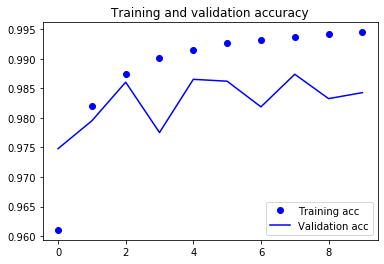

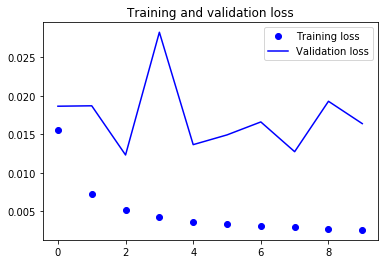

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
#PKLOK 
test_dir = '/datasets/test'
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=128,
        class_mode='binary')
test_loss, test_acc = model.evaluate(test_generator, steps= 3617) # 1500/20=75 462856/128=3617
print(' PKLOK test acc:', test_acc)

Found 462856 images belonging to 2 classes.
3617/3617 [==============================] - 2434s 673ms/step - loss: 0.0443 - acc: 0.8883
 PKLOK test acc: 0.8883367776870728


In [0]:
#CNR Test
test_dir = './datasets/CNR-EXT-Patches-150x150/test'
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=128,
        class_mode='binary')
test_loss, test_acc = model.evaluate(test_generator, steps= 249) # 1500/20=75 31825/128=249
print('CNR test acc:', test_acc)

Found 31825 images belonging to 2 classes.
249/249 [==============================] - 171s 685ms/step - loss: 0.0173 - acc: 0.9736
CNR test acc: 0.9735742211341858


In [0]:
#PKLOK bright
test_dir = '/datasets/smlPKLOT_data/bright/test'
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=128,
        class_mode='binary')
test_loss, test_acc = model.evaluate(test_generator, steps= 1406) # 1500/20=75 462856/128=3617 179866/128=1406
print(' PKLOK bright test acc:', test_acc)

Found 179866 images belonging to 2 classes.
1406/1406 [==============================] - 948s 674ms/step - loss: 0.0346 - acc: 0.9412
 PKLOK bright test acc: 0.9412340521812439


In [0]:
#PKLOK dark
test_dir = '/datasets/smlPKLOT_data/darker/test'
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=128,
        class_mode='binary')
test_loss, test_acc = model.evaluate(test_generator, steps= 2211) # 1500/20=75 462856/128=3617 282990/128=2211
print(' PKLOK dark test acc:', test_acc)

Found 282990 images belonging to 2 classes.
2211/2211 [==============================] - 1561s 706ms/step - loss: 0.0505 - acc: 0.8545
 PKLOK dark test acc: 0.8545355200767517


# Other Image enhancement method

### Retinex method -- for low-light image to high-light image

In [0]:
# testing 1
import numpy as np
import cv2
from scipy.spatial import distance
from scipy.ndimage.filters import convolve
from scipy.sparse import diags, csr_matrix
from scipy.sparse.linalg import spsolve

# std
import argparse
from argparse import RawTextHelpFormatter
import glob
from os import makedirs
from os.path import join, exists, basename, splitext
# 3p
import cv2
from tqdm import tqdm


def create_spacial_affinity_kernel(spatial_sigma: float, size: int = 15):
    """Create a kernel (`size` * `size` matrix) that will be used to compute the he spatial affinity based Gaussian weights.

    Arguments:
        spatial_sigma {float} -- Spatial standard deviation.

    Keyword Arguments:
        size {int} -- size of the kernel. (default: {15})

    Returns:
        np.ndarray - `size` * `size` kernel
    """
    kernel = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            kernel[i, j] = np.exp(-0.5 * (distance.euclidean((i, j), (size // 2, size // 2)) ** 2) / (spatial_sigma ** 2))

    return kernel


def compute_smoothness_weights(L: np.ndarray, x: int, kernel: np.ndarray, eps: float = 1e-3):
    """Compute the smoothness weights used in refining the illumination map optimization problem.

    Arguments:
        L {np.ndarray} -- the initial illumination map to be refined.
        x {int} -- the direction of the weights. Can either be x=1 for horizontal or x=0 for vertical.
        kernel {np.ndarray} -- spatial affinity matrix

    Keyword Arguments:
        eps {float} -- small constant to avoid computation instability. (default: {1e-3})

    Returns:
        np.ndarray - smoothness weights according to direction x. same dimension as `L`.
    """
    Lp = cv2.Sobel(L, cv2.CV_64F, int(x == 1), int(x == 0), ksize=1)
    T = convolve(np.ones_like(L), kernel, mode='constant')
    T = T / (np.abs(convolve(Lp, kernel, mode='constant')) + eps)
    return T / (np.abs(Lp) + eps)


def fuse_multi_exposure_images(im: np.ndarray, under_ex: np.ndarray, over_ex: np.ndarray,
                               bc: float = 1, bs: float = 1, be: float = 1):
    """perform the exposure fusion method used in the DUAL paper.

    Arguments:
        im {np.ndarray} -- input image to be enhanced.
        under_ex {np.ndarray} -- under-exposure corrected image. same dimension as `im`.
        over_ex {np.ndarray} -- over-exposure corrected image. same dimension as `im`.

    Keyword Arguments:
        bc {float} -- parameter for controlling the influence of Mertens's contrast measure. (default: {1})
        bs {float} -- parameter for controlling the influence of Mertens's saturation measure. (default: {1})
        be {float} -- parameter for controlling the influence of Mertens's well exposedness measure. (default: {1})

    Returns:
        np.ndarray -- the fused image. same dimension as `im`.
    """
    merge_mertens = cv2.createMergeMertens(bc, bs, be)
    images = [np.clip(x * 255, 0, 255).astype("uint8") for x in [im, under_ex, over_ex]]
    fused_images = merge_mertens.process(images)
    return fused_images


def refine_illumination_map_linear(L: np.ndarray, gamma: float, lambda_: float, kernel: np.ndarray, eps: float = 1e-3):
    """Refine the illumination map based on the optimization problem described in the two papers.
       This function use the sped-up solver presented in the LIME paper.

    Arguments:
        L {np.ndarray} -- the illumination map to be refined.
        gamma {float} -- gamma correction factor.
        lambda_ {float} -- coefficient to balance the terms in the optimization problem.
        kernel {np.ndarray} -- spatial affinity matrix.

    Keyword Arguments:
        eps {float} -- small constant to avoid computation instability (default: {1e-3}).

    Returns:
        np.ndarray -- refined illumination map. same shape as `L`.
    """
    # compute smoothness weights
    wx = compute_smoothness_weights(L, x=1, kernel=kernel, eps=eps)
    wy = compute_smoothness_weights(L, x=0, kernel=kernel, eps=eps)

    n, m = L.shape
    L_1d = L.copy().flatten()

    # compute the five-point spatially inhomogeneous Laplacian matrix
    row, column, data = [], [], []
    for p in range(n * m):
        diag = 0
        for q, (k, l, x) in get_sparse_neighbor(p, n, m).items():
            weight = wx[k, l] if x else wy[k, l]
            row.append(p)
            column.append(q)
            data.append(-weight)
            diag += weight
        row.append(p)
        column.append(p)
        data.append(diag)
    F = csr_matrix((data, (row, column)), shape=(n * m, n * m))

    # solve the linear system
    Id = diags([np.ones(n * m)], [0])
    A = Id + lambda_ * F
    L_refined = spsolve(csr_matrix(A), L_1d, permc_spec=None, use_umfpack=True).reshape((n, m))

    # gamma correction
    L_refined = np.clip(L_refined, eps, 1) ** gamma

    return L_refined


def correct_underexposure(im: np.ndarray, gamma: float, lambda_: float, kernel: np.ndarray, eps: float = 1e-3):
    """correct underexposudness using the retinex based algorithm presented in DUAL and LIME paper.

    Arguments:
        im {np.ndarray} -- input image to be corrected.
        gamma {float} -- gamma correction factor.
        lambda_ {float} -- coefficient to balance the terms in the optimization problem.
        kernel {np.ndarray} -- spatial affinity matrix.

    Keyword Arguments:
        eps {float} -- small constant to avoid computation instability (default: {1e-3})

    Returns:
        np.ndarray -- image underexposudness corrected. same shape as `im`.
    """

    # first estimation of the illumination map
    L = np.max(im, axis=-1)
    # illumination refinement
    L_refined = refine_illumination_map_linear(L, gamma, lambda_, kernel, eps)

    # correct image underexposure
    L_refined_3d = np.repeat(L_refined[..., None], 3, axis=-1)
    im_corrected = im / L_refined_3d
    return im_corrected

# TODO: resize image if too large, optimization take too much time


def enhance_image_exposure(im: np.ndarray, gamma: float, lambda_: float, dual: bool = True, sigma: int = 3,
                           bc: float = 1, bs: float = 1, be: float = 1, eps: float = 1e-3):
    """Enhance input image, using either DUAL method, or LIME method. For more info, please see original papers.

    Arguments:
        im {np.ndarray} -- input image to be corrected.
        gamma {float} -- gamma correction factor.
        lambda_ {float} -- coefficient to balance the terms in the optimization problem (in DUAL and LIME).

    Keyword Arguments:
        dual {bool} -- boolean variable to indicate enhancement method to be used (either DUAL or LIME) (default: {True})
        sigma {int} -- Spatial standard deviation for spatial affinity based Gaussian weights. (default: {3})
        bc {float} -- parameter for controlling the influence of Mertens's contrast measure. (default: {1})
        bs {float} -- parameter for controlling the influence of Mertens's saturation measure. (default: {1})
        be {float} -- parameter for controlling the influence of Mertens's well exposedness measure. (default: {1})
        eps {float} -- small constant to avoid computation instability (default: {1e-3})

    Returns:
        np.ndarray -- image exposure enhanced. same shape as `im`.
    """
    # create spacial affinity kernel
    kernel = create_spacial_affinity_kernel(sigma)

    # correct underexposudness
    im_normalized = im.astype(float) / 255.
    under_corrected = correct_underexposure(im_normalized, gamma, lambda_, kernel, eps)

    if dual:
        # correct overexposure and merge if DUAL method is selected
        inv_im_normalized = 1 - im_normalized
        over_corrected = 1 - correct_underexposure(inv_im_normalized, gamma, lambda_, kernel, eps)
        # fuse images
        im_corrected = fuse_multi_exposure_images(im_normalized, under_corrected, over_corrected, bc, bs, be)
    else:
        im_corrected = under_corrected

    # convert to 8 bits and returns
    return np.clip(im_corrected * 255, 0, 255).astype("uint8")

def get_sparse_neighbor(p: int, n: int, m: int):
    """Returns a dictionnary, where the keys are index of 4-neighbor of `p` in the sparse matrix,
       and values are tuples (i, j, x), where `i`, `j` are index of neighbor in the normal matrix,
       and x is the direction of neighbor.

    Arguments:
        p {int} -- index in the sparse matrix.
        n {int} -- number of rows in the original matrix (non sparse).
        m {int} -- number of columns in the original matrix.

    Returns:
        dict -- dictionnary containing indices of 4-neighbors of `p`.
    """
    i, j = p // m, p % m
    d = {}
    if i - 1 >= 0:
        d[(i - 1) * m + j] = (i - 1, j, 0)
    if i + 1 < n:
        d[(i + 1) * m + j] = (i + 1, j, 0)
    if j - 1 >= 0:
        d[i * m + j - 1] = (i, j - 1, 1)
    if j + 1 < m:
        d[i * m + j + 1] = (i, j + 1, 1)
    return d

def main(img, gamma_ = 0.6, lambda_ = 0.15, imdir = '/content/gdrive/FYP/'):

    # load images
    print('new\n')
    #imdir = args.folder
    #imdir = '/content/gdrive/FYP/a_greatsunny/' #args.folder
    #ext = ['png', 'jpg', 'bmp']    # Add image formats here
    #files = []
    #[files.extend(glob.glob(imdir + '*.' + e)) for e in ext]
    #images = [cv2.imread(file) for file in files]
    images = [img]
    #print(images)
    # create save directory
    directory = join(imdir, "enhanced")
    if not os.path.exists(directory):
        os.makedirs(directory)
    print('add gamma_ and lamba_\n')
    # enhance images
    for i, image in tqdm(enumerate(images), desc="Enhancing images"):
        #enhanced_image = enhance_image_exposure(image, args.gamma, args.lambda_, not args.lime,
        #                                        sigma=args.sigma, bc=args.bc, bs=args.bs, be=args.be, eps=args.eps)
        enhanced_image = enhance_image_exposure(image, gamma_, lambda_, not 'store_true',
                                                sigma=3, bc=1, bs=1, be=1, eps=1e-3)

        filename = '1.jpg'#basename(files[i])
        name, ext = splitext(filename)
        method = "LIME" if 'store_true' else "DUAL"
        corrected_name = f"{name}_{method}_g{gamma_}_l{lambda_}{ext}"
        cv2.imwrite(join(directory, corrected_name), enhanced_image)

def check_brightness(image, size = (150, 150)):
    img = cv2.resize(image, size)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, size)
    return cv2.mean(blur)[0]

if __name__ == "__main__":
    # input a image
    img_path = '/content/gdrive/' 
    img = cv2.imread(img_path + '/normal2.jpg')
    print(check_brightness(img))

    save_path = '/content/gdrive/FYP/enhanced/'
    # increase the brightness of the input image to img_path/enhanced/X.jpg
    main(img, gamma_ = 0.6, lambda_ = 0.15, imdir=save_path)
    print(check_brightness(cv2.imread(save_path + '1_LIME_g0.6_l0.15.jpg')))

Enhancing images: 0it [00:00, ?it/s]

92.15942222222223
new

add gamma_ and lamba_



Enhancing images: 1it [00:00,  3.32it/s]

164.50084444444445


# model adjustment testing

### Model adjust

model 12

In [0]:
# building network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import optimizers

model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
                        #input_shape=(150, 150, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.ZeroPadding2D(padding=(1, 1), data_format=None))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5, noise_shape = None, seed = None))
model.add(layers.Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
batch_normalization_6 (Batch (None, 148, 148, 32)      128       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
batch_normalization_7 (Batch (None, 72, 72, 64)        256       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 34, 34, 128)      

In [0]:
# Data Preprocessing
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# All images will be rescaled by 1./255
#train_datagen = ImageDataGenerator(rescale=1./255)

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),  #(75, 75),
        batch_size=20,#20
        class_mode='binary')

# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/test_12_cnn_0519_30_datagenImprove_9.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

Found 5000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.2181 - acc: 0.9216
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/test_12_cnn_0519_30_datagenImprove_9.h5
250/250 [==============================] - 38s 152ms/step - loss: 0.2181 - acc: 0.9216 - val_loss: 3.0570 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.1763 - acc: 0.9382
Epoch 00002: val_acc improved from 0.28200 to 0.91300, saving model to /content/gdrive/FYP/test_12_cnn_0519_30_datagenImprove_9.h5
250/250 [==============================] - 38s 153ms/step - loss: 0.1763 - acc: 0.9382 - val_loss: 0.2185 - val_acc: 0.9130
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.1753 - acc: 0.9398
Epoch 00003: val_acc improved from 0.91300 to 0.96700, saving model to /content/gdrive/FYP/test_12_cnn_0519_30_datagenImprove_9.h5
250/250 [==============================] - 38s 150ms/step - loss: 0.1753 - acc: 0.9398 - 

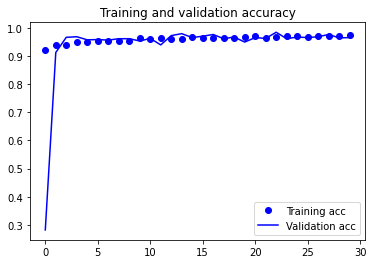

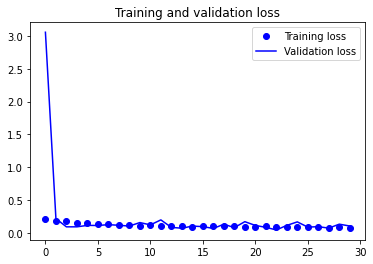

In [0]:
# test_12_cnn_0519_30_datagenImprove_8
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
# test_12_cnn_0519_30_datagenImprove_8
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 75) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9806666374206543


### Focal loss adjust

#####bin_inner loss

##### alp = 0.25 (origanal)

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0424 - acc: 0.8946
Epoch 00001: val_acc improved from -inf to 0.30200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_30_0520_2.h5
250/250 [==============================] - 19s 78ms/step - loss: 0.0424 - acc: 0.8946 - val_loss: 0.5725 - val_acc: 0.3020
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0283 - acc: 0.9232
Epoch 00002: val_acc improved from 0.30200 to 0.89100, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_30_0520_2.h5
250/250 [==============================] - 20s 81ms/step - loss: 0.0283 - acc: 0.9232 - val_loss: 0.0507 - val_acc: 0.8910
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0192 - acc: 0.9422
Epoch 00003: val_acc improved from 0.89100 to 0.96400, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_30_0520_2.h5
250/250 [==============================] - 20s 80ms/step - loss: 0.0192 - acc: 0.9422 - 

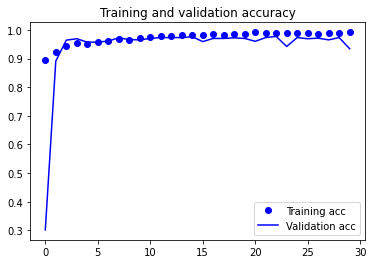

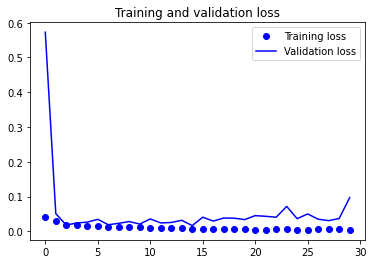

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9513333439826965


In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test1_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator = test_datagen.flow_from_directory(
        test1_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')
test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 8000 images belonging to 2 classes.
test acc: 0.9146000146865845


##### alp = 4.0

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp4_0_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: -22.4707 - acc: 0.4830
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp4_0_30_0520_1.h5
250/250 [==============================] - 35s 140ms/step - loss: -22.4707 - acc: 0.4830 - val_loss: -20.6372 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: -24.1438 - acc: 0.4936
Epoch 00002: val_acc did not improve from 0.28200
250/250 [==============================] - 35s 141ms/step - loss: -24.1438 - acc: 0.4936 - val_loss: -33.2603 - val_acc: 0.2820
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: -24.1453 - acc: 0.4936
Epoch 00003: val_acc did not improve from 0.28200
250/250 [==============================] - 35s 138ms/step - loss: -24.1453 - acc: 0.4936 - val_loss: -33.9519 - val_acc: 0.2820
Epoch 4/30
250/250 [==============================] - ETA: 0s - loss: -24.1595 - acc: 0.4936
Epoch 00

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-21-d9e460e6c777>", line 9, in <module>
    validation_steps=50, callbacks=cb_list) # 1000/20=50
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/util/deprecation.py", line 324, in new_func
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py", line 1479, in fit_generator
    initial_epoch=initial_epoch)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py", line 66, in _method_wrapper
    return method(self, *args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py", line 855, in fit
    callbacks.on_train_batch_end(step, logs)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/callba

KeyboardInterrupt: ignored

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 75) # 1500/20=75
print('test acc:', test_acc)

##### alp = 0.1

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp01_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0340 - acc: 0.8262
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp01_30_0520_1.h5
250/250 [==============================] - 35s 138ms/step - loss: 0.0340 - acc: 0.8262 - val_loss: 1.1201 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0234 - acc: 0.8636
Epoch 00002: val_acc improved from 0.28200 to 0.86200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp01_30_0520_1.h5
250/250 [==============================] - 35s 141ms/step - loss: 0.0234 - acc: 0.8636 - val_loss: 0.0903 - val_acc: 0.8620
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0204 - acc: 0.8754
Epoch 00003: val_acc improved from 0.86200 to 0.95100, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp01_30_0520_1.h5
250/250 [==============================] - 35s 139ms/step - loss: 0.

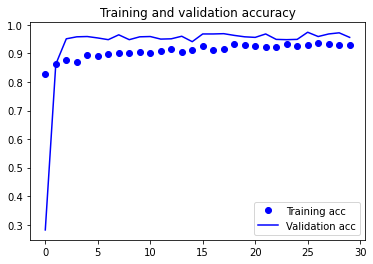

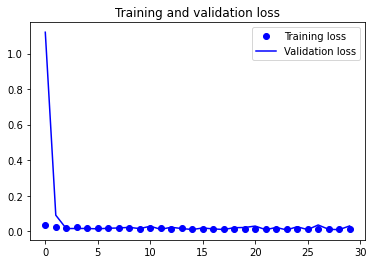

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9633333086967468


##### alp = 0.2

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp02_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0403 - acc: 0.8632
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp02_30_0520_1.h5
250/250 [==============================] - 34s 137ms/step - loss: 0.0403 - acc: 0.8632 - val_loss: 0.9351 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0339 - acc: 0.8862
Epoch 00002: val_acc improved from 0.28200 to 0.90800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp02_30_0520_1.h5
250/250 [==============================] - 35s 140ms/step - loss: 0.0339 - acc: 0.8862 - val_loss: 0.0544 - val_acc: 0.9080
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0250 - acc: 0.9060
Epoch 00003: val_acc improved from 0.90800 to 0.96000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp02_30_0520_1.h5
250/250 [==============================] - 34s 138ms/step - loss: 0.

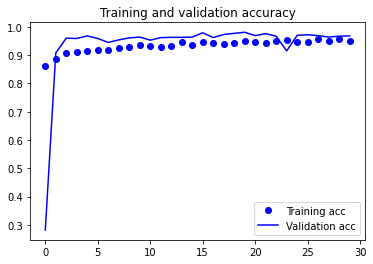

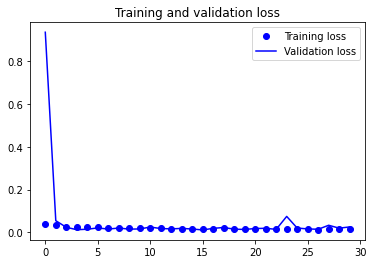

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9779999852180481


##### alp = 0.3

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp03_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0508 - acc: 0.8778
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp03_30_0520_1.h5
250/250 [==============================] - 35s 140ms/step - loss: 0.0508 - acc: 0.8778 - val_loss: 1.1972 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0353 - acc: 0.9070
Epoch 00002: val_acc improved from 0.28200 to 0.80200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp03_30_0520_1.h5
250/250 [==============================] - 35s 140ms/step - loss: 0.0353 - acc: 0.9070 - val_loss: 0.0993 - val_acc: 0.8020
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0333 - acc: 0.9140
Epoch 00003: val_acc improved from 0.80200 to 0.96000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp03_30_0520_1.h5
250/250 [==============================] - 36s 142ms/step - loss: 0.

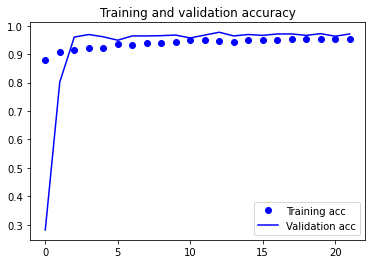

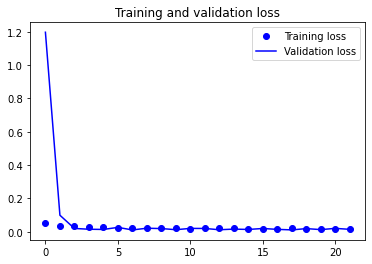

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9706666469573975


##### alp = 0.4

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp04_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0504 - acc: 0.8878
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp04_30_0520_1.h5
250/250 [==============================] - 35s 139ms/step - loss: 0.0504 - acc: 0.8878 - val_loss: 0.5711 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0375 - acc: 0.9120
Epoch 00002: val_acc improved from 0.28200 to 0.88000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp04_30_0520_1.h5
250/250 [==============================] - 35s 141ms/step - loss: 0.0375 - acc: 0.9120 - val_loss: 0.0592 - val_acc: 0.8800
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0302 - acc: 0.9254
Epoch 00003: val_acc improved from 0.88000 to 0.96200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp04_30_0520_1.h5
250/250 [==============================] - 35s 139ms/step - loss: 0.

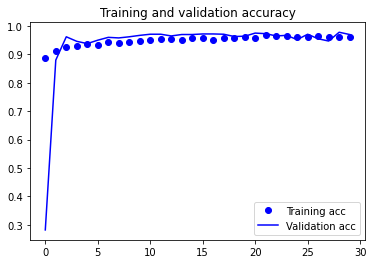

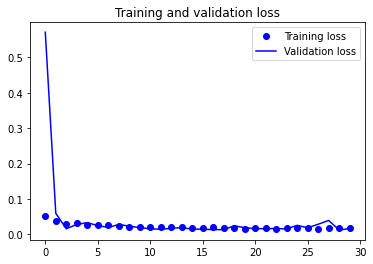

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9753333330154419


##### alp = 0.5

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp05_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0539 - acc: 0.8840
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp05_30_0520_1.h5
250/250 [==============================] - 36s 146ms/step - loss: 0.0539 - acc: 0.8840 - val_loss: 0.4801 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0368 - acc: 0.9132
Epoch 00002: val_acc improved from 0.28200 to 0.82000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp05_30_0520_1.h5
250/250 [==============================] - 37s 148ms/step - loss: 0.0368 - acc: 0.9132 - val_loss: 0.0766 - val_acc: 0.8200
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0369 - acc: 0.9214
Epoch 00003: val_acc improved from 0.82000 to 0.94800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp05_30_0520_1.h5
250/250 [==============================] - 37s 148ms/step - loss: 0.

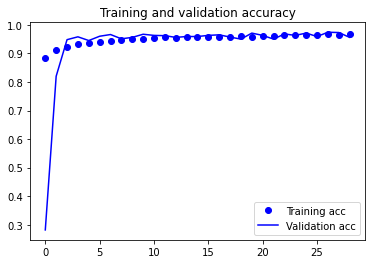

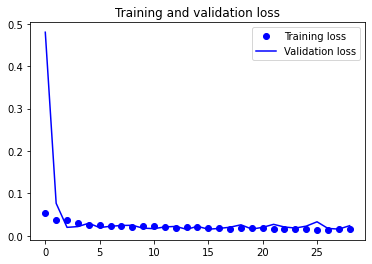

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 75) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9733333587646484


##### alp = 0.45

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0472 - acc: 0.9050
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_30_0520_2.h5
250/250 [==============================] - 20s 79ms/step - loss: 0.0472 - acc: 0.9050 - val_loss: 0.5330 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0264 - acc: 0.9370
Epoch 00002: val_acc improved from 0.28200 to 0.86000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_30_0520_2.h5
250/250 [==============================] - 20s 80ms/step - loss: 0.0264 - acc: 0.9370 - val_loss: 0.0680 - val_acc: 0.8600
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0236 - acc: 0.9488
Epoch 00003: val_acc improved from 0.86000 to 0.96700, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_30_0520_2.h5
250/250 [==============================] - 20s 82ms/step - loss: 0.0236 - acc: 

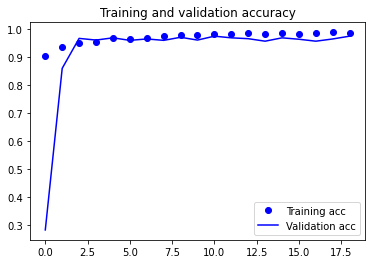

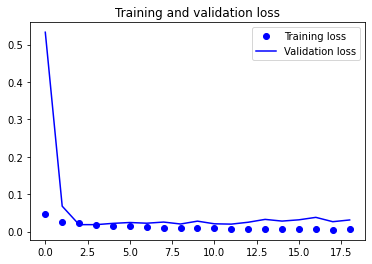

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9806666374206543


In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test1_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator = test_datagen.flow_from_directory(
        test1_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')
test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 8000 images belonging to 2 classes.
test acc: 0.8082000017166138


##### alp = 0.42

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0504 - acc: 0.8862
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_30_0520_1.h5
250/250 [==============================] - 58s 231ms/step - loss: 0.0504 - acc: 0.8862 - val_loss: 0.8860 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0387 - acc: 0.9070
Epoch 00002: val_acc improved from 0.28200 to 0.80000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_30_0520_1.h5
250/250 [==============================] - 60s 239ms/step - loss: 0.0387 - acc: 0.9070 - val_loss: 0.0774 - val_acc: 0.8000
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0297 - acc: 0.9280
Epoch 00003: val_acc improved from 0.80000 to 0.94800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_30_0520_1.h5
250/250 [==============================] - 64s 256ms/step - loss: 0.0297 - ac

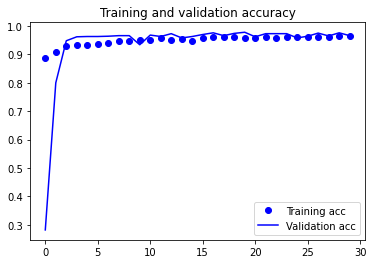

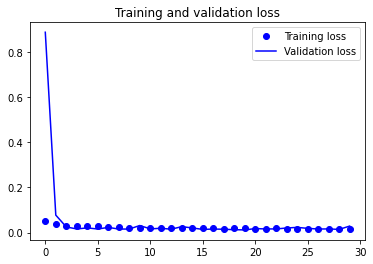

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.972000002861023


##### alp = 0.48

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0510 - acc: 0.8978
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_30_0520_1.h5
250/250 [==============================] - 34s 137ms/step - loss: 0.0510 - acc: 0.8978 - val_loss: 1.0032 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0391 - acc: 0.9174
Epoch 00002: val_acc improved from 0.28200 to 0.85600, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_30_0520_1.h5
250/250 [==============================] - 35s 142ms/step - loss: 0.0391 - acc: 0.9174 - val_loss: 0.0621 - val_acc: 0.8560
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0333 - acc: 0.9234
Epoch 00003: val_acc improved from 0.85600 to 0.95400, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_30_0520_1.h5
250/250 [==============================] - 35s 140ms/step - loss: 0.0333 - ac

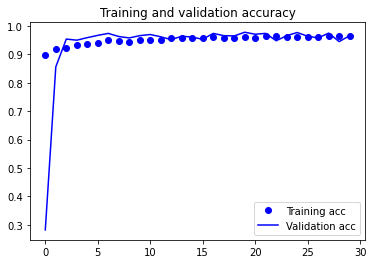

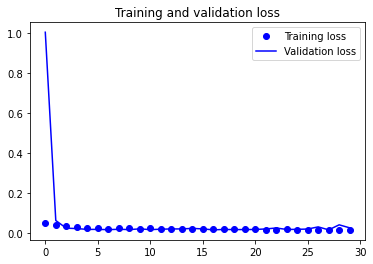

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.968666672706604


##### alp = 0.15

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp015_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0425 - acc: 0.8314
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp015_30_0520_1.h5
250/250 [==============================] - 37s 147ms/step - loss: 0.0425 - acc: 0.8314 - val_loss: 0.7570 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0282 - acc: 0.8782
Epoch 00002: val_acc improved from 0.28200 to 0.88500, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp015_30_0520_1.h5
250/250 [==============================] - 36s 146ms/step - loss: 0.0282 - acc: 0.8782 - val_loss: 0.0754 - val_acc: 0.8850
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0241 - acc: 0.8984
Epoch 00003: val_acc improved from 0.88500 to 0.94800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp015_30_0520_1.h5
250/250 [==============================] - 36s 145ms/step - loss:

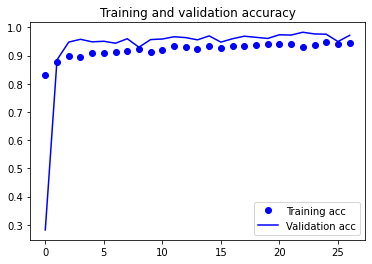

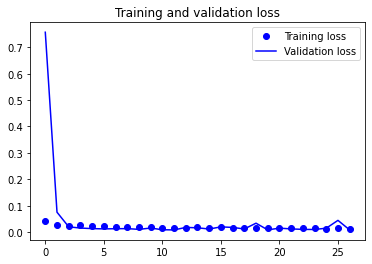

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9633333086967468


##### alp = 0.18

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp018_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0452 - acc: 0.8362
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp018_30_0520_1.h5
250/250 [==============================] - 36s 143ms/step - loss: 0.0452 - acc: 0.8362 - val_loss: 0.5875 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0303 - acc: 0.8834
Epoch 00002: val_acc improved from 0.28200 to 0.87900, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp018_30_0520_1.h5
250/250 [==============================] - 36s 145ms/step - loss: 0.0303 - acc: 0.8834 - val_loss: 0.0759 - val_acc: 0.8790
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0271 - acc: 0.8934
Epoch 00003: val_acc improved from 0.87900 to 0.94500, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp018_30_0520_1.h5
250/250 [==============================] - 36s 144ms/step - loss:

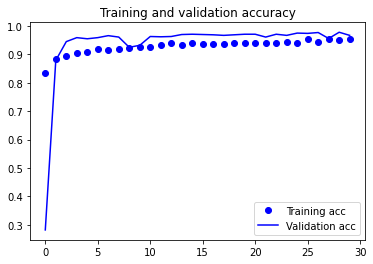

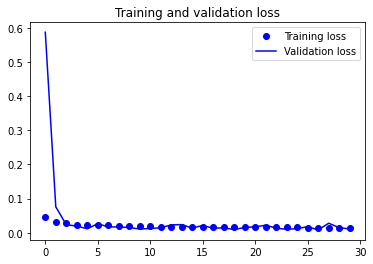

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9633333086967468


##### alp = 0.27

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp027_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0507 - acc: 0.8724
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp027_30_0520_1.h5
250/250 [==============================] - 35s 142ms/step - loss: 0.0507 - acc: 0.8724 - val_loss: 1.0521 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0343 - acc: 0.9058
Epoch 00002: val_acc improved from 0.28200 to 0.85100, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp027_30_0520_1.h5
250/250 [==============================] - 36s 143ms/step - loss: 0.0343 - acc: 0.9058 - val_loss: 0.0701 - val_acc: 0.8510
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0315 - acc: 0.9144
Epoch 00003: val_acc improved from 0.85100 to 0.94600, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss_alp027_30_0520_1.h5
250/250 [==============================] - 36s 144ms/step - loss:

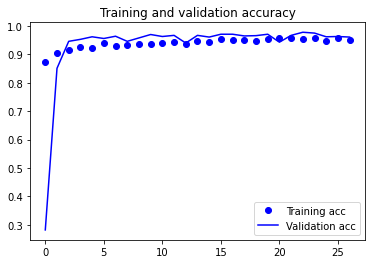

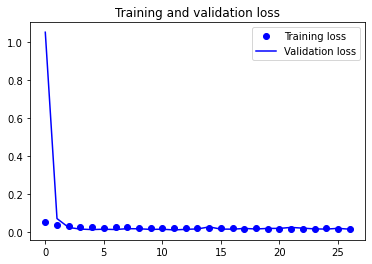

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9606666564941406


##### alp = 0.25 (origanal) gamma=1.5

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss025_gamma1_5_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0527 - acc: 0.8792
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss025_gamma1_5_30_0520_1.h5
250/250 [==============================] - 34s 137ms/step - loss: 0.0527 - acc: 0.8792 - val_loss: 1.0846 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0386 - acc: 0.9160
Epoch 00002: val_acc improved from 0.28200 to 0.88200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss025_gamma1_5_30_0520_1.h5
250/250 [==============================] - 34s 138ms/step - loss: 0.0386 - acc: 0.9160 - val_loss: 0.0975 - val_acc: 0.8820
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0378 - acc: 0.9150
Epoch 00003: val_acc improved from 0.88200 to 0.96100, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss025_gamma1_5_30_0520_1.h5
250/250 [==============================] - 34s 137

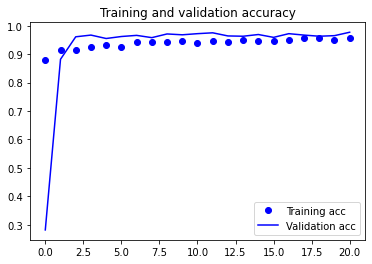

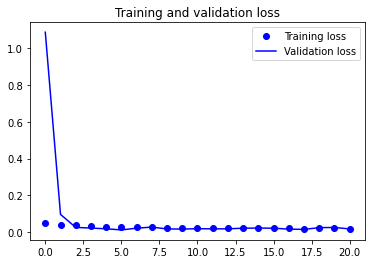

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9793333411216736


##### alp = 0.45 gamma=1.1

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_1_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0737 - acc: 0.9014
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_1_30_0520_2.h5
250/250 [==============================] - 50s 202ms/step - loss: 0.0737 - acc: 0.9014 - val_loss: 0.6832 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0547 - acc: 0.9256
Epoch 00002: val_acc improved from 0.28200 to 0.88900, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_1_30_0520_2.h5
250/250 [==============================] - 49s 195ms/step - loss: 0.0547 - acc: 0.9256 - val_loss: 0.0730 - val_acc: 0.8890
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0493 - acc: 0.9342
Epoch 00003: val_acc improved from 0.88900 to 0.93800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss

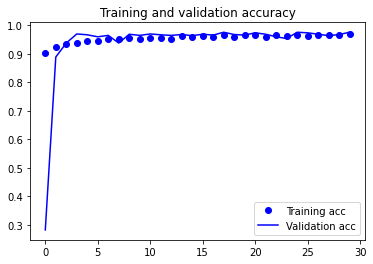

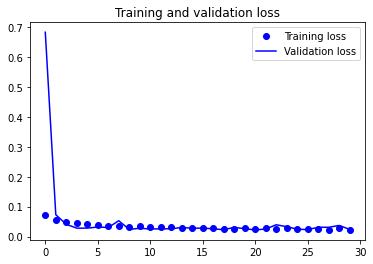

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
Instructions for updating:
Please use Model.evaluate, which supports generators.
test acc: 0.981333315372467


##### alp = 0.45 gamma=1.3

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_3_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0624 - acc: 0.9018
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_3_30_0520_2.h5
250/250 [==============================] - 49s 197ms/step - loss: 0.0624 - acc: 0.9018 - val_loss: 0.7303 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0481 - acc: 0.9268
Epoch 00002: val_acc improved from 0.28200 to 0.85300, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_3_30_0520_2.h5
250/250 [==============================] - 49s 197ms/step - loss: 0.0481 - acc: 0.9268 - val_loss: 0.0855 - val_acc: 0.8530
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0416 - acc: 0.9356
Epoch 00003: val_acc improved from 0.85300 to 0.95700, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_3_30_0520_2.h5
250/250 [==============================] - 50s 199

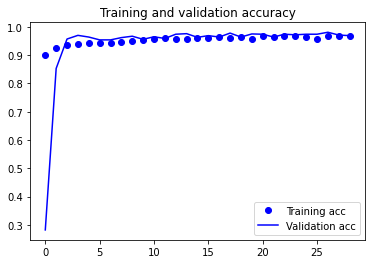

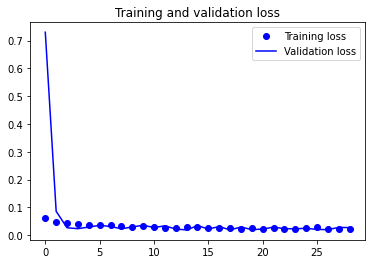

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9700000286102295


##### alp = 0.45 gamma=1.5

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_5_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0556 - acc: 0.9100
Epoch 00001: val_acc improved from -inf to 0.30600, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_5_30_0520_2.h5
250/250 [==============================] - 35s 139ms/step - loss: 0.0556 - acc: 0.9100 - val_loss: 0.4333 - val_acc: 0.3060
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0445 - acc: 0.9192
Epoch 00002: val_acc improved from 0.30600 to 0.90900, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_5_30_0520_2.h5
250/250 [==============================] - 36s 143ms/step - loss: 0.0445 - acc: 0.9192 - val_loss: 0.0543 - val_acc: 0.9090
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0392 - acc: 0.9308
Epoch 00003: val_acc improved from 0.90900 to 0.94400, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_5_30_0520_2.h5
250/250 [==============================] - 35s 141

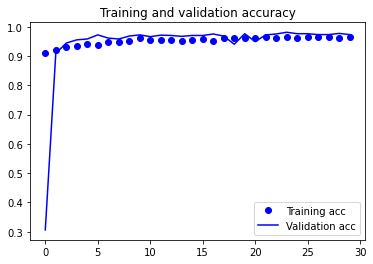

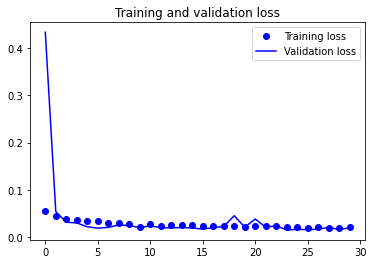

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.


test acc: 0.9779999852180481


##### alp = 0.45 gamma=1.7

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_7_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.8922
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_7_30_0520_2.h5
250/250 [==============================] - 57s 228ms/step - loss: 0.0600 - acc: 0.8922 - val_loss: 0.6792 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0460 - acc: 0.9122
Epoch 00002: val_acc improved from 0.28200 to 0.87100, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_7_30_0520_2.h5
250/250 [==============================] - 58s 231ms/step - loss: 0.0460 - acc: 0.9122 - val_loss: 0.0762 - val_acc: 0.8710
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0360 - acc: 0.9306
Epoch 00003: val_acc improved from 0.87100 to 0.94600, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_7_30_0520_2.h5
250/250 [==============================] - 58s 233

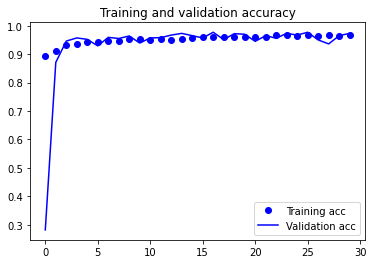

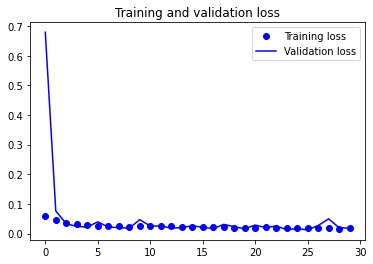

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9786666631698608


##### alp = 0.45 gamma=1.0

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_0_30_0520_2.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0058 - acc: 0.9934
Epoch 00001: val_acc improved from -inf to 0.97300, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_0_30_0520_2.h5
250/250 [==============================] - 20s 79ms/step - loss: 0.0058 - acc: 0.9934 - val_loss: 0.0537 - val_acc: 0.9730
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0044 - acc: 0.9950
Epoch 00002: val_acc improved from 0.97300 to 0.97900, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_0_30_0520_2.h5
250/250 [==============================] - 19s 76ms/step - loss: 0.0044 - acc: 0.9950 - val_loss: 0.0516 - val_acc: 0.9790
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0048 - acc: 0.9954
Epoch 00003: val_acc did not improve from 0.97900
250/250 [==============================] - 18s 74ms/step - loss: 0.0048 - acc: 0.9954 - val_loss: 0.0467 - val_acc: 0.9740
Epoch 4/30
250/250 [===

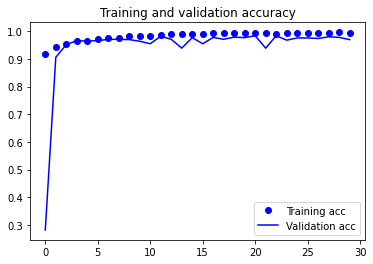

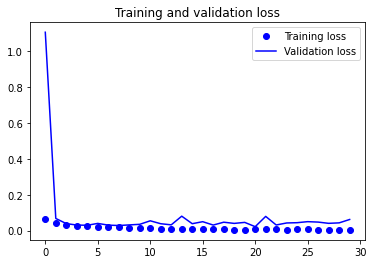

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,

        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.984000027179718


In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test1_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator = test_datagen.flow_from_directory(
        test1_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')
test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 8000 images belonging to 2 classes.
test acc: 0.7847999930381775


##### alp = 0.45 gamma=1.2

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_2_30_0520_3.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0026 - acc: 0.9982
Epoch 00001: val_acc improved from -inf to 0.98000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss045_gamma1_2_30_0520_3.h5
250/250 [==============================] - 19s 78ms/step - loss: 0.0026 - acc: 0.9982 - val_loss: 0.0620 - val_acc: 0.9800
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0040 - acc: 0.9958
Epoch 00002: val_acc did not improve from 0.98000
250/250 [==============================] - 19s 78ms/step - loss: 0.0040 - acc: 0.9958 - val_loss: 0.1084 - val_acc: 0.9410
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0032 - acc: 0.9976
Epoch 00003: val_acc did not improve from 0.98000
250/250 [==============================] - 20s 80ms/step - loss: 0.0032 - acc: 0.9976 - val_loss: 0.0876 - val_acc: 0.9520
Epoch 4/30
250/250 [==============================] - ETA: 0s - loss: 0.0030 - acc: 0.9974
Epoch 00004: val_acc did n

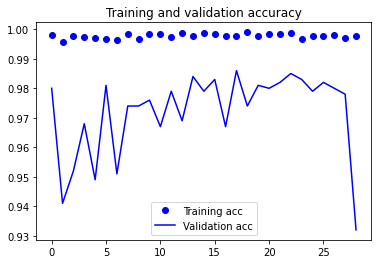

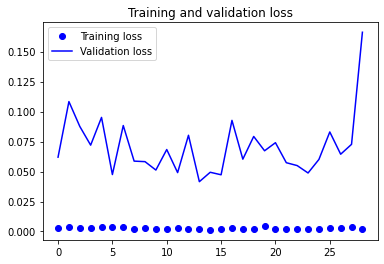

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9413333535194397


In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test1_dir = "/content/gdrive/FYP/PKlotdataset/test"
test_generator = test_datagen.flow_from_directory(
        test1_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')
test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 8000 images belonging to 2 classes.
test acc: 0.8511999845504761


##### alp = 0.48 gamma=1.5

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_gamma1_5_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0674 - acc: 0.8912
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_gamma1_5_30_0520_1.h5
250/250 [==============================] - 35s 141ms/step - loss: 0.0674 - acc: 0.8912 - val_loss: 1.3028 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0466 - acc: 0.9214
Epoch 00002: val_acc improved from 0.28200 to 0.89000, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_gamma1_5_30_0520_1.h5
250/250 [==============================] - 35s 142ms/step - loss: 0.0466 - acc: 0.9214 - val_loss: 0.0645 - val_acc: 0.8900
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0398 - acc: 0.9318
Epoch 00003: val_acc improved from 0.89000 to 0.95400, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss048_gamma1_5_30_0520_1.h5
250/250 [==============================] - 35s 140

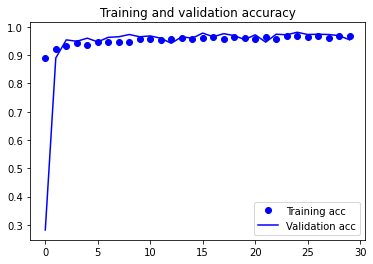

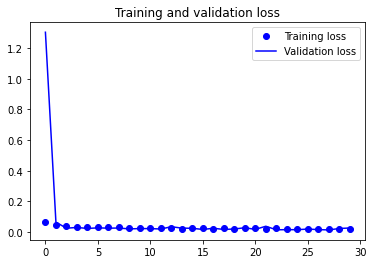

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
test acc: 0.9713333249092102


##### alp = 0.42 gamma=1.5

In [0]:
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import models
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model
# use early stopping to optimally terminate training through callbacks
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# save best model automatically
mc = ModelCheckpoint("/content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_gamma1_5_30_0520_1.h5", monitor='val_acc', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto', period=1)

cb_list = [mc, es]

In [0]:
import time
# Perform the training (fit the model with data)
starttime = time.time()
history = model.fit_generator(
      train_generator,
      steps_per_epoch=250, # 5000/20=250
      epochs=30, #30, 10
      validation_data=validation_generator,
      validation_steps=50, callbacks=cb_list) # 1000/20=50
print(str((time.time()-starttime)/60) + ' (min)')

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/30
250/250 [==============================] - ETA: 0s - loss: 0.0642 - acc: 0.8838 
Epoch 00001: val_acc improved from -inf to 0.28200, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_gamma1_5_30_0520_1.h5
250/250 [==============================] - 3061s 12s/step - loss: 0.0642 - acc: 0.8838 - val_loss: 1.0515 - val_acc: 0.2820
Epoch 2/30
250/250 [==============================] - ETA: 0s - loss: 0.0469 - acc: 0.9206
Epoch 00002: val_acc improved from 0.28200 to 0.85500, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerloss042_gamma1_5_30_0520_1.h5
250/250 [==============================] - 61s 246ms/step - loss: 0.0469 - acc: 0.9206 - val_loss: 0.0761 - val_acc: 0.8550
Epoch 3/30
250/250 [==============================] - ETA: 0s - loss: 0.0387 - acc: 0.9286
Epoch 00003: val_acc improved from 0.85500 to 0.95800, saving model to /content/gdrive/FYP/a_fcn_mymodel_bin_innerlos

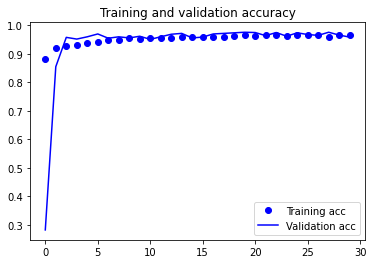

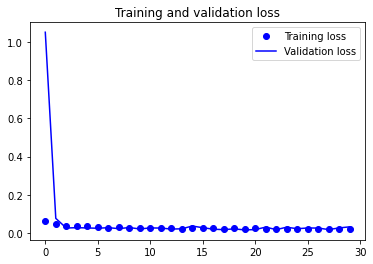

In [0]:
### bin_inner loss
# a_fcn_model_11_10_0519_1
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
# evaluate on test data
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps= 250) # 1500/20=75
print('test acc:', test_acc)

Found 1500 images belonging to 2 classes.
Instructions for updating:
Please use Model.evaluate, which supports generators.
test acc: 0.972000002861023
